# <p style="color:#1BD1E7; font-size:1.5em">**Projeto Aplicado em Ciência de Dados I**</p> 

## <p style="color:#2DC5D7; font-size:1em">**Licenciatura em Ciência de Dados**</p> 

**Turma:** CDB1

* Eliane Susso Efraim Gabriel, Nº 103303

* Marco Delgado Esperança, Nº 110451

* Maria João Ferreira Lourenço, Nº 104716

* Umeima Adam Mahomed, Nº 99239

**Docentes:** Diana Aldea Mendes e Sérgio Moro

**Data:**  2 de Junho de 2023


#### País atribuído:  <span style="color:#2DD791">**BRASIL**</span>
--- 

## 1. Compreensão do problema

**Objetivo:** Previsão do n.º de sets para conclusão de um jogo de ténis profissional (ranking ATP) no Brasil para que os jogadores e treinadores consigam otimizar os planos de treino e táticas utilizadas no jogo.

**Metodologia:** A metodologia seguida será a do CRISP - DM, que poderá ser encontrada ao longo do relatório de projeto.

O seguinte esquema a fim de ilustrar com mais detalhe os temas abordados a cada passo:

![alt text here](https://thumbnails.genial.ly/5ddbcc1acc02400f8a0269bf/screenshots/3e156c1d-f810-4ba1-b1ff-bc212c0832d7.jpg)

---

## 2. Compreensão dos dados

In [1]:
# importação das bibliotecas básicas

## for data
import pandas as pd
from requests_html import HTMLSession
from bs4 import BeautifulSoup
import re
import numpy as np
import datetime

## for plotting
import matplotlib.pyplot as plt
import seaborn as sns

## for statistical tests
import scipy
import statsmodels.formula.api as smf
import statsmodels.api as sm

## for machine learning
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition

## for explainer
from lime import lime_tabular
    
## plot style and warnings    
plt.style.use('ggplot')
from IPython.display import display # Allows the use of display() for DataFrames
import warnings
warnings.filterwarnings('ignore')

### Dataframe ATP e informação básica sobre o dataframe

### Importação do dataset ATP

In [2]:
## importar o dataset atpplayers.json
## ficheiro json

df = pd.read_json('atpplayers.json', lines=True)

### Estrutura do dataset ATP

In [3]:
# conhecer a estrutura dos dados (linhas e colunas)
df.shape

(1308835, 16)

O nosso dataset tem 1308835 linhas e 16 colunas

In [4]:
# primeiras 5 linhas do dataset
df.head(5)

,_id,PlayerName,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,Ground,Prize,GameRound,GameRank,Oponent,WL,Score
0,{'$oid': '624ab34913b144c54b3c9aba'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,Hard,,Semi-Finals,30,Marin Cilic,W,64 62
1,{'$oid': '624ab34913b144c54b3c9abb'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",2022.02.21 - 2022.02.26,Hard,"$2,794,840",Round of 16,26,Karen Khachanov,W,63 76
2,{'$oid': '624ab34913b144c54b3c9abc'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",2021.11.15 - 2021.11.21,Hard,"$7,250,000",Round Robin,12,Cameron Norrie,W,62 61
3,{'$oid': '624ab34913b144c54b3c9abd'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",2021.11.15 - 2021.11.21,Hard,"$7,250,000",Round Robin,5,Andrey Rublev,W,63 62
4,{'$oid': '624ab34913b144c54b3c9abe'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,ATP Masters 1000 Paris,"Paris, France",2021.11.01 - 2021.11.07,Hard,"�5,207,405",Finals,2,Daniil Medvedev,W,46 63 63


In [5]:
# ver o tipo de dados que temos 
print(df.dtypes)

_id           object
PlayerName    object
Born          object
Height        object
Hand          object
LinkPlayer    object
Tournament    object
Location      object
Date          object
Ground        object
Prize         object
GameRound     object
GameRank      object
Oponent       object
WL            object
Score         object
dtype: object


Todas as nossas variáveis são do tipo object.

## 3. Preparação dos dados

### Uniformização da variável `Prize`

In [6]:
import numpy as np
import re

# remover o símbolo do dólar usando expressões regulares
df['Prize'] = df['Prize'].apply(lambda x: re.sub('[^0-9,]', '', x))

# retirar vírgulas
df['Prize'] = df['Prize'].str.replace(',', '')

# converter a variável para float, com NaN como valor padrão para strings vazias
df['Prize'] = df['Prize'].apply(lambda x: int(x) if x != '' else np.nan)

In [7]:
df.head(1)

,_id,PlayerName,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,Ground,Prize,GameRound,GameRank,Oponent,WL,Score
0,{'$oid': '624ab34913b144c54b3c9aba'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,Hard,NaN,Semi-Finals,30,Marin Cilic,W,64 62


Tal como se pode ver retirou-se o símbolo da unidade monetária associada ao prémio, uma vez que o símbolo nem sempre era reconhecido. Substituímos a vírgula por espaço, para ser mais intuitivo que estamos a falar de valores na casa dos milhares ou milhões de unidades monetárias. Decidimos transformar a variável `Prize` num float, devido à sua natureza.

### Criação das variáveis `DateStart` e `DateEnd`

In [8]:
# Separa as datas em duas colunas e insere ao lado da coluna 'Date'

df.insert(9, 'DateStart', df['Date'].str.split(' - ', expand=True)[0])
df.insert(10, 'DateEnd', df['Date'].str.split(' - ', expand=True)[1])

# Converte as colunas 'DateStart' e 'DateEnd' para objetos datetime
df['DateStart'] = pd.to_datetime(df['DateStart'], format='%Y.%m.%d')
df['DateEnd'] = pd.to_datetime(df['DateEnd'], format='%Y.%m.%d')

In [9]:
df.head(1)

,_id,PlayerName,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,GameRank,Oponent,WL,Score
0,{'$oid': '624ab34913b144c54b3c9aba'},Novak Djokovic,"Belgrade, Serbia",188,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,30,Marin Cilic,W,64 62


Verificamos que a variável `Date` tinha a data de início e fim do torneio, pelo que esta tem informação acerca da duração do torneio. De modo, a acrescentar mais informação ao nosso dataset decidimos criar duas novas variáveis: a `DateStart` com a data que se encontra antes de '-' e a `DateEnd` que se encontra por baixo do símbolo '-' e que nos dão informação sobre a data de começo e fim da competição, respetivamente.

### Valores omissos

In [10]:
# valores omissos
df.isna().sum()

_id               0
PlayerName        0
Born              0
Height            0
Hand              0
LinkPlayer        0
Tournament        0
Location          0
Date              0
DateStart         0
DateEnd       12390
Ground            0
Prize         19136
GameRound         0
GameRank          0
Oponent           0
WL                0
Score             0
dtype: int64

As variáveis não têm valores omissos com exceção das variáveis `Prize` e `DateEnd`. É de notar que, apesar da variável `Date` não ter valores omissos, a variável `DateEnd` tem. Esta situação verifica-se pois em certos casos a variável `Date` tem apenas uma data e esta é colocada na variável `DateStart`.

### Imputação dos valores omissos na variável `DateEnd`

In [11]:
df[df['DateEnd'].isna()].head(1)

,_id,PlayerName,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,GameRank,Oponent,WL,Score
37228,{'$oid': '624ab34a13b144c54b3d2c26'},James Duckworth,"Sydney, Australia",183,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/james-duckw...,Great Britain F7,Great Britain,2011.05.09,2011-05-09,NaT,Clay,10000.0,Semi-Finals,273,Yannick Mertens,L,46 26


In [12]:
df["DateEnd"].fillna(df["DateStart"], inplace=True)

Para os valores omissos da variável `DateEnd` substituímos os valores correspondentes pelo os da variável `DateStart`.

### Substituição de valores omissos na variável `Height`

Substituimos os valores omissos da variável `Height` por NaN, por -1 e de seguida por NaN, devido a um erro que se verificava.

In [13]:
# substituindo valores não numéricos por NaN
df['Height'] = pd.to_numeric(df['Height'], errors='coerce')

# substituindo NaN por -1
df['Height'] = df['Height'].fillna(-1)

# convertendo para inteiro
df['Height'] = df['Height'].astype(int)

In [14]:
df.loc[df['Height'] == -1, 'Height'] = np.nan

#### Número de linhas

In [15]:
df.count()

_id           1308835
PlayerName    1308835
Born          1308835
Height         982658
Hand          1308835
LinkPlayer    1308835
Tournament    1308835
Location      1308835
Date          1308835
DateStart     1308835
DateEnd       1308835
Ground        1308835
Prize         1289699
GameRound     1308835
GameRank      1308835
Oponent       1308835
WL            1308835
Score         1308835
dtype: int64

Todas as variáveis têm 1308835 linhas, excepto a variável `Prize` que tem 1289699 linhas e a variável `Height` que tem 982658 linhas.

### Substituição de valores omissos na variável `GameRank`

Substituimos os valores omissos da variável `GameRank` por NaN, por -1 e de seguida por NaN, devido a um erro que se verificava.

In [16]:
# substituindo valores não numéricos por NaN
df['GameRank'] = pd.to_numeric(df['GameRank'], errors='coerce')

# substituindo NaN por -1
df['GameRank'] = df['GameRank'].fillna(-1)

# convertendo para inteiro
df['GameRank'] = df['GameRank'].astype(int)

In [17]:
df.loc[df['GameRank'] == -1, 'GameRank'] = np.nan

#### Número de linhas

In [18]:
df.count()

_id           1308835
PlayerName    1308835
Born          1308835
Height         982658
Hand          1308835
LinkPlayer    1308835
Tournament    1308835
Location      1308835
Date          1308835
DateStart     1308835
DateEnd       1308835
Ground        1308835
Prize         1289699
GameRound     1308835
GameRank      1189780
Oponent       1308835
WL            1308835
Score         1308835
dtype: int64

Todas as variáveis têm 1308835 linhas, excepto a variável `Prize` que tem 1289699 linhas, a variável `Height` que tem 982658 linhas e a variável `GameRank` com 1189780 linhas.

### Renomear a variável `GameRank`

In [19]:
df = df.rename(columns={'GameRank': 'RankOpponent'})

Substituímos o nome da variável `GameRank` por `RankOpponent`. 

### Criação da função get_rank_by_year que associa o jogador ao seu rank num certo ano

In [20]:
# Função que retorna um dicionário com o nome do jogador e seu rank em cada ano
def get_rank_by_year(data):
    # Cria um dicionário vazio para armazenar os resultados
    result_dict = {}
    
    # Agrupa os dados pelo ano em que o jogo foi iniciado
    grouped = data.groupby(data['DateStart'].dt.year)
    
    # Para cada grupo, cria um dicionário com o nome do jogador e seu rank nesse ano
    for year, group in grouped:
        year_dict = {}
        for _, row in group.iterrows():
            year_dict[row['Oponent']] = row['RankOpponent']
        result_dict[year] = year_dict
        
    return result_dict

In [21]:
# Chama a função para obter um dicionário com os jogadores e seus ranks em cada ano
result_dict = get_rank_by_year(df)

In [22]:
# Imprime o rank do jogador 'Rafael Nadal' no ano de 2019
print(result_dict[2019]['Rafael Nadal']) # Output: 1

1.0


In [23]:
list(result_dict[2019].items())[:5]

[('Rafael Nadal', 1.0),
 ('Daniil Medvedev', 15.0),
 ('Cristian Garin', 86.0),
 ('Denis Shapovalov', 25.0),
 ('Gael Monfils', 18.0)]

In [24]:
list(result_dict[2020].items())[:5]

[('Daniil Medvedev', 4.0),
 ('Diego Schwartzman', 14.0),
 ('Lorenzo Sonego', 46.0),
 ('Borna Coric', 32.0),
 ('Filip Krajinovic', 40.0)]

In [25]:
list(result_dict[2021].items())[:5]

[('Marin Cilic', 42.0),
 ('Cameron Norrie', 29.0),
 ('Andrey Rublev', 5.0),
 ('Daniil Medvedev', 2.0),
 ('Hubert Hurkacz', 35.0)]

In [26]:
list(result_dict[2022].items())[:5]

[('Karen Khachanov', 30.0),
 ('Jiri Vesely', 79.0),
 ('Lorenzo Musetti', 66.0),
 ('Gael Monfils', 28.0),
 ('Tomas Machac', 132.0)]

### Criação da função get_rank que procura o valor do ranking e da coluna `RankPlayer`

In [27]:
# cria uma função que procura o valor do ranking no dicionário
def get_rank(row):
    year = row['DateStart'].year
    player_name = row['PlayerName']
    if year in result_dict and player_name in result_dict[year]:
        return result_dict[year][player_name]
    else:
        return None
    
# cria a coluna "RankPlayer" com os valores correspondentes
df.insert(2, "RankPlayer", df.apply(get_rank, axis=1))

In [28]:
df['RankPlayer'].isna().sum()

77272

In [29]:
df[df['RankPlayer'].isna()]['PlayerName'].unique().size

8135

#### Mudar a coluna `RankOpponent` de sítio 

Por uma questão de coerência, vamos mudar a posição da coluna `RankOpponent` - índice 15, para a seguir do seu nome (Opponent).

In [30]:
rank_opponent_index = df.columns.get_loc('RankOpponent')
rank_opponent_index

15

Em seguida, iremos movê-la para o índice 16.

In [31]:
# Armazenar a coluna "RankOpponent" em uma variável
col_to_move = df.pop('RankOpponent')

# Inserir a coluna na nova posição
df.insert(rank_opponent_index+1, 'RankOpponent', col_to_move)

In [32]:
df.head(1)

,_id,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score
0,{'$oid': '624ab34913b144c54b3c9aba'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62


### Uniformização do `Score`

Nas linhas em que o `Score` apresenta vírgulas estas são substituídas por espaços e quando o `Score` apresenta mais espaços do que é suposto estes são removidos.

In [33]:
df['Score'] = df['Score'].str.replace(',', '')

In [34]:
df['Score'] = df['Score'].apply(lambda x: ' '.join(x.split()) if isinstance(x, str) else x)

### Criação da coluna `NumberSets`

Vamos contar o número de sets presente em cada linha da variável `Score`.

In [35]:
df["NumberSets"] = df["Score"].astype(str).apply(lambda x: len(x.split(" ")) if "(RET)" not in x else len(x.split(" "))-1)

In [36]:
df.head(3)

,_id,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,{'$oid': '624ab34913b144c54b3c9aba'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,{'$oid': '624ab34913b144c54b3c9abb'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,{'$oid': '624ab34913b144c54b3c9abc'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


In [37]:
df[df["Score"].astype(str).str.contains("\(RET\)")].head(3)

,_id,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
47,{'$oid': '624ab34913b144c54b3c9ae9'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Roland Garros,"Paris, France",2021.05.31 - 2021.06.13,2021-05-31,2021-06-13,Clay,17171108.0,Round of 16,Lorenzo Musetti,76.0,W,67 67 61 60 40 (RET),5
140,{'$oid': '624ab34913b144c54b3c9b46'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,US Open,"New York, NY, U.S.A.",2019.08.26 - 2019.09.08,2019-08-26,2019-09-08,Hard,28619350.0,Round of 16,Stan Wawrinka,24.0,L,46 57 12 (RET),3
187,{'$oid': '624ab34913b144c54b3c9b75'},Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Australian Open,"Melbourne, Australia",2019.01.14 - 2019.01.27,2019-01-14,2019-01-27,Hard,29687000.0,Quarter-Finals,Kei Nishikori,9.0,W,61 41 (RET),2


Para os casos em que o Score tem (RET), o que signfica que um jogador abandonou uma partida, não considerámos o RET como um set realizado, como se pode ver na fase da Modelação.

### Campo `_id` - verificação de duplicados e eliminação

In [38]:
import json

# Converter os dicionários em strings
df['_id_str'] = df['_id'].apply(json.dumps)

# Contar as linhas duplicadas no campo _id
num_duplicados = df.duplicated(subset='_id_str', keep=False).sum()

# Mostrar o número de duplicados
print(f'O número de duplicados no campo _id é {num_duplicados}.')

O número de duplicados no campo _id é 0.


Verificamos que não temos duplicados, pelo que não há linhas completamente iguais.

#### Eliminação das colunas `_id` e `_id_str`

In [39]:
# deixamos de ter o índice _id e passamos a ter o índice criado
df.drop(columns=['_id','_id_str'], inplace=True)

In [40]:
df.head(1)

,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2


### Criação da nova variável `City` a apartir da variável `Location`

Começamos por separar a informação presente no campo `Location` pela vírgula, por ver o índice da coluna `Location` (7), sendo que o índice começa em zero. Por fim, criámos a variável `City` e colocamo-a ao lado da variável `Location`.

In [41]:
# Comando que separa a cidade do campo "location" a partir da vírgula.
df['City'] = df['Location'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else np.nan)
df['City'].replace('', np.nan, inplace=True)

In [42]:
location_index = df.columns.get_loc('Location')
location_index

7

In [43]:
# Armazenar a coluna "City" em uma variável
col_to_move = df.pop('City')

# Inserir a coluna na nova posição (logo a seguir a Location)
df.insert(location_index+1, 'City', col_to_move)

In [44]:
df.head(3)

,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,City,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",Madrid,2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",Dubai,2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",Turin,2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


### Importação do dataset _Worldcities_

A importação deste dataset está relacionada com uma necessidade verificada ao analisar os dados, mais concretamente com o facto da variável `Location` nem sempre conter a cidade e o país correspondente.

In [45]:
df_cities_countries = pd.read_csv("worldcities.csv")

In [46]:
# conhecer a estrutura dos dados (linhas e colunas)
df_cities_countries.shape

(44691, 11)

Este dataset tem 44691 linhas e 11 colunas.

In [47]:
# primeiras 5 linhas do dataframe
df_cities_countries.head()

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
0,Tokyo,Tokyo,35.6897,139.6922,Japan,JP,JPN,Tōkyō,primary,37732000.0,1392685764
1,Jakarta,Jakarta,-6.1750,106.8275,Indonesia,ID,IDN,Jakarta,primary,33756000.0,1360771077
2,Delhi,Delhi,28.6100,77.2300,India,IN,IND,Delhi,admin,32226000.0,1356872604
3,Guangzhou,Guangzhou,23.1300,113.2600,China,CN,CHN,Guangdong,admin,26940000.0,1156237133
4,Mumbai,Mumbai,19.0761,72.8775,India,IN,IND,Mahārāshtra,admin,24973000.0,1356226629


In [48]:
# informação sobre os dados (tipo de dados e numero de observações não-nulas)
df_cities_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44691 entries, 0 to 44690
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   city        44691 non-null  object 
 1   city_ascii  44691 non-null  object 
 2   lat         44691 non-null  float64
 3   lng         44691 non-null  float64
 4   country     44691 non-null  object 
 5   iso2        44658 non-null  object 
 6   iso3        44691 non-null  object 
 7   admin_name  44375 non-null  object 
 8   capital     11138 non-null  object 
 9   population  44384 non-null  float64
 10  id          44691 non-null  int64  
dtypes: float64(3), int64(1), object(7)
memory usage: 3.8+ MB


Temos algumas variáveis com entradas com valores omissos, como as variáveis `iso2`, `admin_name`, `capital` e `population`. Das 11 variáveis, 3 são do tipo float, 1 é do tipo integer e as restantes to tipo object.

### Duplicados de cidades em países diferentes

Como o mapeamento entre cidades e países estava a ser feito de forma incorreta, fomos verificar se havia valores duplicados na coluna `city_ascii` ou na coluna `country` do dataset _worldcities_, ou ainda se há cidades com nomes diferentes que correspondem ao mesmo lugar.


In [49]:
# mostra as cidades e países
city_country_dict = dict(zip(df_cities_countries['city_ascii'], df_cities_countries['country']))

In [50]:
list(city_country_dict.items())[:25]

[('Tokyo', 'Japan'),
 ('Jakarta', 'Indonesia'),
 ('Delhi', 'United States'),
 ('Guangzhou', 'China'),
 ('Mumbai', 'India'),
 ('Manila', 'Philippines'),
 ('Shanghai', 'China'),
 ('Sao Paulo', 'Brazil'),
 ('Seoul', 'South Korea'),
 ('Mexico City', 'Mexico'),
 ('Cairo', 'United States'),
 ('New York', 'United States'),
 ('Dhaka', 'India'),
 ('Beijing', 'China'),
 ('Kolkata', 'India'),
 ('Bangkok', 'Thailand'),
 ('Shenzhen', 'China'),
 ('Moscow', 'United States'),
 ('Buenos Aires', 'Brazil'),
 ('Lagos', 'Greece'),
 ('Istanbul', 'Turkey'),
 ('Karachi', 'Pakistan'),
 ('Bangalore', 'India'),
 ('Ho Chi Minh City', 'Vietnam'),
 ('Osaka', 'Japan')]

Como podemos constatar, há algumas cidades com o mapeamento incorreto, nomeadamente, Moscovo (Moscow) e Buenos Aires.

In [51]:
# verificar a existência de duplicados em city_ascii

duplicates = df_cities_countries['city_ascii'].duplicated()
if duplicates.any():
    print('Há cidades duplicadas na coluna "city_ascii"')
    print(df_cities_countries[duplicates])

Há cidades duplicadas na coluna "city_ascii"
             city  city_ascii      lat       lng            country iso2 iso3  \
172        Suzhou      Suzhou  31.3000  120.6194              China   CN  CHN   
207        Fuzhou      Fuzhou  26.0769  119.2917              China   CN  CHN   
383       Taizhou     Taizhou  28.6583  121.4221              China   CN  CHN   
405      Baicheng    Baicheng  45.6148  122.8320              China   CN  CHN   
510      San José    San Jose   9.9325  -84.0800         Costa Rica   CR  CRI   
...           ...         ...      ...       ...                ...  ...  ...   
44575       Ağdam       Agdam  40.9053   45.5564         Azerbaijan   AZ  AZE   
44595   Calatrava   Calatrava   1.1164    9.4186  Equatorial Guinea   GQ  GNQ   
44628     Androka     Androka -25.0219   44.0749         Madagascar   MG  MDG   
44650  Rocafuerte  Rocafuerte  -0.9329  -75.4000               Peru   PE  PER   
44689  San Rafael  San Rafael -16.7795  -60.6799            Boli

In [52]:
# verificar a existência de duplicados em country

duplicates = df_cities_countries['country'].duplicated()
if duplicates.any():
    print('Há países duplicados na coluna "country"')
    print(df_cities_countries[duplicates])

Há países duplicados na coluna "country"
              city   city_ascii      lat       lng    country iso2 iso3  \
4           Mumbai       Mumbai  19.0761   72.8775      India   IN  IND   
6         Shanghai     Shanghai  31.1667  121.4667      China   CN  CHN   
13         Beijing      Beijing  39.9040  116.4075      China   CN  CHN   
14         Kolkāta      Kolkata  22.5675   88.3700      India   IN  IND   
16        Shenzhen     Shenzhen  22.5350  114.0540      China   CN  CHN   
...            ...          ...      ...       ...        ...  ...  ...   
44686        Numto        Numto  63.6667   71.3333     Russia   RU  RUS   
44687         Nord         Nord  81.7166  -17.8000  Greenland   GL  GRL   
44688  Timmiarmiut  Timmiarmiut  62.5333  -42.2167  Greenland   GL  GRL   
44689   San Rafael   San Rafael -16.7795  -60.6799    Bolivia   BO  BOL   
44690      Nordvik      Nordvik  74.0165  111.5100     Russia   RU  RUS   

                                     admin_name  capital  

In [53]:
# verificar se cidades com igual nome correspondem a diferentes coordenadas

duplicates_coords = df_cities_countries[['city_ascii', 'lat', 'lng']].duplicated()
if duplicates_coords.any():
    print('Há cidades com nome iguais que correspondem a lugares diferentes')
    print(df_cities_countries[duplicates_coords])

Há cidades com nome iguais que correspondem a lugares diferentes
      city city_ascii      lat       lng country iso2 iso3 admin_name capital  \
20193  Ono        Ono  35.9797  136.4875   Japan   JP  JPN      Fukui     NaN   

       population          id  
20193     30449.0  1392999992  


In [54]:
# para identificar cidade corretamente
df_cities_countries.drop_duplicates(subset=['city_ascii', 'admin_name', 'country'], keep='first', inplace=True)

In [55]:
df_cities_countries.drop_duplicates(subset=['city_ascii'], keep='first', inplace=True)

In [56]:
# criação de dicionário com os duplicados corrigidos
city_country_dict = dict(zip(df_cities_countries['city_ascii'], df_cities_countries['country']))

In [57]:
list(city_country_dict.items())[:25]

[('Tokyo', 'Japan'),
 ('Jakarta', 'Indonesia'),
 ('Delhi', 'India'),
 ('Guangzhou', 'China'),
 ('Mumbai', 'India'),
 ('Manila', 'Philippines'),
 ('Shanghai', 'China'),
 ('Sao Paulo', 'Brazil'),
 ('Seoul', 'South Korea'),
 ('Mexico City', 'Mexico'),
 ('Cairo', 'Egypt'),
 ('New York', 'United States'),
 ('Dhaka', 'Bangladesh'),
 ('Beijing', 'China'),
 ('Kolkata', 'India'),
 ('Bangkok', 'Thailand'),
 ('Shenzhen', 'China'),
 ('Moscow', 'Russia'),
 ('Buenos Aires', 'Argentina'),
 ('Lagos', 'Nigeria'),
 ('Istanbul', 'Turkey'),
 ('Karachi', 'Pakistan'),
 ('Bangalore', 'India'),
 ('Ho Chi Minh City', 'Vietnam'),
 ('Osaka', 'Japan')]

Após a remoção dos duplicados, o mapeamento entre cidade e país já se encontra correto.

In [58]:
# mapeamento entre cada cidade e país, cidade é chave e país é valor 
df["Country"] = df["City"].map(df_cities_countries.set_index("city_ascii")["country"])
df["Country"].fillna(df["City"].map(city_country_dict), inplace=True)

In [59]:
df['Country'].isna().sum()

441437

Temos 441437 valores omissos em Country.

### Tratamento dos valores omissos em `Country`

Constatamos que a esmagadora maioria dos valores omissos no campo `Country` eram correspondentes aos casos em que o campo `Location` e, consequentemente, o campo `City` tinham apenas o nome do país. Desta forma, o dicionário não conseguia encontrar essa entrada, uma vez que, o cruzamento entre os datasets era feito por cidade.

In [60]:
df["Country"].fillna(df["City"], inplace=True)

In [61]:
df['Country'].isna().sum()

0

Depois da imputação dos valores da `City` na variável `Country` deixamos de ter valores omissos.

In [62]:
city_index = df.columns.get_loc('City')
city_index

8

Colocamos esta coluna depois da coluna City.

In [63]:
# Armazenar a coluna "Country" em uma variável
col_to_move = df.pop('Country')

# Inserir a coluna na nova posição (logo a seguir a City)
df.insert(city_index+1, 'Country', col_to_move)

In [64]:
# Para mostrar todas as colunas (estava a omitir Date)
pd.options.display.max_columns = None

In [65]:
df.head(3)

,PlayerName,RankPlayer,Born,Height,Hand,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",Madrid,Spain,2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",Dubai,United Arab Emirates,2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,Novak Djokovic,1.0,"Belgrade, Serbia",188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",Turin,Italy,2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


### Criação da variável BornCity

A variável `BornCity` foi criada com a primeira parte da variável `Born`.

In [66]:
# Comando que separa a cidade do campo "Born" a partir da vírgula
df['BornCity'] = df['Born'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else np.nan)
df['BornCity'].replace('', np.nan, inplace=True)

In [67]:
born_index = df.columns.get_loc('Born')
born_index

2

Esta foi colocada à direita da variável `Born`.

In [68]:
#Armazenar a coluna "BornCity" em uma variável
col_to_move = df.pop('BornCity')

#Inserir a coluna na nova posição (logo a seguir a Location)
df.insert(born_index+1, 'BornCity', col_to_move)

In [69]:
df.head(3)

,PlayerName,RankPlayer,Born,BornCity,Height,Hand,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",Madrid,Spain,2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",Dubai,United Arab Emirates,2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",Turin,Italy,2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


### Criação da variável BornCountry

A variável `BornCountry` é criada com base no mapeamento entre cada país e cidade, sendo que para isto usamos o csv importado: worldcities.csv.

In [70]:
# mapeamento entre cada cidade e país, cidade é chave e país é valor 
df["BornCountry"] = df["BornCity"].map(df_cities_countries.set_index("city_ascii")["country"])
df["BornCountry"].fillna(df["BornCity"].map(city_country_dict), inplace=True)

In [71]:
df['BornCountry'].isna().sum()

466332

Temos 466332 valores omissos em BornCountry.

In [72]:
df["BornCountry"].fillna(df["BornCity"], inplace=True)

In [73]:
df["BornCountry"].isna().sum()

320752

Após substituir alguns valores omissos, pela cidade presente em BornCity ficamos com 320752 linhas vazias.

In [74]:
df[df["BornCountry"].isna()]

,PlayerName,RankPlayer,Born,BornCity,Height,Hand,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets,BornCountry
146409,Kaichi Uchida,263.0,,NaN,NaN,"Right-Handed, Unknown Backhand",https://www.atptour.com/en/players/kaichi-uchi...,M25 Loule,Portugal,Portugal,Portugal,2022.03.14 - 2022.03.20,2022-03-14,2022-03-20,Hard,25000.0,Quarter-Finals,Pedro Araujo,758.0,W,63 63,2,NaN
146410,Kaichi Uchida,263.0,,NaN,NaN,"Right-Handed, Unknown Backhand",https://www.atptour.com/en/players/kaichi-uchi...,M25 Loule,Portugal,Portugal,Portugal,2022.03.14 - 2022.03.20,2022-03-14,2022-03-20,Hard,25000.0,Round of 16,Adria Soriano Barrera,781.0,W,64 64,2,NaN
146412,Kaichi Uchida,263.0,,NaN,NaN,"Right-Handed, Unknown Backhand",https://www.atptour.com/en/players/kaichi-uchi...,M25 Loule,Portugal,Portugal,Portugal,2022.03.14 - 2022.03.20,2022-03-14,2022-03-20,Hard,25000.0,Round of 32,Alberto Barroso Campos,596.0,W,76 16 10-6,3,NaN
146413,Kaichi Uchida,263.0,,NaN,NaN,"Right-Handed, Unknown Backhand",https://www.atptour.com/en/players/kaichi-uchi...,Monterrey,"Monterrey, Mexico",Monterrey,Mexico,2022.03.07 - 2022.03.12,2022-03-07,2022-03-12,Hard,106240.0,Round of 32,Tommy Robredo,363.0,L,36 36,2,NaN
146414,Kaichi Uchida,263.0,,NaN,NaN,"Right-Handed, Unknown Backhand",https://www.atptour.com/en/players/kaichi-uchi...,M25 Cancun,"Cancun, Mexico",Cancun,Mexico,2022.02.14 - 2022.02.20,2022-02-14,2022-02-20,Hard,25000.0,Round of 32,Emil Reinberg,856.0,L,46 67,2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1307611,Toufik Sahtali,NaN,,NaN,NaN,null,https://www.atptour.com/en/players/toufik-saht...,M15 Monastir,"Monastir, Tunisia",Monastir,Tunisia,2021.12.27 - 2022.01.02,2021-12-27,2022-01-02,Hard,15000.0,Round of 32,Milan Drinic,1468.0,W,64 64,2,NaN
1307612,Toufik Sahtali,1858.0,,NaN,NaN,null,https://www.atptour.com/en/players/toufik-saht...,Algeria F1,"Oran, Algeria",Oran,Algeria,2016.05.09 - 2016.05.15,2016-05-09,2016-05-15,Clay,10000.0,Round of 32,Adria Mas Mascolo,964.0,L,16 16,2,NaN
1307613,Toufik Sahtali,NaN,,NaN,NaN,null,https://www.atptour.com/en/players/toufik-saht...,Turkey F35,"Antalya, Turkey",Antalya,Turkey,2015.08.31 - 2015.09.06,2015-08-31,2015-09-06,Hard,10000.0,Round of 32,Rodrigo Castro Aravena,NaN,L,06 57,2,NaN
1307614,Toufik Sahtali,NaN,,NaN,NaN,null,https://www.atptour.com/en/players/toufik-saht...,Algeria F1,"Oran, Algeria",Oran,Algeria,2015.05.04 - 2015.05.10,2015-05-04,2015-05-10,Clay,10000.0,Round of 16,Jonathan Kanar,765.0,L,06 06,2,NaN


BornCountry vai passar para a direita de BornCity.

In [75]:
# Armazenar a coluna "BornCountry" em uma variável
col_to_move = df.pop('BornCountry')

# Inserir a coluna na nova posição (logo a seguir a BornCity)
df.insert(born_index+2, 'BornCountry', col_to_move)

In [76]:
df.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",Madrid,Spain,2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",Dubai,United Arab Emirates,2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",Turin,Italy,2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


#### Importação dp csv player_overviews_unindexed_csv.csv

Decidimos importar este dataset para validar e diminuir os casos em que tínhamos missings na variável BornCountry.

In [77]:
df_players_overviews = pd.read_csv('player_overviews_unindexed_csv.csv')

In [78]:
# conhecer a estrutura dos dados (linhas e colunas)
df_players_overviews.shape

(10912, 20)

O csv tem 10912 linhas e 20 colunas.

In [79]:
# primeiras 5 linhas do dataframe
df_players_overviews.head()

,player_id,player_slug,first_name,last_name,player_url,flag_code,residence,birthplace,birthdate,birth_year,birth_month,birth_day,turned_pro,weight_lbs,weight_kg,height_ft,height_inches,height_cm,handedness,backhand
0,a002,ricardo-acuna,Ricardo,Acuna,http://www.atpworldtour.com/en/players/ricardo...,CHI,"Jupiter, FL, USA","Santiago, Chile",1958.01.13,1958.0,1.0,13.0,0.0,150.0,68.0,"5'9""",69.0,175.0,NaN,NaN
1,a001,sadiq-abdullahi,Sadiq,Abdullahi,http://www.atpworldtour.com/en/players/sadiq-a...,NGR,NaN,NaN,1960.02.02,1960.0,2.0,2.0,0.0,0.0,0.0,"0'0""",0.0,0.0,NaN,NaN
2,a005,nelson-aerts,Nelson,Aerts,http://www.atpworldtour.com/en/players/nelson-...,BRA,NaN,"Cachoeira Do Sul, Brazil",1963.04.25,1963.0,4.0,25.0,0.0,165.0,75.0,"6'2""",74.0,188.0,NaN,NaN
3,a004,egan-adams,Egan,Adams,http://www.atpworldtour.com/en/players/egan-ad...,USA,"Palmetto, FL, USA","Miami Beach, FL, USA",1959.06.15,1959.0,6.0,15.0,0.0,160.0,73.0,"5'10""",70.0,178.0,NaN,NaN
4,a006,ronald-agenor,Ronald,Agenor,http://www.atpworldtour.com/en/players/ronald-...,USA,"Beverly Hills, California, USA","Rabat, Morocco",1964.11.13,1964.0,11.0,13.0,1983.0,180.0,82.0,"5'11""",71.0,180.0,NaN,NaN


In [80]:
# informação sobre os dados (tipos de dados e número de observações não-nulas)
df_players_overviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10912 entries, 0 to 10911
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   player_id      10912 non-null  object 
 1   player_slug    10912 non-null  object 
 2   first_name     10912 non-null  object 
 3   last_name      10912 non-null  object 
 4   player_url     10912 non-null  object 
 5   flag_code      8727 non-null   object 
 6   residence      2014 non-null   object 
 7   birthplace     3038 non-null   object 
 8   birthdate      5114 non-null   object 
 9   birth_year     5114 non-null   float64
 10  birth_month    5114 non-null   float64
 11  birth_day      5114 non-null   float64
 12  turned_pro     1533 non-null   float64
 13  weight_lbs     2706 non-null   float64
 14  weight_kg      2706 non-null   float64
 15  height_ft      2658 non-null   object 
 16  height_inches  2658 non-null   float64
 17  height_cm      2658 non-null   float64
 18  handed

12 variáveis são do tipo object e 8 do tipo float.

In [81]:
# juntar o primeiro e último nome do jogador para ficar no formato presente no dataset
df_players_overviews['name'] = df_players_overviews['first_name'] + ' ' + df_players_overviews['last_name']
df_players_overviews.insert(4, 'name', df_players_overviews.pop('name'))

In [82]:
df_players_overviews.head()

,player_id,player_slug,first_name,last_name,name,player_url,flag_code,residence,birthplace,birthdate,birth_year,birth_month,birth_day,turned_pro,weight_lbs,weight_kg,height_ft,height_inches,height_cm,handedness,backhand
0,a002,ricardo-acuna,Ricardo,Acuna,Ricardo Acuna,http://www.atpworldtour.com/en/players/ricardo...,CHI,"Jupiter, FL, USA","Santiago, Chile",1958.01.13,1958.0,1.0,13.0,0.0,150.0,68.0,"5'9""",69.0,175.0,NaN,NaN
1,a001,sadiq-abdullahi,Sadiq,Abdullahi,Sadiq Abdullahi,http://www.atpworldtour.com/en/players/sadiq-a...,NGR,NaN,NaN,1960.02.02,1960.0,2.0,2.0,0.0,0.0,0.0,"0'0""",0.0,0.0,NaN,NaN
2,a005,nelson-aerts,Nelson,Aerts,Nelson Aerts,http://www.atpworldtour.com/en/players/nelson-...,BRA,NaN,"Cachoeira Do Sul, Brazil",1963.04.25,1963.0,4.0,25.0,0.0,165.0,75.0,"6'2""",74.0,188.0,NaN,NaN
3,a004,egan-adams,Egan,Adams,Egan Adams,http://www.atpworldtour.com/en/players/egan-ad...,USA,"Palmetto, FL, USA","Miami Beach, FL, USA",1959.06.15,1959.0,6.0,15.0,0.0,160.0,73.0,"5'10""",70.0,178.0,NaN,NaN
4,a006,ronald-agenor,Ronald,Agenor,Ronald Agenor,http://www.atpworldtour.com/en/players/ronald-...,USA,"Beverly Hills, California, USA","Rabat, Morocco",1964.11.13,1964.0,11.0,13.0,1983.0,180.0,82.0,"5'11""",71.0,180.0,NaN,NaN


In [83]:
# Remove as linhas duplicadas em df_cities_countries
df_cities_countries.drop_duplicates(subset='iso3', inplace=True)

# Cria um novo índice mapeando 'iso3' em 'country'
df_players_overviews['country'] = df_players_overviews['flag_code'].map(df_cities_countries.set_index('iso3')['country'])

df_players_overviews.insert(7, 'country', df_players_overviews.pop('country'))

In [84]:
df_players_overviews.head()

,player_id,player_slug,first_name,last_name,name,player_url,flag_code,country,residence,birthplace,birthdate,birth_year,birth_month,birth_day,turned_pro,weight_lbs,weight_kg,height_ft,height_inches,height_cm,handedness,backhand
0,a002,ricardo-acuna,Ricardo,Acuna,Ricardo Acuna,http://www.atpworldtour.com/en/players/ricardo...,CHI,NaN,"Jupiter, FL, USA","Santiago, Chile",1958.01.13,1958.0,1.0,13.0,0.0,150.0,68.0,"5'9""",69.0,175.0,NaN,NaN
1,a001,sadiq-abdullahi,Sadiq,Abdullahi,Sadiq Abdullahi,http://www.atpworldtour.com/en/players/sadiq-a...,NGR,NaN,NaN,NaN,1960.02.02,1960.0,2.0,2.0,0.0,0.0,0.0,"0'0""",0.0,0.0,NaN,NaN
2,a005,nelson-aerts,Nelson,Aerts,Nelson Aerts,http://www.atpworldtour.com/en/players/nelson-...,BRA,Brazil,NaN,"Cachoeira Do Sul, Brazil",1963.04.25,1963.0,4.0,25.0,0.0,165.0,75.0,"6'2""",74.0,188.0,NaN,NaN
3,a004,egan-adams,Egan,Adams,Egan Adams,http://www.atpworldtour.com/en/players/egan-ad...,USA,United States,"Palmetto, FL, USA","Miami Beach, FL, USA",1959.06.15,1959.0,6.0,15.0,0.0,160.0,73.0,"5'10""",70.0,178.0,NaN,NaN
4,a006,ronald-agenor,Ronald,Agenor,Ronald Agenor,http://www.atpworldtour.com/en/players/ronald-...,USA,United States,"Beverly Hills, California, USA","Rabat, Morocco",1964.11.13,1964.0,11.0,13.0,1983.0,180.0,82.0,"5'11""",71.0,180.0,NaN,NaN


In [85]:
def fill_missing_born_country(df, df_players_overviews):
    # Cria um dicionário para mapear nomes de jogadores em países de nascimento
    name_to_country = df_players_overviews.set_index('name')['country'].to_dict()

    # Preenche os valores ausentes em 'BornCountry' usando o mapeamento acima
    df.loc[df['BornCountry'].isna(), 'BornCountry'] = df.loc[df['BornCountry'].isna(), 'PlayerName'].map(name_to_country)

In [86]:
fill_missing_born_country(df, df_players_overviews)

In [87]:
df['BornCountry'].isna().sum()

192459

Temos 192459 linhas com valores omissos pelo menos em BornCountry.

In [88]:
df[df['Born']=='Buenos Aires']

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
180277,Juan Bautista Torres,473.0,Buenos Aires,Buenos Aires,Argentina,178.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/juan-bautis...,Santa Cruz De La Sierra 2,"Santa Cruz De La Sierra, Bolivia",Santa Cruz De La Sierra,Santa Cruz De La Sierra,2022.03.21 - 2022.03.27,2022-03-21,2022-03-27,Clay,53120.0,Round of 16,Paul Jubb,296.0,L,26 36,2
180278,Juan Bautista Torres,473.0,Buenos Aires,Buenos Aires,Argentina,178.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/juan-bautis...,Santa Cruz De La Sierra 2,"Santa Cruz De La Sierra, Bolivia",Santa Cruz De La Sierra,Santa Cruz De La Sierra,2022.03.21 - 2022.03.27,2022-03-21,2022-03-27,Clay,53120.0,2nd Round Qualifying,Rio Noguchi,489.0,W,64 63,2
180279,Juan Bautista Torres,473.0,Buenos Aires,Buenos Aires,Argentina,178.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/juan-bautis...,Santa Cruz De La Sierra 2,"Santa Cruz De La Sierra, Bolivia",Santa Cruz De La Sierra,Santa Cruz De La Sierra,2022.03.21 - 2022.03.27,2022-03-21,2022-03-27,Clay,53120.0,Round of 32,Gilbert Klier Junior,405.0,W,63 64,2
180280,Juan Bautista Torres,473.0,Buenos Aires,Buenos Aires,Argentina,178.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/juan-bautis...,Santa Cruz De La Sierra 2,"Santa Cruz De La Sierra, Bolivia",Santa Cruz De La Sierra,Santa Cruz De La Sierra,2022.03.21 - 2022.03.27,2022-03-21,2022-03-27,Clay,53120.0,1st Round Qualifying,Peter Bertran,677.0,W,62 64,2
180281,Juan Bautista Torres,473.0,Buenos Aires,Buenos Aires,Argentina,178.0,"Right-Handed, Two-Handed Backhand",https://www.atptour.com/en/players/juan-bautis...,Concepcion 2,"Concepcion, Chile",Concepcion,Chile,2022.03.14 - 2022.03.20,2022-03-14,2022-03-20,Clay,53120.0,Round of 32,Steven Diez,296.0,L,46 26,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
840466,Gustavo Marcaccio,1067.0,Buenos Aires,Buenos Aires,Argentina,170.0,"Right-Handed, One-Handed Backhand",https://www.atptour.com/en/players/gustavo-mar...,Greece F7,Greece,Greece,United States,1998.07.13 - 1998.07.19,1998-07-13,1998-07-19,Clay,15000.0,Quarter-Finals,Wim Neefs,566.0,L,46 26,2
840467,Gustavo Marcaccio,1067.0,Buenos Aires,Buenos Aires,Argentina,170.0,"Right-Handed, One-Handed Backhand",https://www.atptour.com/en/players/gustavo-mar...,Greece F7,Greece,Greece,United States,1998.07.13 - 1998.07.19,1998-07-13,1998-07-19,Clay,15000.0,Round of 16,Nikos Rovas,764.0,W,64 60,2
840468,Gustavo Marcaccio,1067.0,Buenos Aires,Buenos Aires,Argentina,170.0,"Right-Handed, One-Handed Backhand",https://www.atptour.com/en/players/gustavo-mar...,Greece F7,Greece,Greece,United States,1998.07.13 - 1998.07.19,1998-07-13,1998-07-19,Clay,15000.0,Round of 32,Michael Logarzo,788.0,W,61 64,2
840469,Gustavo Marcaccio,1067.0,Buenos Aires,Buenos Aires,Argentina,170.0,"Right-Handed, One-Handed Backhand",https://www.atptour.com/en/players/gustavo-mar...,Greece F6,Greece,Greece,United States,1998.07.06 - 1998.07.12,1998-07-06,1998-07-12,Clay,15000.0,Round of 16,Ofer Sela,340.0,L,16 26,2


### Criação da variável `L_OR_R`

Sendo que L- *left* (esquerda) e R- *right* (direita)

Criamos a variável L_OR_R, com a primeira parte da variável Hand e colocamos-a na posição à direita da variável que lhe deu origem.

In [89]:
df['L_OR_R'] = df['Hand'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else np.nan)
df['L_OR_R'].replace('', np.nan, inplace=True)

In [90]:
hand_index = df.columns.get_loc('Hand')
hand_index

6

In [91]:
col_to_move = df.pop('L_OR_R')

df.insert(hand_index+1, 'L_OR_R', col_to_move)

In [92]:
df.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,WL,Score,NumberSets
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Davis Cup Finals,"Madrid, Spain",Madrid,Spain,2021.11.22 - 2021.12.05,2021-11-22,2021-12-05,Hard,NaN,Semi-Finals,Marin Cilic,30.0,W,64 62,2
1,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Dubai,"Dubai, U.A.E.",Dubai,United Arab Emirates,2022.02.21 - 2022.02.26,2022-02-21,2022-02-26,Hard,2794840.0,Round of 16,Karen Khachanov,26.0,W,63 76,2
2,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Nitto ATP Finals,"Turin, Italy",Turin,Italy,2021.11.15 - 2021.11.21,2021-11-15,2021-11-21,Hard,7250000.0,Round Robin,Cameron Norrie,12.0,W,62 61,2


In [93]:
df['L_OR_R'].isnull().sum()

0

In [94]:
df['L_OR_R'].isna().sum()

0

#### Breve análise descritiva depois das alterações efetuadas

In [95]:
df.shape

(1308835, 24)

Passamos a ter 1308835 linhas e 24 colunas.

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1308835 entries, 0 to 1308834
Data columns (total 24 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   PlayerName    1308835 non-null  object        
 1   RankPlayer    1231563 non-null  float64       
 2   Born          1308835 non-null  object        
 3   BornCity      988083 non-null   object        
 4   BornCountry   1116376 non-null  object        
 5   Height        982658 non-null   float64       
 6   Hand          1308835 non-null  object        
 7   L_OR_R        1308835 non-null  object        
 8   LinkPlayer    1308835 non-null  object        
 9   Tournament    1308835 non-null  object        
 10  Location      1308835 non-null  object        
 11  City          1308835 non-null  object        
 12  Country       1308835 non-null  object        
 13  Date          1308835 non-null  object        
 14  DateStart     1308835 non-null  datetime64[ns]
 15

Todas as variáveis estão completamente preenchidas menos as variáveis `RankPlayer` com 1231563 linhas, `BornCity` com 988083 linhas, `BornCountry` com 1116376, `Height` com 982658 linhas, `Prize` com 1289699 linhas, `RankOpponent` com 1189780 linhas e `Score` com 1308794 linhas. Temos diversos tipos de variáveis: object - mais comum-, float, datetime e int.

In [97]:
# nome das colunas
df.columns

Index(['PlayerName', 'RankPlayer', 'Born', 'BornCity', 'BornCountry', 'Height',
       'Hand', 'L_OR_R', 'LinkPlayer', 'Tournament', 'Location', 'City',
       'Country', 'Date', 'DateStart', 'DateEnd', 'Ground', 'Prize',
       'GameRound', 'Oponent', 'RankOpponent', 'WL', 'Score', 'NumberSets'],
      dtype='object')

--- 


## ATP Brasil 

### Formas diferentes de escrita de "Brasil"

Em seguida, procuramos ver se existem formas mal escritas ou abreviadas de Brasil, procurando todas as colunas do dataframe que começam por "Br", não sendo a procura case sensitive.

In [98]:
# Filtrar as linhas em que o país começa com "br", depois converter para maiúsculas e exibir os valores únicos
countries_br = df.loc[df['Country'].str.lower().str.startswith('br') & df['Country'].notna(), 'Country'].str.upper().unique()

# Exibir os países que começam com "br"
print(f'Países que começam com "BR": {countries_br}')

Países que começam com "BR": ['BRISBANE/PERTH/SYDNEY' 'BRAZIL' 'BRAUNCHWEIG' 'BRAZI' 'BRONBY' 'BRUNEI'
 'BROMMA' 'BRUCK' 'BRETTON WOODS']


Constatamos que em alguns casos em vez de estar Brazil escrito, está Brazi, pelo que iremos corrigir esses casos de seguida.

### Uniformização da escrita para "Brasil"

Verificamos que a designação do país Brasil não estava uniformizada e os próximos passos foram feitos para garantir que isso aconteça.

In [99]:
df['Country'] = df['Country'].replace('Brazi', 'Brazil')

In [100]:
# Filtrar as linhas em que a coluna "Country" é igual a "Brazil" - dataset brasil
df_brasil = df.loc[df["Country"] == "Brazil"]

### Estrutura e variáveis iniciais presentes no dataset filtrado para o Brasil

In [102]:
df_brasil.shape

(37367, 24)

Temos 37367 linhas e 24 colunas.

In [101]:
df_brasil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37367 entries, 334 to 1308756
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   PlayerName    37367 non-null  object        
 1   RankPlayer    34747 non-null  float64       
 2   Born          37367 non-null  object        
 3   BornCity      26062 non-null  object        
 4   BornCountry   30752 non-null  object        
 5   Height        25935 non-null  float64       
 6   Hand          37367 non-null  object        
 7   L_OR_R        37367 non-null  object        
 8   LinkPlayer    37367 non-null  object        
 9   Tournament    37367 non-null  object        
 10  Location      37367 non-null  object        
 11  City          37367 non-null  object        
 12  Country       37367 non-null  object        
 13  Date          37367 non-null  object        
 14  DateStart     37367 non-null  datetime64[ns]
 15  DateEnd       37367 non-null  da

Temos objetos do tipo object, float, datetime e int.

In [103]:
df_brasil.isna().sum()

PlayerName          0
RankPlayer       2620
Born                0
BornCity        11305
BornCountry      6615
Height          11432
Hand                0
L_OR_R              0
LinkPlayer          0
Tournament          0
Location            0
City                0
Country             0
Date                0
DateStart           0
DateEnd             0
Ground              0
Prize             367
GameRound           0
Oponent             0
RankOpponent     3511
WL                  0
Score               2
NumberSets          0
dtype: int64

Temos 7 variáveis com valores omissos.

### Criação das variáveis para o oponente

Tal como solicitado pelos nossos clientes, procedemos à criação das variáveis Born, BornCity, BornCountry, Height, Hand e L_OR_R para o oponente, sendo que o formato do nome destas variáveis é: NomeVariavelOpponent. Ex.: BornOpponent <br><br>
Uma vez que para criarmos as variáveis vamos cruzar com a informação já existente para o player (PlayerName), optamos por realizar a criação destas variáveis apenas para o país que o nosso cliente nos requeriu, para também ser mais eficiente na criação destas.<br><br>
Para isto começamos por filtrar o dataset do Brasil com apenas as linhas com os nomes dos jogadores (PlayerName) distintos, uma vez que é o estritamente necessário para cruzar a informação na criação das variáveis para o oponente (Oponent).

In [104]:
# Filtrar DataFrame para incluir apenas uma linha para cada PlayerName
df_filtered = df_brasil.drop_duplicates(subset='PlayerName')

#### Criação da variável BornOpponent

In [105]:
# Criar coluna "BornOpponent" com base nos dados filtrados
df_brasil['BornOpponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'Born'].iloc[0] if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [106]:
# Mudar a posição da coluna para ao lado de RankOpponent
col_to_move = df_brasil.pop('BornOpponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+1, 'BornOpponent', col_to_move)

In [107]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",L,75 46 67,3


In [108]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",W,16 62 75,3


#### Criação da variável BornCityOpponent

In [109]:
# Criar coluna "BornCityOpponent" com base nos dados filtrados
df_brasil['BornCityOpponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'BornCity'].iloc[0] 
                                              if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [110]:
# Mudar a posição da coluna para ao lado de RankOpponent+2
col_to_move = df_brasil.pop('BornCityOpponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+2, 'BornCityOpponent', col_to_move)

In [111]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,L,75 46 67,3


In [112]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,W,16 62 75,3


#### Criação da variável BornCountryOpponent

In [113]:
# Criar coluna "BornCountryOpponent" com base nos dados filtrados
df_brasil['BornCountryOpponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'BornCountry'].iloc[0] 
                                              if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [114]:
# Mudar a posição da coluna para ao lado de RankOpponent+3
col_to_move = df_brasil.pop('BornCountryOpponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+3, 'BornCountryOpponent', col_to_move)

In [115]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,L,75 46 67,3


In [116]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,W,16 62 75,3


#### Criação da variável HeightOpponent

In [117]:
# Criar coluna "HeightOpponent" com base nos dados filtrados
df_brasil['HeightOpponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'Height'].iloc[0] 
                                              if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [118]:
# Mudar a posição da coluna para ao lado de RankOpponent+4
col_to_move = df_brasil.pop('HeightOpponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+4, 'HeightOpponent', col_to_move)

In [119]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,178.0,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,188.0,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,L,75 46 67,3


In [120]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,W,16 62 75,3


#### Criação da variável HandOpponent

In [121]:
# Criar coluna "HandOpponent" com base nos dados filtrados
df_brasil['HandOpponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'Hand'].iloc[0] 
                                              if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [122]:
# Mudar a posição da coluna para ao lado de RankOpponent+5
col_to_move = df_brasil.pop('HandOpponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+5, 'HandOpponent', col_to_move)

In [123]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,178.0,"Right-Handed, Two-Handed Backhand",L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,188.0,"Left-Handed, Two-Handed Backhand",W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,"Right-Handed, Two-Handed Backhand",L,75 46 67,3


In [124]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",W,16 62 75,3


#### Criação da variável L_OR_R_Opponent

In [125]:
# Criar coluna "L_OR_R_Opponent" com base nos dados filtrados
df_brasil['L_OR_R_Opponent'] = df_brasil.apply(lambda x: df_filtered.loc[(df_filtered['PlayerName'] == x['Oponent']), 
                                                                          'L_OR_R'].iloc[0] 
                                              if any(df_filtered['PlayerName'] == x['Oponent']) else None, axis=1)

In [126]:
# Mudar a posição da coluna para ao lado de RankOpponent+6
col_to_move = df_brasil.pop('L_OR_R_Opponent')

df_brasil.insert(df_brasil.columns.get_loc('RankOpponent')+6, 'L_OR_R_Opponent', col_to_move)

In [127]:
df_brasil[df_brasil['PlayerName']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3


In [128]:
df_brasil[df_brasil['Oponent']=='Rafael Nadal'].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
11212,Pablo Carreno Busta,49.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.02.15 - 2016.02.21,2016-02-15,2016-02-21,Clay,1333085.0,Round of 32,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,L,16 46,2
11277,Pablo Carreno Busta,64.0,"Gijon, Spain",Gijon,Spain,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/pablo-carre...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Round of 16,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,L,57 36,2
22171,Fabio Fognini,29.0,"Sanremo, Italy",Sanremo,Sanremo,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/fabio-fogni...,Rio de Janeiro,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2015.02.16 - 2015.02.22,2015-02-16,2015-02-22,Clay,1414550.0,Semi-Finals,Rafael Nadal,3.0,"Manacor, Mallorca, Spain",Manacor,Spain,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,16 62 75,3


In [129]:
df_brasil.head(1)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2


### Criação das variáveis BirthDate e BirthDateOpponent

#### Importação do dataset Player.csv

In [130]:
df_birthday_players = pd.read_csv('Player.csv')

In [131]:
df_birthday_players.shape

(53666, 5)

O csv tem 53666 linhas e 5 colunas.

In [132]:
df_birthday_players.head()

,player_id,name,hand,country,birthday
0,atp_100001,Gardnar Mulloy,R,USA,1913-11-22
1,atp_100003,Frank Sedgman,R,AUS,1927-10-02
2,atp_100004,Giuseppe Merlo,R,ITA,1927-10-11
3,atp_100005,Richard Pancho Gonzales,R,USA,1928-05-09
4,atp_100006,Grant Golden,R,USA,1929-08-21


In [133]:
df_brasil['Birthday'] = np.nan

In [134]:
# Mudar a posição da coluna para ao lado de RankOpponent+6
col_to_move = df_brasil.pop('Birthday')

df_brasil.insert(df_brasil.columns.get_loc('BornCountry')+1, 'Birthday', col_to_move)

In [135]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,NaN,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3
2306,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2


In [136]:
df_brasil['BirthdayOpponent'] = np.nan

In [137]:
# Mudar a posição da coluna para ao lado de RankOpponent+6
col_to_move = df_brasil.pop('BirthdayOpponent')

df_brasil.insert(df_brasil.columns.get_loc('BornCountryOpponent')+1, 'BirthdayOpponent', col_to_move)

In [138]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,NaN,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,NaN,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,NaN,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3
2306,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,NaN,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,NaN,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2


In [139]:
# Criar um dicionário com os valores de birthday mapeados para cada jogador
birthday_map = df_birthday_players.set_index('name')['birthday'].to_dict()

# Preencher os valores NaN na coluna "Birthday" com base no mapa de aniversários
df_brasil['Birthday'] = df_brasil['PlayerName'].map(birthday_map).fillna(df_brasil['Birthday'])

In [140]:
df_brasil.head(1)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2


In [141]:
df_brasil['BirthdayOpponent'] = df_brasil['Oponent'].map(birthday_map).fillna(df_brasil['BirthdayOpponent'])

In [142]:
df_brasil.head(1)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2


### Verificação dos jogos em espelho

In [143]:
# Ordena os nomes dos jogadores alfabeticamente
df_brasil['NamesSorted'] = df_brasil[['PlayerName', 'Oponent']].apply(sorted, axis=1)

# Cria a coluna com a combinação dos nomes também por ordem alfabética
df_brasil['PlayerComb'] = df_brasil['NamesSorted'].apply(lambda x: ' vs '.join(x))

In [144]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,NamesSorted,PlayerComb
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,"[Juan Martin del Potro, Novak Djokovic]",Juan Martin del Potro vs Novak Djokovic
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,"[Kei Nishikori, Rafael Nadal]",Kei Nishikori vs Rafael Nadal
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,"[Rafael Nadal, Thomaz Bellucci]",Rafael Nadal vs Thomaz Bellucci


In [145]:
# Número de linhas do dataset original do Brasil com os jogos em espelho
n_original_rows = len(df_brasil)
n_original_rows 

37367

Temos 37367 linhas.

In [146]:
# Filtra os jogos únicos por torneio e ano
df_brasil = df_brasil.drop_duplicates(subset=['Tournament', 'Date', 'PlayerComb'])

In [147]:
n_no_duplicated_games = len(df_brasil)
n_no_duplicated_games

20138

Temos 20138 linhas sem jogos em espelho.

In [148]:
print("O número de jogos espelhados é " + str(n_original_rows - n_no_duplicated_games) 
      + ", que representam " + 
      str(round((((n_original_rows - n_no_duplicated_games)/n_original_rows)*100), 1)) + 
      "% do dataset original do Brasil.")

O número de jogos espelhados é 17229, que representam 46.1% do dataset original do Brasil.


In [149]:
# eliminar coluna NamesSorted
df_brasil.drop("NamesSorted", axis=1, inplace=True)

In [150]:
# eliminar coluna PlayerComb
df_brasil.drop("PlayerComb", axis=1, inplace=True)

#### Análise da estrutura

In [151]:
# número de linhas e colunas
df_brasil.shape

(20138, 32)

No novo dataset temos 20138 linhas e 32 colunas.

In [152]:
# primeiras linhas do novo dataset
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets
334,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2
2303,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,7.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3
2304,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3
2305,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,NaN,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3
2306,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2


In [153]:
# índice
df_brasil.index

Int64Index([    334,    2303,    2304,    2305,    2306,    2307,    2308,
               2341,    2342,    2343,
            ...
            1304101, 1304393, 1304740, 1305097, 1305328, 1305342, 1307014,
            1307015, 1307016, 1307025],
           dtype='int64', length=20138)

In [154]:
# tipos das variáveis
print(df_brasil.dtypes)

PlayerName                     object
RankPlayer                    float64
Born                           object
BornCity                       object
BornCountry                    object
Birthday                       object
Height                        float64
Hand                           object
L_OR_R                         object
LinkPlayer                     object
Tournament                     object
Location                       object
City                           object
Country                        object
Date                           object
DateStart              datetime64[ns]
DateEnd                datetime64[ns]
Ground                         object
Prize                         float64
GameRound                      object
Oponent                        object
RankOpponent                  float64
BornOpponent                   object
BornCityOpponent               object
BornCountryOpponent            object
BirthdayOpponent               object
HeightOppone

Temos variáveis do tipo object (mais comum), float, int e datetime.

In [155]:
# lista do nome das colunas
df_brasil.columns

Index(['PlayerName', 'RankPlayer', 'Born', 'BornCity', 'BornCountry',
       'Birthday', 'Height', 'Hand', 'L_OR_R', 'LinkPlayer', 'Tournament',
       'Location', 'City', 'Country', 'Date', 'DateStart', 'DateEnd', 'Ground',
       'Prize', 'GameRound', 'Oponent', 'RankOpponent', 'BornOpponent',
       'BornCityOpponent', 'BornCountryOpponent', 'BirthdayOpponent',
       'HeightOpponent', 'HandOpponent', 'L_OR_R_Opponent', 'WL', 'Score',
       'NumberSets'],
      dtype='object')

In [156]:
df_brasil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20138 entries, 334 to 1307025
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   PlayerName           20138 non-null  object        
 1   RankPlayer           18735 non-null  float64       
 2   Born                 20138 non-null  object        
 3   BornCity             15415 non-null  object        
 4   BornCountry          17684 non-null  object        
 5   Birthday             18600 non-null  object        
 6   Height               15279 non-null  float64       
 7   Hand                 20138 non-null  object        
 8   L_OR_R               20138 non-null  object        
 9   LinkPlayer           20138 non-null  object        
 10  Tournament           20138 non-null  object        
 11  Location             20138 non-null  object        
 12  City                 20138 non-null  object        
 13  Country              20138 

In [157]:
# número de linhas
df_brasil.count()

PlayerName             20138
RankPlayer             18735
Born                   20138
BornCity               15415
BornCountry            17684
Birthday               18600
Height                 15279
Hand                   20138
L_OR_R                 20138
LinkPlayer             20138
Tournament             20138
Location               20138
City                   20138
Country                20138
Date                   20138
DateStart              20138
DateEnd                20138
Ground                 20138
Prize                  19948
GameRound              20138
Oponent                20138
RankOpponent           17370
BornOpponent           17099
BornCityOpponent       10469
BornCountryOpponent    12915
BirthdayOpponent       17351
HeightOpponent         10486
HandOpponent           17099
L_OR_R_Opponent        17099
WL                     20138
Score                  20137
NumberSets             20138
dtype: int64

No máximo temos 20138 linhas, mas temos variáveis com valores omissos.

In [158]:
# números de valores omissos
df_brasil.isna().sum()

PlayerName                0
RankPlayer             1403
Born                      0
BornCity               4723
BornCountry            2454
Birthday               1538
Height                 4859
Hand                      0
L_OR_R                    0
LinkPlayer                0
Tournament                0
Location                  0
City                      0
Country                   0
Date                      0
DateStart                 0
DateEnd                   0
Ground                    0
Prize                   190
GameRound                 0
Oponent                   0
RankOpponent           2768
BornOpponent           3039
BornCityOpponent       9669
BornCountryOpponent    7223
BirthdayOpponent       2787
HeightOpponent         9652
HandOpponent           3039
L_OR_R_Opponent        3039
WL                        0
Score                     1
NumberSets                0
dtype: int64

As variáveis com valores nulos são `RankPlayer` - com 1403 -, `BornCity` - com 4723 -, `BornCountry` - com 2454 -, `Birthday` com 1538, `Height` - com 4859 -, `Prize` - com 190 -, `RankOpponent` - com 2768 -, `BornOpponent` com 3039, `BornCityOpponent` com 9669, `BornCountryOpponent` com 7223, `BirthdayOpponent` com 2787, `HeightOpponent` com 9652, `HandOpponent` com 3039, `L_OR_R_Opponent` com 3039 e `Score` - com 1. 

### Web scrapping e limpeza dos valores omissos

In [159]:
df_brasil = pd.read_csv('atpplayers_web_scrapped.csv')

In [160]:
df_brasil['DateStart'] = pd.to_datetime(df_brasil['DateStart'])
df_brasil['DateEnd'] = pd.to_datetime(df_brasil['DateEnd'])
df_brasil['Birthday'] = pd.to_datetime(df_brasil['Birthday'])
df_brasil['BirthdayOpponent'] = pd.to_datetime(df_brasil['BirthdayOpponent'])

In [161]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,Year
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,2016
1,Rafael Nadal,1041.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,2016
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,2016
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,2016
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,2016


In [162]:
df_brasil.loc[(df_brasil['PlayerName'] == 'Rafael Nadal') & (df_brasil['RankPlayer'] == 1041) & 
              (df_brasil['DateStart'].dt.year == 2016), 'RankPlayer'] = 5

In [163]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,Year
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,2016
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,2016
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,2016
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,2016
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,2016


In [164]:
df_brasil.isna().sum()

PlayerName                0
RankPlayer                0
Born                   4723
BornCity               4704
BornCountry              40
Birthday                  0
Height                 4409
Hand                   3010
L_OR_R                    9
LinkPlayer                0
Tournament                0
Location                  0
City                      0
Country                   0
Date                      0
DateStart                 0
DateEnd                   0
Ground                    0
Prize                   190
GameRound                 0
Oponent                   0
RankOpponent            934
BornOpponent           9669
BornCityOpponent       9656
BornCountryOpponent    3520
BirthdayOpponent       1035
HeightOpponent         9296
HandOpponent           7100
L_OR_R_Opponent        3338
WL                      312
Score                   315
NumberSets                0
Year                      0
dtype: int64

Comparativamente com os valores anteriores, alguns valores melhoraram.

### Eliminação dos Oponent com bye

In [165]:
index = df_brasil['Oponent'] != 'bye'

In [166]:
df_brasil = df_brasil[index]

In [167]:
df_brasil.count()

PlayerName             19826
RankPlayer             19826
Born                   15160
BornCity               15179
BornCountry            19786
Birthday               19826
Height                 15468
Hand                   16851
L_OR_R                 19817
LinkPlayer             19826
Tournament             19826
Location               19826
City                   19826
Country                19826
Date                   19826
DateStart              19826
DateEnd                19826
Ground                 19826
Prize                  19636
GameRound              19826
Oponent                19826
RankOpponent           19204
BornOpponent           10469
BornCityOpponent       10482
BornCountryOpponent    16618
BirthdayOpponent       19103
HeightOpponent         10842
HandOpponent           13038
L_OR_R_Opponent        16800
WL                     19826
Score                  19823
NumberSets             19826
Year                   19826
dtype: int64

### Criação da variável DifRank 

In [168]:
df_brasil['DifRank'] = np.nan

In [169]:
# Mudar a posição da coluna para ao lado de NumberSets
col_to_move = df_brasil.pop('DifRank')

df_brasil.insert(df_brasil.columns.get_loc('NumberSets')+1, 'DifRank', col_to_move)

In [170]:
# Calcula a diferença de rank e armazena na nova coluna DifRank
df_brasil["DifRank"] = abs(df_brasil["RankPlayer"] - df_brasil["RankOpponent"])

In [171]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,Year
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2016
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,2016
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2016


### Criação da variável DifAge e das variáveis AgePlayer e AgeOpponent que lhe deram origem

In [172]:
df_brasil['AgePlayer'] = np.nan

In [173]:
# Mudar a posição da coluna para ao lado de Birthday
col_to_move = df_brasil.pop('AgePlayer')

df_brasil.insert(df_brasil.columns.get_loc('Birthday')+1, 'AgePlayer', col_to_move)

In [174]:
# converte Birthday para objeto do tipo datetime
df_brasil['Birthday'] = pd.to_datetime(df_brasil['Birthday'])
df_brasil['DateStart']=pd.to_datetime(df_brasil['DateStart'])

In [175]:
# calcula a idade do jogador aquando do torneio
df_brasil['AgePlayer'] = (df_brasil['DateStart'] - df_brasil['Birthday']).astype('timedelta64[Y]')

In [176]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,Year
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2016
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,2016
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2016
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,136.0,2016
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,39.0,2016


In [177]:
df_brasil['AgeOpponent'] = np.nan

In [178]:
# Mudar a posição da coluna para ao lado de BirthdayOpponent
col_to_move = df_brasil.pop('AgeOpponent')

df_brasil.insert(df_brasil.columns.get_loc('BirthdayOpponent')+1, 'AgeOpponent', col_to_move)

In [179]:
# converte BirthdayOpponent para objeto do tipo datetime
df_brasil['BirthdayOpponent'] = pd.to_datetime(df_brasil['BirthdayOpponent'])

In [180]:
# calcula a idade do jogador no começo do torneio
df_brasil['AgeOpponent'] = (df_brasil['DateStart'] - df_brasil['BirthdayOpponent']).astype('timedelta64[Y]')

In [181]:
df_brasil['DifAge'] = np.nan

In [182]:
# Mudar a posição da coluna para ao lado de DifRank
col_to_move = df_brasil.pop('DifAge')

df_brasil.insert(df_brasil.columns.get_loc('DifRank')+1, 'DifAge', col_to_move)

In [183]:
# Calcula a diferença de idades e armazena na nova coluna DifAge
df_brasil["DifAge"] = abs(df_brasil["AgePlayer"] - df_brasil["AgeOpponent"])

In [184]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016


In [185]:
df_brasil.isna().sum()

PlayerName                0
RankPlayer                0
Born                   4666
BornCity               4647
BornCountry              40
Birthday                  0
AgePlayer                 0
Height                 4358
Hand                   2975
L_OR_R                    9
LinkPlayer                0
Tournament                0
Location                  0
City                      0
Country                   0
Date                      0
DateStart                 0
DateEnd                   0
Ground                    0
Prize                   190
GameRound                 0
Oponent                   0
RankOpponent            622
BornOpponent           9357
BornCityOpponent       9344
BornCountryOpponent    3208
BirthdayOpponent        723
AgeOpponent             723
HeightOpponent         8984
HandOpponent           6788
L_OR_R_Opponent        3026
WL                        0
Score                     3
NumberSets                0
DifRank                 622
DifAge              

### Criação da função count_wins e das variáveis NumberWinsPlayer e NumberWinsOpponent

In [186]:
# Define a função para contar as vitórias
def count_wins(df_brasil):
    win_count = {}
    for name in df_brasil['PlayerName'].unique():
        win_count[name] = df_brasil[df_brasil['PlayerName'] == name]['WL'].apply(lambda x: x.count('W')).sum()
    return win_count

In [187]:
win_dict = count_wins(df_brasil)

In [188]:
# Cria uma nova coluna NumberWins no dataframe df_brasil com base no dicionário de vitórias
df_brasil['NumberWinsPlayer'] = df_brasil['PlayerName'].apply(lambda x: win_dict.get(x, 0))

In [189]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,136.0,3.0,2016,19
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,25.0,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,39.0,5.0,2016,19


In [190]:
# Define a função para contar as vitórias
def count_wins(df_brasil):
    win_count = {}
    for name in df_brasil['Oponent'].unique():
        win_count[name] = df_brasil[df_brasil['Oponent'] == name]['WL'].apply(lambda x: x.count('L')).sum()
    return win_count

In [191]:
win_dict = count_wins(df_brasil)

In [192]:
# Cria uma nova coluna NumberWins no dataframe df_brasil com base no dicionário de vitórias
df_brasil['NumberWinsOpponent'] = df_brasil['Oponent'].apply(lambda x: win_dict.get(x, 0))

In [193]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21


In [194]:
# Calcula a diferença de idades e armazena na nova coluna DifAge
df_brasil["DifNumberWins"] = abs(df_brasil["NumberWinsPlayer"] - df_brasil["NumberWinsOpponent"])

In [195]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,NaN,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2


In [196]:
df_brasil.isna().sum()

PlayerName                0
RankPlayer                0
Born                   4666
BornCity               4647
BornCountry              40
Birthday                  0
AgePlayer                 0
Height                 4358
Hand                   2975
L_OR_R                    9
LinkPlayer                0
Tournament                0
Location                  0
City                      0
Country                   0
Date                      0
DateStart                 0
DateEnd                   0
Ground                    0
Prize                   190
GameRound                 0
Oponent                   0
RankOpponent            622
BornOpponent           9357
BornCityOpponent       9344
BornCountryOpponent    3208
BirthdayOpponent        723
AgeOpponent             723
HeightOpponent         8984
HandOpponent           6788
L_OR_R_Opponent        3026
WL                        0
Score                     3
NumberSets                0
DifRank                 622
DifAge              

#### Breve análise descritiva

In [197]:
### describe object type variables

df_brasil.describe(include=['O'])

,PlayerName,Born,BornCity,BornCountry,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,Ground,GameRound,Oponent,BornOpponent,BornCityOpponent,BornCountryOpponent,HandOpponent,L_OR_R_Opponent,WL,Score
count,19826,15160,15179,19786,16851,19817,19826,19826,19826,19826,19826,19826,19826,19826,19826,10469,10482,16618,13038,16800,19826,19823
unique,1512,652,610,210,7,3,1512,148,57,51,1,599,4,11,2431,666,615,212,7,3,2,1671
top,Jose Pereira,"Sao Paulo, Brazil",Sao Paulo,Brazil,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/jose-pereir...,Sao Paulo,Brazil,Brazil,Brazil,2014.04.21 - 2014.04.27,Clay,Round of 32,Andre Miele,"Sao Paulo, Brazil",Sao Paulo,Brazil,"Right-Handed, Unknown Backhand",Right-Handed,W,63 64
freq,319,1344,1382,9325,6765,17419,319,1264,7402,7402,19826,92,14534,9111,428,1184,1280,8335,6880,14777,11735,407


O número de observações é no máximo de 19826 linhas. O número de valores únicos varia, sendo o maior valor de 2431 na variável `Oponent` e o menor valor é 1 na variável `Country`. Além disso, top refere-se ao valor mais comum para cada coluna e freq, o número de vezes que este valor aparece.

In [198]:
# descritivas das variáveis numéricas
df_brasil.describe().round(1)

,RankPlayer,AgePlayer,Height,Prize,RankOpponent,AgeOpponent,HeightOpponent,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
count,19826.0,19826.0,15468.0,19636.0,19204.0,19103.0,10842.0,19826.0,19204.0,19103.0,19826.0,19826.0,19826.0,19826.0
mean,518.3,22.2,180.5,70127.6,589.7,23.6,176.7,2.3,323.0,4.2,2005.3,50.1,28.6,49.3
std,390.8,3.8,27.0,211161.1,453.6,4.6,34.8,0.5,325.0,3.7,9.8,54.3,51.2,55.4
min,1.0,-14.0,0.0,10000.0,1.0,-14.0,0.0,1.0,0.0,0.0,1971.0,0.0,0.0,0.0
25%,218.0,20.0,178.0,10000.0,236.0,20.0,178.0,2.0,80.0,2.0,2000.0,8.0,2.0,8.0
50%,407.0,22.0,183.0,25000.0,450.5,23.0,180.0,2.0,201.0,3.0,2008.0,25.0,9.0,27.0
75%,740.0,24.0,188.0,50000.0,865.0,26.0,188.0,3.0,473.0,6.0,2012.0,77.0,34.0,71.0
max,2218.0,56.0,510.0,1786690.0,2537.0,56.0,510.0,5.0,2171.0,42.0,2022.0,199.0,263.0,263.0


As variáveis numéricas não têm todas o mesmo número de linhas, pelo que há valores omissos e o máximo são 19826 observações. Podemos observar o intervalo de variaçãp dos resultados, a média, desvio padrão, o 1º, 2º e 3º quartil.

### Verificação dos valores únicos

Country                   1
WL                        2
L_OR_R                    3
L_OR_R_Opponent           3
Ground                    4
NumberSets                5
HandOpponent              7
Hand                      7
GameRound                11
HeightOpponent           22
Height                   27
Prize                    40
DifAge                   40
AgePlayer                46
Year                     49
City                     51
AgeOpponent              52
Location                 57
NumberWinsOpponent       63
NumberWinsPlayer         87
Tournament              148
BornCountry             210
BornCountryOpponent     212
DifNumberWins           252
DateEnd                 577
DateStart               595
Date                    599
BornCity                610
BornCityOpponent        615
Born                    652
BornOpponent            666
RankPlayer             1360
Birthday               1412
DifRank                1461
LinkPlayer             1512
PlayerName          

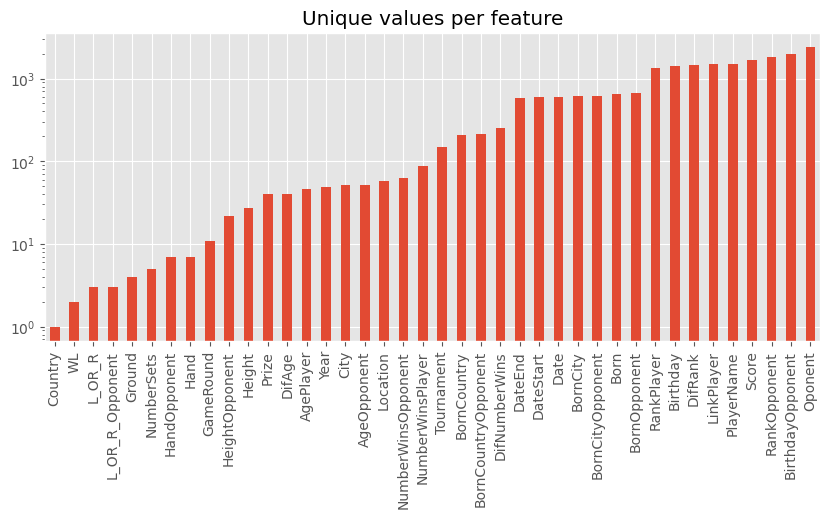

In [199]:
### determine which variables are categorigal and which are numerical
# For each numerical feature compute number of unique entries

df_unique = df_brasil.nunique().sort_values()
print(df_unique)

# Plot information with y-axis in log-scale
df_unique.plot.bar(logy=True, figsize=(10, 4), title="Unique values per feature");

Através destes valores e do gráfico correspondente vemos o número de valores únicos para cada variável:

-**Country**: 1 valor único

-**WL**: 2 valores únicos

-**L_OR_R**: 3 valores únicos

-**L_OR_R_Opponent**: 3 valores únicos

-**Ground**: 4 valores únicos


-**NumberSets**: 5 valores únicos

-**HandOpponent**: 7 valores únicos

-**Hand**: 7 valores únicos

-**GameRound**: 11 valores únicos

-**HeightOpponent**: 22 valores únicos

-**Height**: 27 valores únicos

-**Prize**: 40 valores únicos

-**DifAge**: 40 valores únicos

-**AgePlayer**: 46 valores únicos

-**Year**: 49 valores únicos

-**City**: 51 valores únicos

-**AgeOpponent**: 52 valores únicos

-**Location**: 57 valores únicos

-**NumberWinsOpponent**: 63 valores únicos

-**NumberWinsPlayer**: 87 valores únicos

-**Tournament**: 148 valores únicos

-**BornCountry**: 210 valores únicos

-**BornCountryOpponent**: 212 valores únicos

-**DifNumberWins**: 252 valores únicos

-**DateEnd**: 577 valores únicos

-**DateStart**: 595 valores únicos

-**Date**: 599 valores únicos

-**BornCity**: 610 valores únicos

-**BornCityOpponent**: 615 valores únicos

-**Born**: 652 valores únicos

-**BornOpponent**: 666 valores únicos

-**RankPlayer**: 1360 valores únicos

-**Birthday**: 1412 valores únicos

-**DifRank**: 1461 valores únicos

-**LinkPlayer**: 1512 valores únicos

-**PlayerName**: 1512 valores únicos

-**Score**: 1671 valores únicos

-**RankOpponent**: 1831 valores únicos

-**BirthdayOpponent**: 1961 valores únicos

-**Oponent**: 2431 valores únicos

### Investigação da qualidade dos dados

#### Duplicados

Não procedemos à verificação de duplicados especificamente para dataset filtrado, porque já o fizemos inicialmente com a variável `_id`.

#### Valores omissos

In [200]:
def utils_recognize_type(dfn, col, max_cat=20):
    if (dfn[col].dtype == "O") | (dfn[col].nunique() < max_cat):
        return "cat"
    else:
        return "num"

In [201]:
col = ["Country", "WL", "L_OR_R", "L_OR_R_Opponent", "Ground", "NumberSets", "HandOpponent", "Hand",
       "GameRound", "HeightOpponent", "Height", "Prize", "DifAge", "AgePlayer", "Year", "City",
       "AgeOpponent", "Location", "NumberWinsOpponent", "NumberWinsPlayer", "Tournament", "BornCountry", 
       "BornCountryOpponent", "DifNumberWins", "DateEnd", "DateStart", "Date", "BornCity", "BornCityOpponent",
       "Born", "BornOpponent", "RankPlayer", "Birthday", "DifRank", "LinkPlayer", "PlayerName", "Score",
      "RankOpponent", "BirthdayOpponent", "Oponent"]

for c in col:
    cc= utils_recognize_type(df_brasil, c, max_cat=20)
    print(cc)

cat
cat
cat
cat
cat
cat
cat
cat
cat
num
num
num
num
num
num
cat
num
cat
num
num
cat
cat
cat
num
num
num
cat
cat
cat
cat
cat
num
num
num
cat
cat
cat
num
num
cat


In [202]:
col_n = ["HeightOpponent", "Height", "Prize", "DifAge", "AgePlayer", "Year", "AgeOpponent", "NumberWinsOpponent",
         "NumberWinsPlayer", "DifNumberWins", "DateEnd", "DateStart","RankPlayer", "Birthday", "DifRank", "RankOpponent", 
         "BirthdayOpponent" ]
col_c = ["Country", "WL", "L_OR_R", "L_OR_R_Opponent", "Ground", "NumberSets", "HandOpponent", "Hand","GameRound", "City", 
         "Location", "Tournament", "BornCountry", "BornCountryOpponent", "Date", "BornCity", "BornCityOpponent", "Born",
        "BornOpponent", "LinkPlayer", "PlayerName", "Score", "Oponent"]

In [203]:
## proportion of missing data

dic_cols = {col:utils_recognize_type(df_brasil, col, max_cat=20) for col in df_brasil.columns}

heatmap = df_brasil.isnull()

for k,v in dic_cols.items():
    if v == "num": heatmap[k] = heatmap[k].apply(lambda x: 0.5 if x is False else 1)
    else: heatmap[k] = heatmap[k].apply(lambda x: 0 if x is False else 1)
          

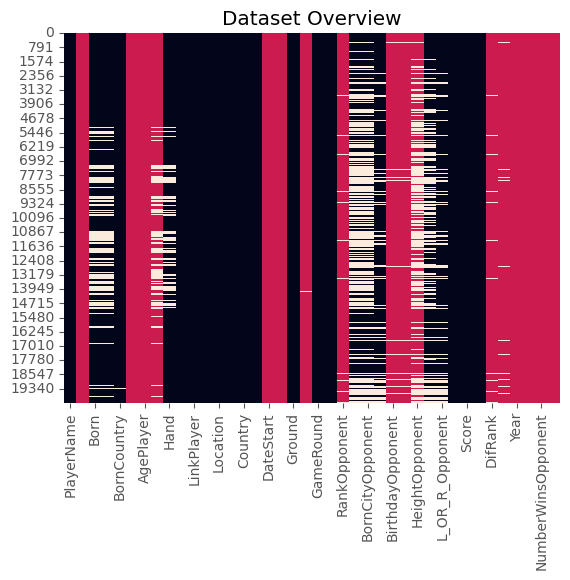

 Categorical   Numeric   NaN 


In [204]:
## visualize data type and missing values
sns.heatmap(heatmap, cbar=False).set_title('Dataset Overview')
plt.show()
print("\033[1;37;40m Categorical ", "\033[1;30;41m Numeric ", "\033[1;30;47m NaN ")


Temos várias colunas com valores omissos.

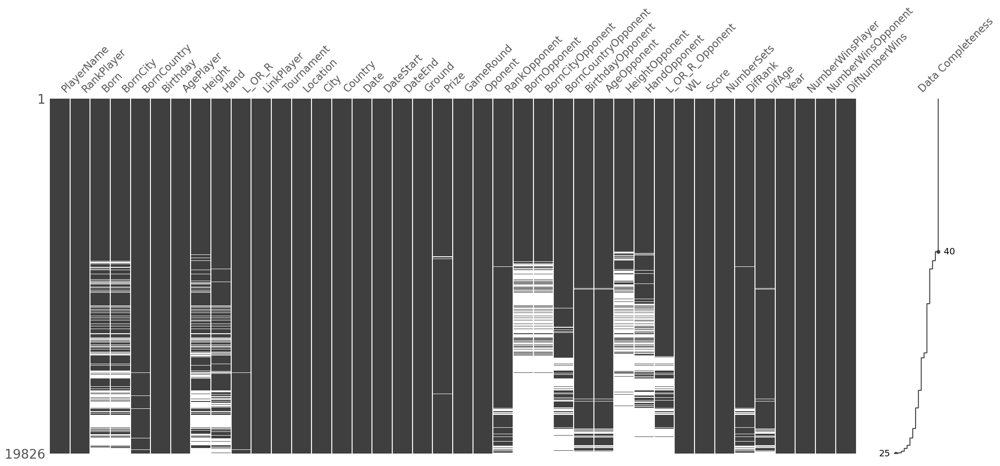

In [205]:
import missingno as msno
msno.matrix(df_brasil, labels=True, sort="descending");

Através do gráfico, que representa os valores omissos no dataframe vemos que 17 variáveis tem alguns valores omissos e que as restantes variáveis aparentam estar completamente preenchida.

In [206]:
na_counts = df_brasil.isna().sum()

# Print the number of missing values per column
print(na_counts)

PlayerName                0
RankPlayer                0
Born                   4666
BornCity               4647
BornCountry              40
Birthday                  0
AgePlayer                 0
Height                 4358
Hand                   2975
L_OR_R                    9
LinkPlayer                0
Tournament                0
Location                  0
City                      0
Country                   0
Date                      0
DateStart                 0
DateEnd                   0
Ground                    0
Prize                   190
GameRound                 0
Oponent                   0
RankOpponent            622
BornOpponent           9357
BornCityOpponent       9344
BornCountryOpponent    3208
BirthdayOpponent        723
AgeOpponent             723
HeightOpponent         8984
HandOpponent           6788
L_OR_R_Opponent        3026
WL                        0
Score                     3
NumberSets                0
DifRank                 622
DifAge              

Temos 19 variáveis com valores omissos.

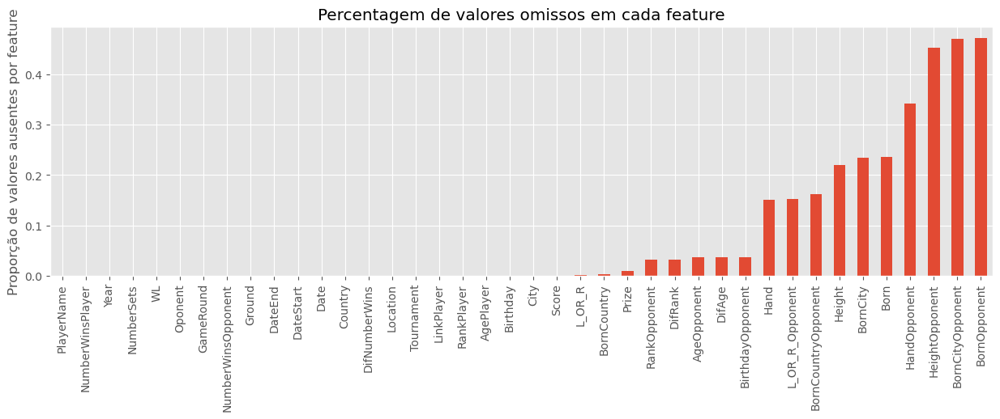

In [207]:
# gráfico com a percentagem de valores omissos em cada variável
df_brasil.isna().mean().sort_values().plot(kind="bar", figsize=(15, 4),
title="Percentagem de valores omissos em cada feature",ylabel="Proporção de valores ausentes por feature");

Vemos que a maior proporção de valores omissos são nas variáveis `HeightOpponent`, `BornCityOpponent` e `BornOpponent` com cerca de 45%.

### Tratamento dos valores omissos e outliers

Começamos por ver o número de linhas em que não existe prémio associado ao torneio.

In [208]:
df_brasil[df_brasil['Prize'].isna()]['Tournament'].nunique()

37

In [209]:
# quais os torneios em que a situação acima se verifica
df_brasil[df_brasil['Prize'].isna()]['Tournament'].unique()

array(['Rio Olympics', 'BRA vs. ESP WG Play-Off',
       'AG1 BRA vs BAR Round 1', 'BRA vs. BEL DC Qualifier 1st Round',
       'BRA vs. ECU AGI 2nd RD', 'BRA vs. CRO WG Play-Off',
       'BRA v. CAN AGI 2nd Rd', 'BRA vs. RUS WG Play-Off',
       'URU vs. BRA AG I 2nd RD', 'BRA v. COL AG 1 2nd. round',
       'BRA vs. ECU WG Play-off', 'BRA v. PER AG1 3rd. Rd. PO',
       'BRA v. CAN WG Q', 'BRA v. SWE WG PO', 'BRA V FRA 1RD',
       'BRA V SVK QF', 'ESP V BRA 1RD', 'AUT V BRA WGPO',
       'BRA v MOR WG Rd 1', 'BRA V ROM WGPO', 'NZL V BRA WGPO',
       'USA V BRA 1RD', 'VEN V BRA AZ1', 'ITA V BRA QF', 'IND V BRA WGPO',
       'BAH V BRA AZ1', 'URU V BRA AGQF', 'GER V BRA 1RD',
       'PUR V BRA AZ1', 'PER V BRA AZSF', 'CHI V BRA AZSF',
       'CHI V BRA AZPO', 'ECU V BRA AZF',
       'BRA vs. ECU - SOUTH AMERICA SF', 'BRA vs. ARG - AMERICAS QF',
       'BRA vs. ARG - SOUTH AMERICA SF', 'BRA vs. TCH - INTER-ZONAL SF'],
      dtype=object)

Para mais informação:
* <a href="https://www.al.com/news/2016/08/olympic_games_rio_2016_did_you.html" target="_blank">Rio Olimpics</a>

* <a href=" https://www.perfect-tennis.com/prize-money/davis-cup/" target="_blank">WG: World Group - Davis Cup</a>


Fomos ver se no dataset filtrado, para as linhas em que não existia prémio se existia já um valor associado ao torneio noutra linha do mesmo.

In [210]:
def preencher_missings_por_torneio():
    # Agrupa os dados por torneio
    grupos_torneio = df_brasil.groupby('Tournament')
    
    # Preenche os valores faltantes dentro de cada grupo com o valor correspondente
    df_brasil['Prize'] = grupos_torneio['Prize'].fillna(method='ffill')

In [211]:
preencher_missings_por_torneio()

In [212]:
df_brasil['Prize'].isna().sum()

190

Verifica-se que o número de missings não se alterou. Imputamos o valor 0, nestass entradas - a razão encontra-se no relatório.

In [213]:
# imputação  para o Prize
df_brasil['Prize'] = df_brasil['Prize'].fillna(0)

In [214]:
df_brasil['Prize'].isna().sum()

0

In [215]:
df_brasil[df_brasil['Prize']==0].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2


In [216]:
(df_brasil['Prize'] == 0).sum()

190

In [217]:
# número distinto de torneios
df_brasil['Tournament'].nunique()

148

In [218]:
# top 5 de torneios
df_brasil['Tournament'].value_counts().head(5)

Sao Paulo         1264
Belo Horizonte     698
Rio de Janeiro     659
Campinas           654
Sao Paulo-1        572
Name: Tournament, dtype: int64

In [219]:
df_brasil[df_brasil['Height'].isnull()].head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
4674,Matheus Amorim De Lima,1882.0,NaN,NaN,Brazil,1980-05-26,41.0,NaN,NaN,Right-Handed,https://www.atptour.com/en/players/matheus-amo...,M25 Campos do Jordao,"Campos do Jordao, Brazil",Campos do Jordao,Brazil,2022.01.31 - 2022.02.06,2022-01-31,2022-02-06,Hard,25000.0,Round of 32,Joao Eduardo Schiessl,1670.0,"S�o Paulo, Brazil",S�o Paulo,S�o Paulo,1983-10-29,38.0,180.0,"Left-Handed, Two-Handed Backhand",Left-Handed,L,46 16,2,212.0,3.0,2022,1,2,1
4675,Matheus Amorim De Lima,1882.0,NaN,NaN,Brazil,1980-05-26,41.0,NaN,NaN,Right-Handed,https://www.atptour.com/en/players/matheus-amo...,Blumenau,"Blumenau, Brazil",Blumenau,Brazil,2022.01.10 - 2022.01.16,2022-01-10,2022-01-16,Clay,37520.0,Round of 16,Igor Marcondes,326.0,"Caraguatatuba, Brazil",Caraguatatuba,Brazil,1997-06-16,24.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,L,06 16,2,1556.0,17.0,2022,1,39,38
4676,Matheus Amorim De Lima,1757.0,NaN,NaN,Brazil,1980-05-26,41.0,NaN,NaN,Right-Handed,https://www.atptour.com/en/players/matheus-amo...,M25 Rio do Sul,"Rio do Sul, Brazil",Rio do Sul,Brazil,2021.10.18 - 2021.10.24,2021-10-18,2021-10-24,Clay,25000.0,Round of 32,Pedro Cressoni,1476.0,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,W,62 60,2,281.0,NaN,2021,1,0,1


Pelo que se pode ver em cima, há jogadores que não têm nenhum valor na sua altura e portanto vamos verificar esta variável e traá-la em seguida.

In [220]:
# verificar se a altura já estava presente noutra linha
def fill_missing_height(df):
    # Selecionar as linhas com NaN em Height
    missing_height = df_brasil[df_brasil['Height'].isnull()]

    # Selecionar a lista de jogadores únicos com NaN em Height
    players_with_missing_height = missing_height['PlayerName'].unique()

    # Inicializar o contador
    count = 0

    # Para cada jogador único com NaN em Height
    for player in players_with_missing_height:
        # Selecionar as linhas para o jogador
        player_rows = df_brasil[df_brasil['PlayerName'] == player]

        # Selecionar a altura de uma linha com Height preenchida
        height = player_rows[player_rows['Height'].notnull()]['Height'].values

        # Se uma altura for encontrada, atribuir o valor à linha atual
        if len(height) > 0:
            df_brasil.loc[(df_brasil['PlayerName'] == player) & (df_brasil['Height'].isnull()), 'Height'] = height[0]
            count += 1

    print(count)

In [221]:
fill_missing_height(df_brasil)

0


Verificámos que não existe nenhum caso em que uma altura em falta de um jogador já exista no dataset.

In [222]:
df_brasil['Height'].isnull().sum()

4358

In [223]:
df_brasil[df_brasil['Height'].isnull()].groupby('PlayerName')['Height'].nunique().count()

448

Temos 448 valores omissos de jogadores distintos

#### Boxplot para Height

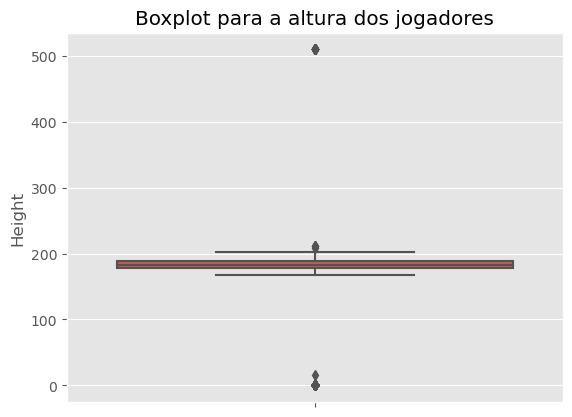

In [224]:
sns.boxplot(y=df_brasil['Height'])
plt.title('Boxplot para a altura dos jogadores');

No segemento seguinte, vamos tratar dos valores impossíveis para `Height` que foram encontrados e mostrados nas medidas descritivas anteriormente, nomeadamente o 0.0 e o 510.0.

In [225]:
# jogador com 510 cm
df_510_height = df_brasil[df_brasil['Height'] == 510.0]

#Count the number of distinct PlayerName values in the filtered DataFrame
distinct_player_count = df_510_height['PlayerName'].nunique()


distinct_player_count

1

In [226]:
df_510_height.PlayerName.unique()

array(['Carlos Di Laura'], dtype=object)

In [227]:
df_brasil.loc[(df_brasil['PlayerName'] == 'Carlos Di Laura') & (df_brasil['Height'] == 510.0), 'Height'] = 175.0

In [228]:
# jogador com 0 cm
df_0_height = df_brasil[df_brasil['Height'] == 0.0]

#Count the number of distinct PlayerName values in the filtered DataFrame
distinct_player_count = df_0_height['PlayerName'].nunique()


distinct_player_count

30

In [229]:
df_0_height.PlayerName.unique()

array(['Manuel Sanchez', 'Theodoros Angelinos', 'Simone Vagnozzi',
       'Haythem Abid', 'Juan-Pablo Amado', 'Juan-Martin Aranguren',
       'Maximilian Abel', 'Nicholas John Andrews', 'Fernando Albuquerque',
       'Diego Alvarez', 'Juan-Manuel Agasarkissian', 'Diego Acosta',
       'Marc Auradou', 'Clayton Almeida', 'Carlos Avellan',
       'Leonel Alberti', 'Dario Acosta', 'James Auckland',
       'Mariano Albert-Ferrando', 'Marcos Felipe Arend', 'Dejan Petrovic',
       'Patricio Arquez', 'Cristobal Aguirre', 'Fernando Araujo',
       'Federico Abadie', 'Pietro Angelini', 'Ruben Alvarenga',
       'Cristian Araya', 'Alex Blumenberg', 'Marcelo Zormann'],
      dtype=object)

In [230]:
# substição
df_brasil.loc[(df_brasil['PlayerName'] == 'Manuel Sanchez') & (df_brasil['Height'] == 0.0), 'Height'] = 185.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Theodoros Angelinos') & (df_brasil['Height'] == 0.0), 'Height'] = 192.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Simone Vagnozzi') & (df_brasil['Height'] == 0.0), 'Height'] = 173.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Haythem Abid') & (df_brasil['Height'] == 0.0), 'Height'] = 188.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Juan-Pablo Amado') & (df_brasil['Height'] == 0.0), 'Height'] = 191.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Juan-Martin Aranguren') & (df_brasil['Height'] == 0.0), 'Height'] = 182.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Maximilian Abel') & (df_brasil['Height'] == 0.0), 'Height'] = 184.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Nicholas John Andrews') & (df_brasil['Height'] == 0.0), 'Height'] = 170.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Fernando Albuquerque') & (df_brasil['Height'] == 0.0), 'Height'] = 183.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Diego Alvarez') & (df_brasil['Height'] == 0.0), 'Height'] = 173.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Juan-Manuel Agasarkissian') & (df_brasil['Height'] == 0.0), 'Height'] = 183.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Diego Acosta') & (df_brasil['Height'] == 0.0), 'Height'] = 175.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Marc Auradou') & (df_brasil['Height'] == 0.0), 'Height'] = 181.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Clayton Almeida') & (df_brasil['Height'] == 0.0), 'Height'] = 176.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Carlos Avellan') & (df_brasil['Height'] == 0.0), 'Height'] = 175.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Leonel Alberti') & (df_brasil['Height'] == 0.0), 'Height'] = 186.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Ytai Abougzir') & (df_brasil['Height'] == 0.0), 'Height'] = 173.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Dario Acosta') & (df_brasil['Height'] == 0.0), 'Height'] = 189.0
df_brasil.loc[(df_brasil['PlayerName'] == 'James Auckland') & (df_brasil['Height'] == 0.0), 'Height'] = 181.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Henry Adjei-Darko') & (df_brasil['Height'] == 0.0), 'Height'] = 179.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Mariano Albert-Ferrando') & (df_brasil['Height'] == 0.0), 'Height'] = 178.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Marcos Felipe Arend') & (df_brasil['Height'] == 0.0), 'Height'] = 175.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Dejan Petrovic') & (df_brasil['Height'] == 0.0), 'Height'] = 179.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Patricio Arquez') & (df_brasil['Height'] == 0.0), 'Height'] = 185.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Cristobal Aguirre') & (df_brasil['Height'] == 0.0), 'Height'] = 187.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Fernando Araujo') & (df_brasil['Height'] == 0.0), 'Height'] = 173.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Federico Abadie') & (df_brasil['Height'] == 0.0), 'Height'] = 188.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Enzo Artoni') & (df_brasil['Height'] == 0.0), 'Height'] = 178.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Pedro Alves') & (df_brasil['Height'] == 0.0), 'Height'] = 183.0 
df_brasil.loc[(df_brasil['PlayerName'] == 'Pietro Angelini') & (df_brasil['Height'] == 0.0), 'Height'] = 179.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Ruben Alvarenga') & (df_brasil['Height'] == 0.0), 'Height'] = 185.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Cristian Araya') & (df_brasil['Height'] == 0.0), 'Height'] = 183.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Maurice Arraes') & (df_brasil['Height'] == 0.0), 'Height'] = 179.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Mauricio Aquino') & (df_brasil['Height'] == 0.0), 'Height'] = 184.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Alex Blumenberg') & (df_brasil['Height'] == 0.0), 'Height'] = 190.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Marcelo Zormann') & (df_brasil['Height'] == 0.0), 'Height'] = 177.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Rodrigo Abucham') & (df_brasil['Height'] == 0.0), 'Height'] = 183.0
df_brasil.loc[(df_brasil['PlayerName'] == 'Alexandre Almeida') & (df_brasil['Height'] == 0.0), 'Height'] = 186.0

In [231]:
df_brasil[df_brasil['Height']<25.0]

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
16356,Grant Stafford,220.0,"Johannesburg, South Africa",Johannesburg,South Africa,1971-05-27,20.0,15.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/grant-staff...,Sao Paulo-1,"Sao Paulo, Brazil",Sao Paulo,Brazil,1992.05.04 - 1992.05.10,1992-05-04,1992-05-10,Hard,50000.0,Round of 32,Roberto Jabali,219.0,"Ribeirao Preto, Brazil",Ribeirao Preto,Brazil,1970-05-16,21.0,191.0,"Right-Handed, Unknown Backhand",Right-Handed,L,36 36,2,1.0,1.0,1992,0,32,32


In [232]:
df_brasil.loc[(df_brasil['PlayerName'] == 'Grant Stafford') & (df_brasil['Height'] == 15.0), 'Height'] = 188.0

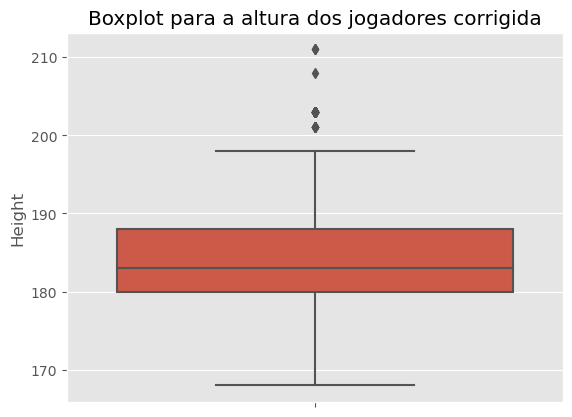

In [233]:
sns.boxplot(y=df_brasil['Height'])
plt.title('Boxplot para a altura dos jogadores corrigida');

In [234]:
df_brasil['Height'].isnull().sum()

4358

In [235]:
df_brasil[df_brasil['Height'].isnull()].groupby('PlayerName')['Height'].nunique().count()

448

In [236]:
def preencher_alturas_faltantes(df_brasil, df_players_overviews):
    # Filtrar as linhas em que o campo Height é NaN
    df_alturas_faltantes = df_brasil[df_brasil['Height'].isnull()]
    
    # Criar um dicionário com os valores de height_cm para cada jogador
    jogadores_altura = dict(zip(df_players_overviews['name'], df_players_overviews['height_cm']))
    
    # Preencher as alturas em falta com os valores de height_cm
    for index, row in df_alturas_faltantes.iterrows():
        jogador = row['PlayerName']
        if jogador in jogadores_altura:
            df_brasil.at[index, 'Height'] = jogadores_altura[jogador]

In [237]:
preencher_alturas_faltantes(df_brasil, df_players_overviews)

In [238]:
df_brasil[df_brasil['Height'].isnull()].groupby('PlayerName')['Height'].nunique().count()

448

In [239]:
df_players_overviews[df_players_overviews['name']=='Kaichi Uchida']

,player_id,player_slug,first_name,last_name,name,player_url,flag_code,country,residence,birthplace,birthdate,birth_year,birth_month,birth_day,turned_pro,weight_lbs,weight_kg,height_ft,height_inches,height_cm,handedness,backhand
9975,u120,kaichi-uchida,Kaichi,Uchida,Kaichi Uchida,http://www.atpworldtour.com/en/players/kaichi-...,JPN,Japan,NaN,NaN,1994.08.23,1994.0,8.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [240]:
df_brasil.loc[(df_brasil['Oponent'] == 'Manuel Sanchez') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 185.0
df_brasil.loc[(df_brasil['Oponent'] == 'Theodoros Angelinos') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 192.0
df_brasil.loc[(df_brasil['Oponent'] == 'Simone Vagnozzi') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 173.0
df_brasil.loc[(df_brasil['Oponent'] == 'Haythem Abid') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 188.0
df_brasil.loc[(df_brasil['Oponent'] == 'Juan-Pablo Amado') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 191.0
df_brasil.loc[(df_brasil['Oponent'] == 'Juan-Martin Aranguren') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 182.0
df_brasil.loc[(df_brasil['Oponent'] == 'Maximilian Abel') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 184.0
df_brasil.loc[(df_brasil['Oponent'] == 'Nicholas John Andrews') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 170.0
df_brasil.loc[(df_brasil['Oponent'] == 'Fernando Albuquerque') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 183.0
df_brasil.loc[(df_brasil['Oponent'] == 'Diego Alvarez') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 173.0
df_brasil.loc[(df_brasil['Oponent'] == 'Juan-Manuel Agasarkissian') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 183.0
df_brasil.loc[(df_brasil['Oponent'] == 'Diego Acosta') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 175.0
df_brasil.loc[(df_brasil['Oponent'] == 'Marc Auradou') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 181.0
df_brasil.loc[(df_brasil['Oponent'] == 'Clayton Almeida') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 176.0
df_brasil.loc[(df_brasil['Oponent'] == 'Carlos Avellan') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 175.0
df_brasil.loc[(df_brasil['Oponent'] == 'Leonel Alberti') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 186.0
df_brasil.loc[(df_brasil['Oponent'] == 'Ytai Abougzir') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 173.0
df_brasil.loc[(df_brasil['Oponent'] == 'Dario Acosta') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 189.0
df_brasil.loc[(df_brasil['Oponent'] == 'James Auckland') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 181.0
df_brasil.loc[(df_brasil['Oponent'] == 'Henry Adjei-Darko') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 179.0
df_brasil.loc[(df_brasil['Oponent'] == 'Mariano Albert-Ferrando') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 178.0
df_brasil.loc[(df_brasil['Oponent'] == 'Marcos Felipe Arend') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 175.0
df_brasil.loc[(df_brasil['Oponent'] == 'Dejan Petrovic') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 179.0
df_brasil.loc[(df_brasil['Oponent'] == 'Patricio Arquez') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 185.0
df_brasil.loc[(df_brasil['Oponent'] == 'Cristobal Aguirre') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 187.0
df_brasil.loc[(df_brasil['Oponent'] == 'Fernando Araujo') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 173.0
df_brasil.loc[(df_brasil['Oponent'] == 'Federico Abadie') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 188.0
df_brasil.loc[(df_brasil['Oponent'] == 'Enzo Artoni') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 178.0
df_brasil.loc[(df_brasil['Oponent'] == 'Pedro Alves') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 183.0 
df_brasil.loc[(df_brasil['Oponent'] == 'Pietro Angelini') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 179.0
df_brasil.loc[(df_brasil['Oponent'] == 'Ruben Alvarenga') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 185.0
df_brasil.loc[(df_brasil['Oponent'] == 'Cristian Araya') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 183.0
df_brasil.loc[(df_brasil['Oponent'] == 'Maurice Arraes') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 179.0
df_brasil.loc[(df_brasil['Oponent'] == 'Mauricio Aquino') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 184.0
df_brasil.loc[(df_brasil['Oponent'] == 'Alex Blumenberg') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 190.0
df_brasil.loc[(df_brasil['Oponent'] == 'Marcelo Zormann') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 177.0
df_brasil.loc[(df_brasil['Oponent'] == 'Rodrigo Abucham') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 183.0
df_brasil.loc[(df_brasil['Oponent'] == 'Alexandre Almeida') & (df_brasil['HeightOpponent'] == 0.0), 'HeightOpponent'] = 186.0

In [241]:
df_brasil.loc[(df_brasil['Oponent'] == 'Grant Stafford') & (df_brasil['HeightOpponent'] == 15.0), 'Height'] = 188.0

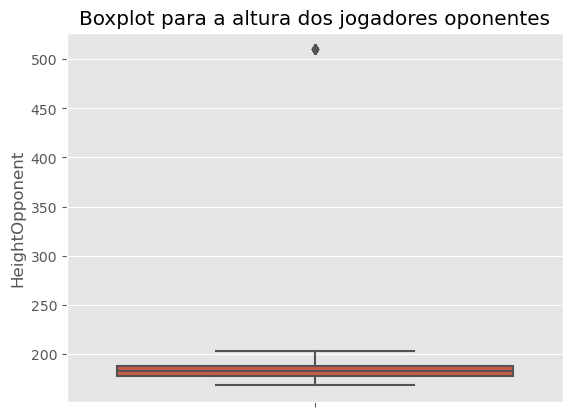

In [242]:
sns.boxplot(y=df_brasil['HeightOpponent'])
plt.title('Boxplot para a altura dos jogadores oponentes');

In [243]:
df_filtered = df_brasil[df_brasil['HeightOpponent'] > 500]

In [244]:
list(set(df_filtered['Oponent']))

['Carlos Di Laura']

In [245]:
df_brasil[df_brasil['HeightOpponent'] > 500]

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins
13059,Thomas Muster,181.0,"Leibnitz, Austria",Leibnitz,Austria,1967-10-02,18.0,180.0,"Left-Handed, One-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/thomas-must...,Porto Alegre,"Porto Alegre, Brazil",Porto Alegre,Brazil,1985.10.28 - 1985.11.10,1985-10-28,1985-11-10,Clay,25000.0,Round of 16,Carlos Di Laura,195.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,L,67 16,2,14.0,3.0,1985,7,4,3
13061,Thomas Muster,181.0,"Leibnitz, Austria",Leibnitz,Austria,1967-10-02,18.0,180.0,"Left-Handed, One-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/thomas-must...,Belo Horizonte,"Belo Horizonte, Brazil",Belo Horizonte,Brazil,1985.10.21 - 1985.10.27,1985-10-21,1985-10-27,Clay,25000.0,Finals,Carlos Di Laura,257.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,W,61 64,2,76.0,3.0,1985,7,4,3
17229,Jean-Philippe Fleurian,200.0,"Paris, France",Paris,France,1965-09-11,20.0,185.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/jean-philip...,Belo Horizonte,"Belo Horizonte, Brazil",Belo Horizonte,Brazil,1985.10.21 - 1985.10.27,1985-10-21,1985-10-27,Clay,25000.0,Semi-Finals,Carlos Di Laura,257.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,L,67 36,2,57.0,1.0,1985,26,4,22
17722,Ricardo Camargo,517.0,"Sao Paulo, Brazil",Sao Paulo,Brazil,1968-05-14,17.0,180.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/ricardo-cam...,Sao Paulo-1,"Sao Paulo, Brazil",Sao Paulo,Brazil,1986.03.31 - 1986.04.06,1986-03-31,1986-04-06,Clay,25000.0,Round of 32,Carlos Di Laura,93.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,L,26 06,2,424.0,4.0,1986,7,4,3
17780,Karel Novacek,233.0,"Prostejov, Czech Republic",Prostejov,Czechia,1965-03-30,20.0,191.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/karel-novac...,Porto Alegre,"Porto Alegre, Brazil",Porto Alegre,Brazil,1985.10.28 - 1985.11.10,1985-10-28,1985-11-10,Clay,25000.0,Semi-Finals,Carlos Di Laura,195.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,W,64 26 63,3,38.0,1.0,1985,8,4,4
17789,Jordi Arrese,151.0,"Barcelona, Spain",Barcelona,Spain,1964-08-29,21.0,175.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/jordi-arres...,Curitiba,"Curitiba, Brazil",Curitiba,Brazil,1985.11.04 - 1985.11.10,1985-11-04,1985-11-10,Clay,25000.0,Round of 32,Carlos Di Laura,195.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,L,16 61 36,3,44.0,0.0,1985,3,4,1
17864,Luiz Mattar,74.0,"Sao Paulo, Brazil",Sao Paulo,Brazil,1963-08-18,27.0,183.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/luiz-mattar...,PUR V BRA AZ1,Brazil,Brazil,Brazil,1991.01.28 - 1991.02.10,1991-01-28,1991-02-10,Hard,0.0,Round Robin,Carlos Di Laura,NaN,"Lima, Peru",Lima,Peru,1964-10-19,26.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,W,67 63 62 61,4,NaN,1.0,1991,99,4,95
17961,Luiz Mattar,139.0,"Sao Paulo, Brazil",Sao Paulo,Brazil,1963-08-18,22.0,183.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/luiz-mattar...,Guaruja,"Guaruja, Brazil",Guaruja,Brazil,1986.01.20 - 1986.02.02,1986-01-20,1986-02-02,Clay,75000.0,Round of 32,Carlos Di Laura,148.0,"Lima, Peru",Lima,Peru,1964-10-19,21.0,510.0,"Left-Handed, One-Handed Backhand",Left-Handed,W,61 76,2,9.0,1.0,1986,99,4,95


In [246]:
df_brasil.loc[(df_brasil['Oponent'] == 'Carlos Di Laura') & (df_brasil['HeightOpponent'] == 510.0), 'HeightOpponent'] = 175.0

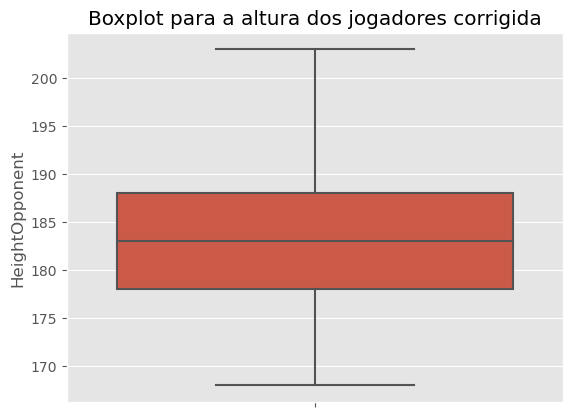

In [247]:
sns.boxplot(y=df_brasil['HeightOpponent'])
plt.title('Boxplot para a altura dos jogadores corrigida');

In [248]:
df_brasil['DifHeight'] = abs(df_brasil['Height'] - df_brasil['HeightOpponent'])

In [249]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,DifHeight
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5,10.0
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16,7.0
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2,3.0
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,136.0,3.0,2016,19,5,14,13.0
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2016-08-08,2016-08-14,Hard,0.0,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,25.0,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,39.0,5.0,2016,19,3,16,8.0


### Imputação valor omisso Score 

In [250]:
df_brasil[df_brasil['Score'].isnull()]

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,DifHeight
11268,Vahid Mirzadeh,680.0,"Lake Worth, Florida, USA",Lake Worth,Lake Worth,1986-12-28,25.0,178.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/vahid-mirza...,Campinas,"Campinas, Brazil",Campinas,Brazil,2012.09.17 - 2012.09.23,2012-09-17,2012-09-23,Clay,50000.0,1st Round Qualifying,Felipe Frias,1890.0,NaN,NaN,Spain,1994-02-28,18.0,NaN,NaN,Right-Handed,L,NaN,1,1210.0,7.0,2012,1,2,1,NaN
17044,Roberto Jabali,215.0,"Ribeirao Preto, Brazil",Ribeirao Preto,Brazil,1970-05-16,23.0,191.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/roberto-jab...,Curitiba,"Curitiba, Brazil",Curitiba,Brazil,1993.10.18 - 1993.10.24,1993-10-18,1993-10-24,Clay,25000.0,Semi-Finals,Christian Miniussi,194.0,"Buenos Aires, Argentina",Buenos Aires,Argentina,1967-07-05,26.0,185.0,"Right-Handed, Unknown Backhand",Right-Handed,L,NaN,1,21.0,3.0,1993,39,20,19,6.0
17648,Claudio Pistolesi,228.0,"Rome, Italy",Rome,Italy,1967-08-25,18.0,180.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/claudio-pis...,Belo Horizonte,"Belo Horizonte, Brazil",Belo Horizonte,Brazil,1985.10.21 - 1985.10.27,1985-10-21,1985-10-27,Clay,25000.0,Quarter-Finals,Jaime Yzaga,103.0,"Lima, Peru",Lima,Peru,1967-10-23,17.0,170.0,"Right-Handed, Unknown Backhand",Right-Handed,W,NaN,1,125.0,1.0,1985,7,14,7,10.0


In [251]:
df_brasil.loc[11268, 'Score'] = '26 00 RET'


In [252]:
df_brasil[df_brasil['Score'].isnull()]

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,DifHeight
17044,Roberto Jabali,215.0,"Ribeirao Preto, Brazil",Ribeirao Preto,Brazil,1970-05-16,23.0,191.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/roberto-jab...,Curitiba,"Curitiba, Brazil",Curitiba,Brazil,1993.10.18 - 1993.10.24,1993-10-18,1993-10-24,Clay,25000.0,Semi-Finals,Christian Miniussi,194.0,"Buenos Aires, Argentina",Buenos Aires,Argentina,1967-07-05,26.0,185.0,"Right-Handed, Unknown Backhand",Right-Handed,L,NaN,1,21.0,3.0,1993,39,20,19,6.0
17648,Claudio Pistolesi,228.0,"Rome, Italy",Rome,Italy,1967-08-25,18.0,180.0,"Right-Handed, Unknown Backhand",Right-Handed,https://www.atptour.com/en/players/claudio-pis...,Belo Horizonte,"Belo Horizonte, Brazil",Belo Horizonte,Brazil,1985.10.21 - 1985.10.27,1985-10-21,1985-10-27,Clay,25000.0,Quarter-Finals,Jaime Yzaga,103.0,"Lima, Peru",Lima,Peru,1967-10-23,17.0,170.0,"Right-Handed, Unknown Backhand",Right-Handed,W,NaN,1,125.0,1.0,1985,7,14,7,10.0


In [253]:
df_brasil['DateStart'] = df_brasil['DateStart'].astype('object')
df_brasil['DateEnd'] = df_brasil['DateEnd'].astype('object')

In [254]:
df_brasil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19826 entries, 0 to 20137
Data columns (total 41 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   PlayerName           19826 non-null  object        
 1   RankPlayer           19826 non-null  float64       
 2   Born                 15160 non-null  object        
 3   BornCity             15179 non-null  object        
 4   BornCountry          19786 non-null  object        
 5   Birthday             19826 non-null  datetime64[ns]
 6   AgePlayer            19826 non-null  float64       
 7   Height               15468 non-null  float64       
 8   Hand                 16851 non-null  object        
 9   L_OR_R               19817 non-null  object        
 10  LinkPlayer           19826 non-null  object        
 11  Tournament           19826 non-null  object        
 12  Location             19826 non-null  object        
 13  City                 19826 non-

### Visualização

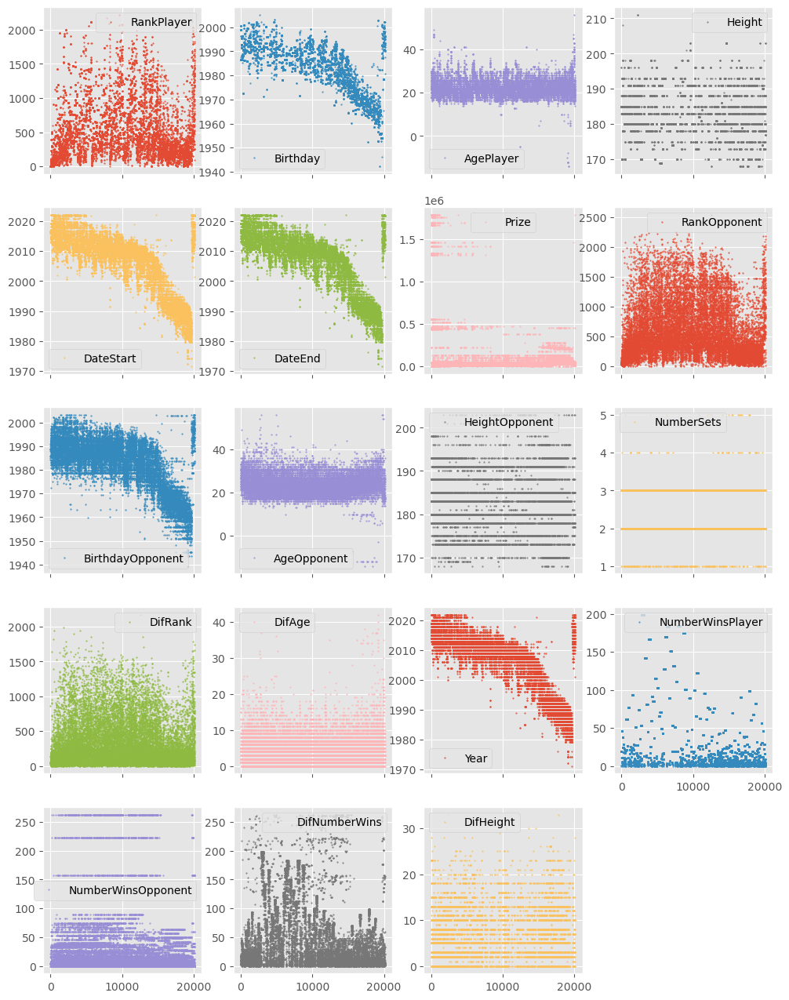

In [255]:
## visualizar as variáveis numéricas após imputação e tratamento
df_brasil.plot(lw=0, marker=".", subplots=True, layout=(-1, 4), figsize=(12, 16), markersize=1);

Relativamente à variável `RankPlayer` podemos ver que existe uma grande dispersão de pontos, o que indica uma variância elevada na distribuição destes valores, a variável `Height` está bastante concentrada, mas é possível verificar que já não temos a  existência de outliers em 0 cm e 510 cm, tendo assim esta variável tratada. 

Os gráficos referentes à `DateStart` e `DateEnd` são muito parecidos e dá a entender que o número de jogos de ténis no Brasil tem vindo a aumentar ao longo do tempo. 

Relativamente à variável `Prize` existe alguma dispersão de pontos. O `RankOpponent` está bastante concentrado na base do gráfico. O número de sets concentra-se principalmente em 2 e 3 e muito raramente existem jogos com 5 sets.
Nas restantes variáveis, podemos ver que existe dispersão dos pontos.

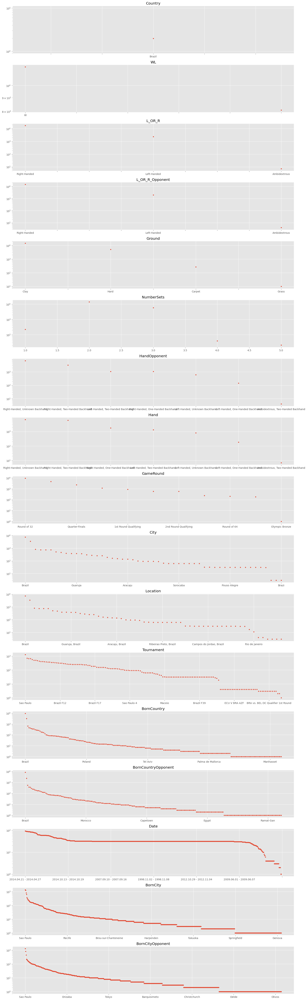

In [256]:
# Create figure object with 2 subplots
fig, axes = plt.subplots(ncols=1, nrows=17, figsize=(17, 55))

# Identify non-numerical features
df_non_numerical = df_brasil[col_c]

# Loop through features and put each subplot on a matplotlib axis object
for col, ax in zip(df_non_numerical.columns, axes.ravel()):
    # Selects one single feature and counts number of occurrences per unique value
    df_non_numerical[col].value_counts().plot(logy=True, title=col, lw=0, marker=".", ax=ax)
    plt.tight_layout();

Podemos ver a dispersão dos pontos e possíveis valores.

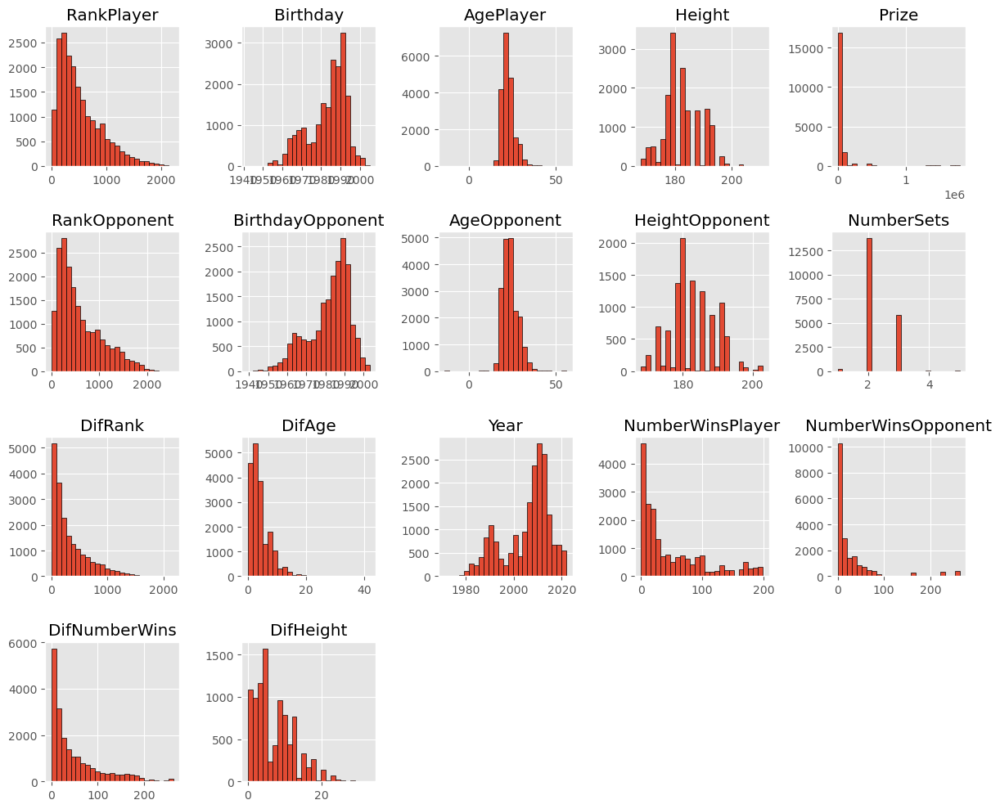

In [257]:
# histogramas
df_brasil.hist(bins=25, figsize=(12, 10), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

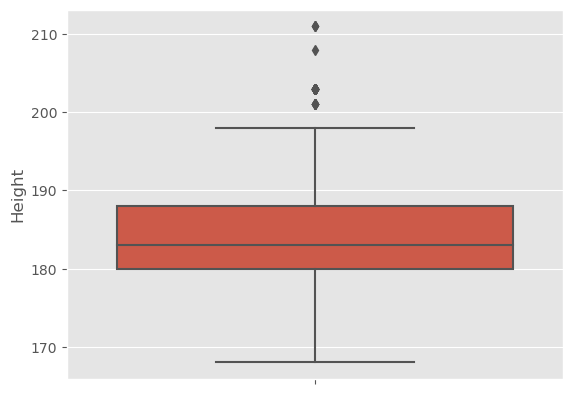

In [258]:
sns.boxplot(y="Height", data=df_brasil);

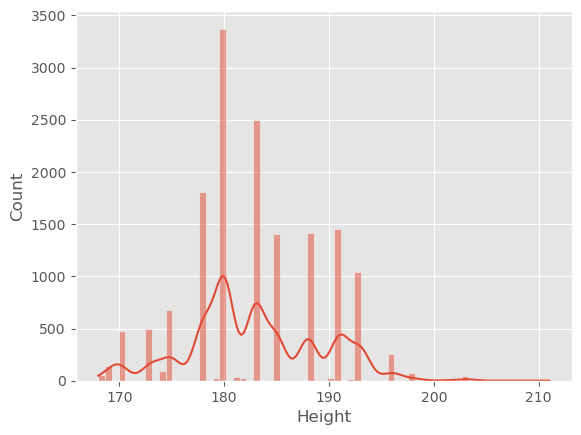

In [259]:
sns.histplot(df_brasil, x="Height", kde=True);

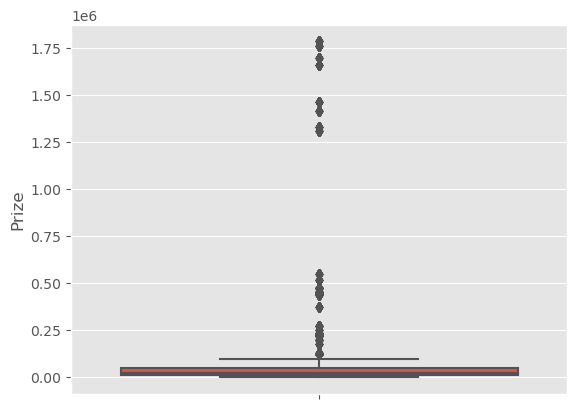

In [260]:
sns.boxplot(y="Prize", data=df_brasil);

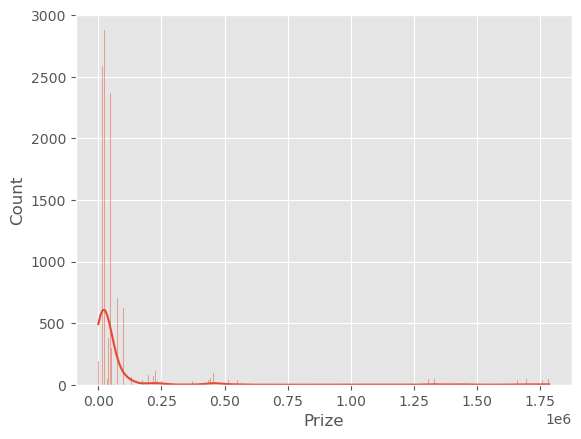

In [261]:
sns.histplot(df_brasil, x="Prize", kde=True)
plt.ylim(0, 3000);

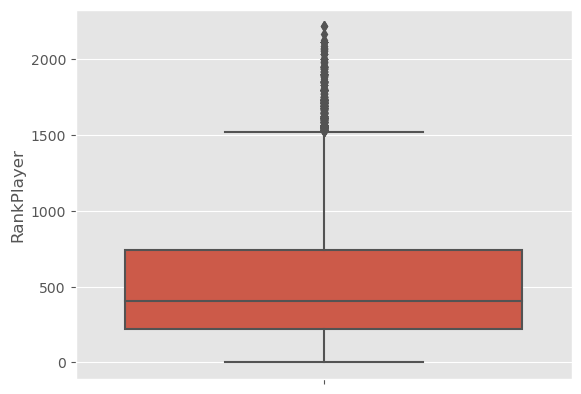

In [262]:
sns.boxplot(y="RankPlayer", data=df_brasil);

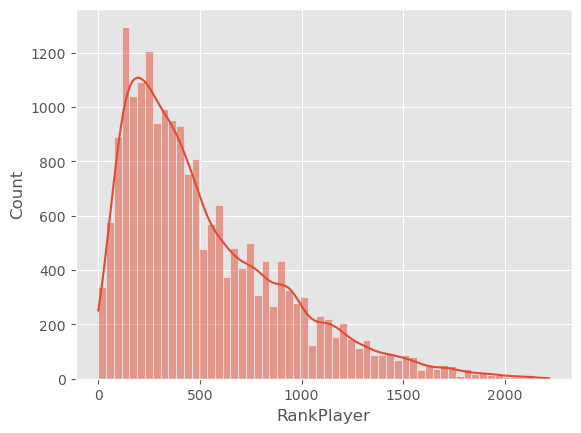

In [263]:
sns.histplot(df_brasil, x="RankPlayer", kde=True);

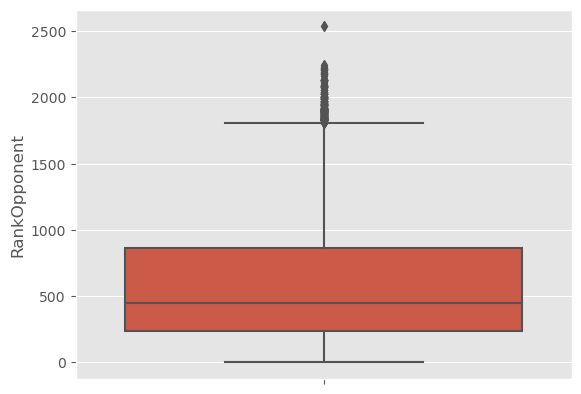

In [264]:
sns.boxplot(y="RankOpponent", data=df_brasil);

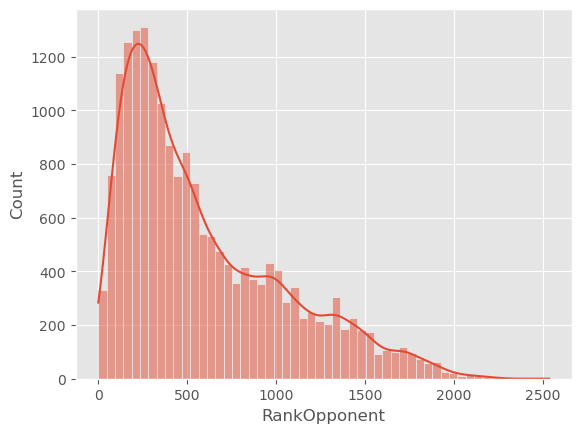

In [265]:
sns.histplot(df_brasil, x="RankOpponent", kde=True);

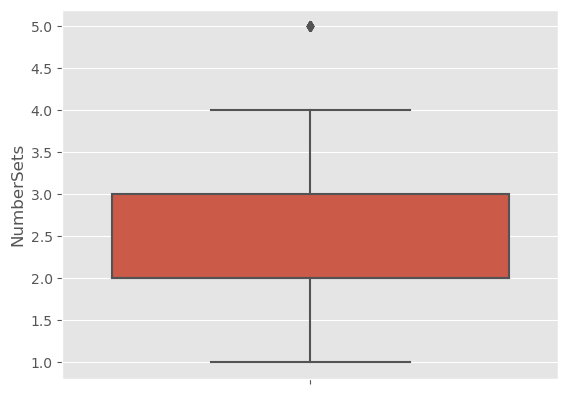

In [266]:
sns.boxplot(y="NumberSets", data=df_brasil);

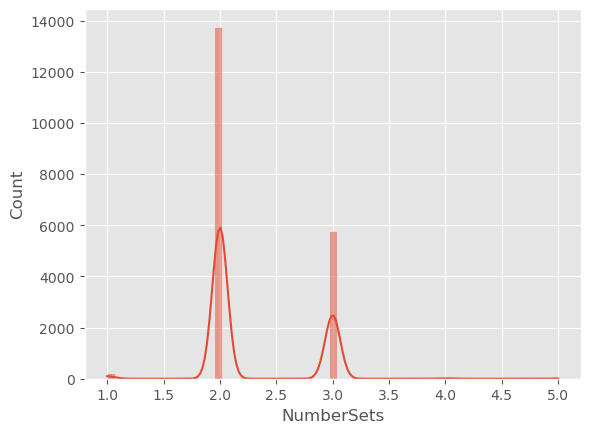

In [267]:
sns.histplot(df_brasil, x="NumberSets", kde=True);

In [268]:
# Identify numerical features 
df_c = df_brasil.select_dtypes(include="number")
df_c.shape

(19826, 15)

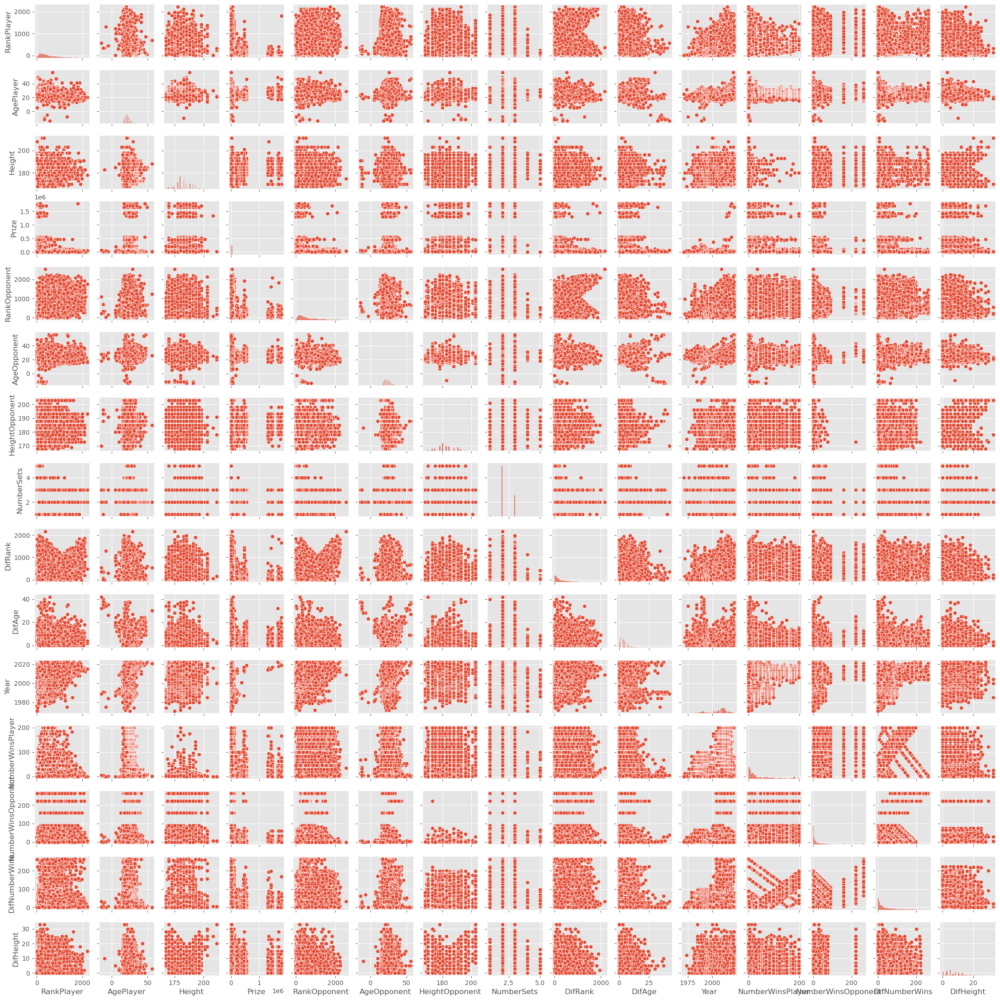

In [269]:
import seaborn as sns

sns.pairplot(df_c, height=1.5);

Existem diversos padrões de dispersão, alguns bastante complexos.

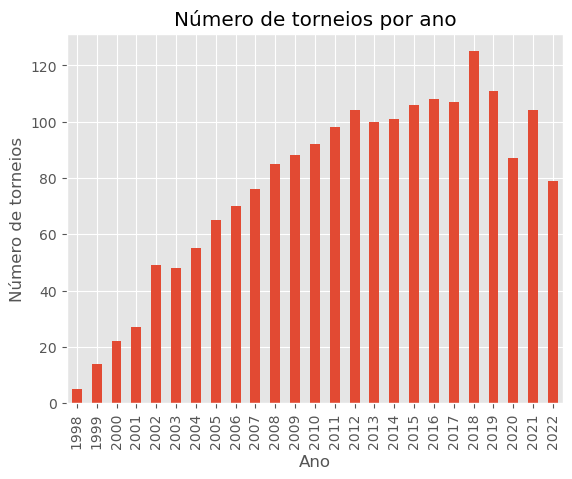

In [270]:
# Converte a coluna de datas em datetime
df_brasil['DateStart'] = pd.to_datetime(df['DateStart'])

# Extrai o ano das datas de início
df_brasil['ano'] = df_brasil['DateStart'].dt.year

# Agrupa os dados por ano e conta o número de torneios
contagem_por_ano = df_brasil.groupby('ano')['Tournament'].nunique()

# Plota um gráfico de linha com a contagem de torneios por ano
contagem_por_ano.plot(kind='bar')
plt.title('Número de torneios por ano')
plt.xlabel('Ano')
plt.ylabel('Número de torneios')
plt.show()

Pelo gráfico acima, pode-se perceber que o ano em que se tem mais torneios registados é o de 2018, já o que menos torneios tem são os anos de 1998 e 1999. 

### Análise descritiva final antes da modelação

In [274]:
df_brasil.shape

(19826, 42)

Temos 19826 linhas e 42 colunas.

In [273]:
df_brasil.isna().sum()

PlayerName                 0
RankPlayer                 0
Born                    4666
BornCity                4647
BornCountry               40
Birthday                   0
AgePlayer                  0
Height                  4358
Hand                    2975
L_OR_R                     9
LinkPlayer                 0
Tournament                 0
Location                   0
City                       0
Country                    0
Date                       0
DateStart                  0
DateEnd                    0
Ground                     0
Prize                      0
GameRound                  0
Oponent                    0
RankOpponent             622
BornOpponent            9357
BornCityOpponent        9344
BornCountryOpponent     3208
BirthdayOpponent         723
AgeOpponent              723
HeightOpponent          8984
HandOpponent            6788
L_OR_R_Opponent         3026
WL                         0
Score                      2
NumberSets                 0
DifRank       

19 variáveis com valores omissos.

In [275]:
df_brasil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19826 entries, 0 to 20137
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   PlayerName           19826 non-null  object        
 1   RankPlayer           19826 non-null  float64       
 2   Born                 15160 non-null  object        
 3   BornCity             15179 non-null  object        
 4   BornCountry          19786 non-null  object        
 5   Birthday             19826 non-null  datetime64[ns]
 6   AgePlayer            19826 non-null  float64       
 7   Height               15468 non-null  float64       
 8   Hand                 16851 non-null  object        
 9   L_OR_R               19817 non-null  object        
 10  LinkPlayer           19826 non-null  object        
 11  Tournament           19826 non-null  object        
 12  Location             19826 non-null  object        
 13  City                 19826 non-

Temos variáveis do tipo object, float, datetime e int.

In [276]:
df_brasil.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Height,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HeightOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,DifHeight,ano
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,188.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-22,2016-08-14 00:00:00,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5,10.0,2021
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2022-02-21,2016-08-14 00:00:00,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,178.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16,7.0,2022
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,188.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2,3.0,2021
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,198.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,136.0,3.0,2016,19,5,14,13.0,2021
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,185.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-01,2016-08-14 00:00:00,Hard,0.0,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,25.0,193.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,39.0,5.0,2016,19,3,16,8.0,2021


## Modelação

In [271]:
df_brasil['Score'] = df_brasil['Score'].astype(str)

In [272]:
# elimnar RET
df_brasil = df_brasil[~df_brasil['Score'].str.contains("RET")]

In [273]:
len(df_brasil)

19208

In [274]:
df_model_with_height = df_brasil.dropna() # eliminar linhas com valores omissos

In [275]:
df_brasil3 = df_model_with_height[df_model_with_height['NumberSets'] <= 3] # 1, 2 ou 3 sets

In [276]:
df_brasil5 = df_model_with_height[df_model_with_height['NumberSets'] > 3] # 4 ou 5 sets

In [277]:
### split data in train and test set
dtf_train, dtf_test = model_selection.train_test_split(df_brasil3, test_size=0.3)

## print info
print("train:", dtf_train.shape)
print("test:", dtf_test.shape)

train: (5852, 42)
test: (2509, 42)


### Correlação de Pearson entre as variáveis numéricas

In [278]:
dtf_sub = dtf_train[["DifHeight", "DifRank", "DifAge", "Prize", 
                     "DifNumberWins"]]

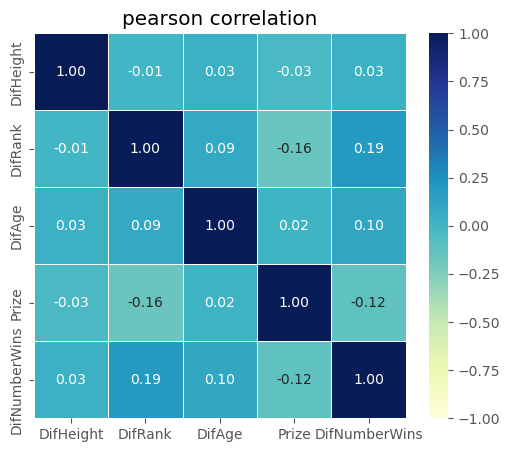

In [279]:
fig, ax = plt.subplots(figsize=(6,5))
corr_matrix = dtf_sub.select_dtypes(include=['int64', 'float64']).copy()
corr_matrix = corr_matrix.corr(method="pearson")
sns.heatmap(corr_matrix, vmin=-1., vmax=1., annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5, ax=ax)
plt.title("pearson correlation");

### CorrelaçãoV de Cramer entre variáveis categóricas

In [280]:
# dummy L_OR_R
dummy1 = pd.get_dummies(dtf_train["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_train = pd.concat([dtf_train, dummy1], axis=1)

## drop the original categorical column
dtf_train = dtf_train.drop("L_OR_R", axis=1)

In [281]:
# dummy L_OR_R_Opponent
dummy1_b = pd.get_dummies(dtf_train["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_train = pd.concat([dtf_train, dummy1_b], axis=1)

## drop the original categorical column
dtf_train = dtf_train.drop("L_OR_R_Opponent", axis=1)

In [282]:
# dummy Ground
dummy2 = pd.get_dummies(dtf_train["Ground"], prefix="Ground",drop_first=True)
dtf_train = pd.concat([dtf_train, dummy2], axis=1)

## drop the original categorical column
dtf_train = dtf_train.drop("Ground", axis=1)

In [283]:
columns_to_convert = ["L_OR_R_Left-Handed","L_OR_R_Right-Handed","L_OR_R_Opponent_Right-Handed","L_OR_R_Opponent_Left-Handed","Ground_Clay", "Ground_Hard", "NumberSets"]


for column in columns_to_convert:
    dtf_train[column] = dtf_train[column].astype('category')


In [284]:
import association_metrics as am

cramersv = am.CramersV(dtf_train) 

cramersv.fit()

,NumberSets,L_OR_R_Left-Handed,L_OR_R_Right-Handed,L_OR_R_Opponent_Left-Handed,L_OR_R_Opponent_Right-Handed,Ground_Clay,Ground_Hard
NumberSets,1.000000,0.026569,0.026012,0.039089,0.038210,0.008337,0.006735
L_OR_R_Left-Handed,0.026569,1.000000,0.998780,0.020957,0.021562,0.005182,0.005309
L_OR_R_Right-Handed,0.026012,0.998780,1.000000,0.021335,0.021940,0.004540,0.004699
L_OR_R_Opponent_Left-Handed,0.039089,0.020957,0.021335,1.000000,0.998070,0.049688,0.043919
L_OR_R_Opponent_Right-Handed,0.038210,0.021562,0.021940,0.998070,1.000000,0.050605,0.044794
Ground_Clay,0.008337,0.005182,0.004540,0.049688,0.050605,1.000000,0.949580
Ground_Hard,0.006735,0.005309,0.004699,0.043919,0.044794,0.949580,1.000000


### Multicolinearidade

In [285]:
### use VIF to analise multicollinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# compute the vif for all given features

def compute_vif(considered_features):
    
    X = dtf_train[considered_features]
    # the calculation of variance inflation requires a constant
    X['intercept'] = 1
    
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

In [286]:
considered_features = dtf_train.select_dtypes(include=['int64', 'float64']).columns

# compute vif 
compute_vif(considered_features).sort_values('VIF', ascending=False)


# compute vif 
compute_vif(considered_features).sort_values('VIF', ascending=False)

,Variable,VIF
12,DifNumberWins,3.278216
10,NumberWinsPlayer,2.995318
4,RankOpponent,2.142341
7,DifRank,2.089002
0,RankPlayer,1.798263
5,AgeOpponent,1.675055
9,Year,1.529286
11,NumberWinsOpponent,1.452556
8,DifAge,1.417368
3,Prize,1.293010


Nenhuma das variáveis tem multicolinearidade.

In [287]:
from collections import Counter
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
from sklearn.naive_bayes import GaussianNB
from sklearn import tree

### Modelos experimentados

Nesta secção, irão ser apresentados todos os modelos feitos com as suas respetivas combinações de variáveis, de forma a poder haver uma comparação da performance de cada um.

Cada combinação de variáveis irá ser experimentada em 5 algoritmos diferentes, come exceção dos primeiros modelos, pois foram a experimentação inicial.

#### Modelo 1 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight` com 1 a 3 sets

Criação da combinação de variáveis para este conjunto de modelos.

In [288]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']

X_train = dtf_train[X_names2].values

y_train = dtf_train["NumberSets"].values
X_test = dtf_test[X_names2].values
y_test = dtf_test["NumberSets"].values

- **Validação Cruzada com uma Random Forest com 5 folds**

In [289]:
### random forest

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.61656704 0.61229718 0.6008547  0.6034188  0.5957265 ]
0.6057728437233134


- **Algoritmo Decision Tree e Feature Importance**

In [290]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Verificação do peso de cada variável para este conjunto**

<BarContainer object of 4 artists>

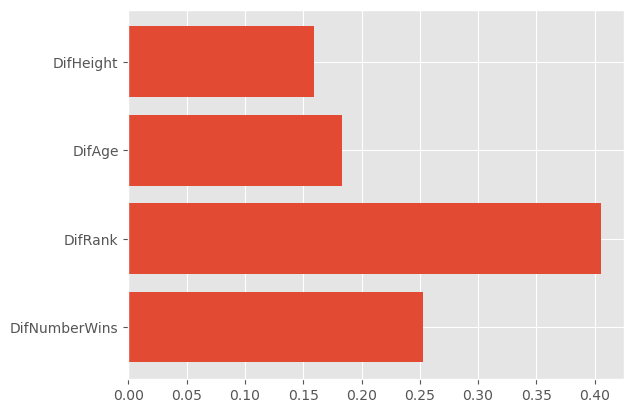

In [291]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Resultados do algoritmo Decison Tree para este conjunto de variáveis**

In [292]:

from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         9
           2       0.66      0.65      0.65      1648
           3       0.34      0.36      0.35       852

    accuracy                           0.55      2509
   macro avg       0.33      0.33      0.33      2509
weighted avg       0.55      0.55      0.55      2509



- **Algoritmo Gradient Boosting com 20 iterações**

In [293]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 6, 'learning_rate': 0.001}
Best Model mean accuracy: 0.658065646280847


In [294]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

- **Métricas para o algoritmo Gradient Boosting**

In [295]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         9
           2       0.66      1.00      0.79      1648
           3       0.00      0.00      0.00       852

    accuracy                           0.66      2509
   macro avg       0.22      0.33      0.26      2509
weighted avg       0.43      0.66      0.52      2509



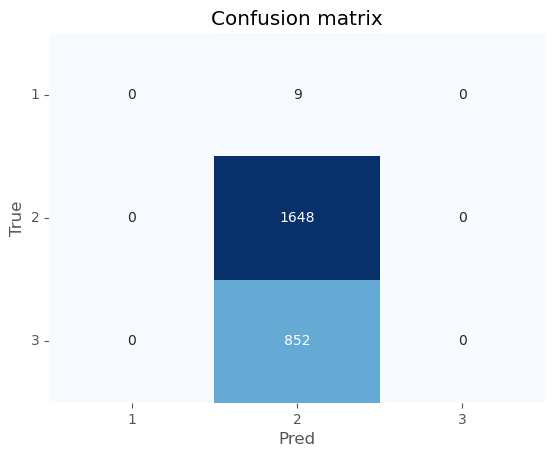

In [296]:
### confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [297]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
1,0.000000,0.000000,0.000000,9.000000
2,0.656835,1.000000,0.792879,1648.000000
3,0.000000,0.000000,0.000000,852.000000
accuracy,0.656835,0.656835,0.656835,0.656835
macro avg,0.218945,0.333333,0.264293,2509.000000
weighted avg,0.431433,0.656835,0.520791,2509.000000


- **AUC para o algoritmo Gradient Boosting**

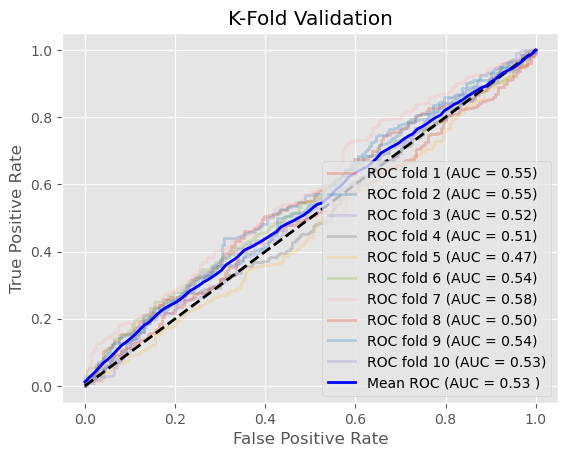

In [298]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=2.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

# representação gráfica da curva de ROC,  

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

---

#### Modelo com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight` com 4 e 5 sets

In [299]:
### split data in train and test set
dtf_train, dtf_test = model_selection.train_test_split(df_brasil5, test_size=0.3)

## print info
print("train:", dtf_train.shape)
print("test:", dtf_test.shape)

train: (32, 42)
test: (14, 42)


- **Criação do conjunto de variáveis para este bloco**

In [300]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']

X_train = dtf_train[X_names2].values

y_train = dtf_train["NumberSets"].values
X_test = dtf_test[X_names2].values
y_test = dtf_test["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds**

In [301]:
### random forest

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.71428571 0.71428571 0.66666667 1.         0.66666667]
0.7523809523809524


- **Algoritmo Decision Tree**

In [302]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance para este conjunto de variáveis**

<BarContainer object of 4 artists>

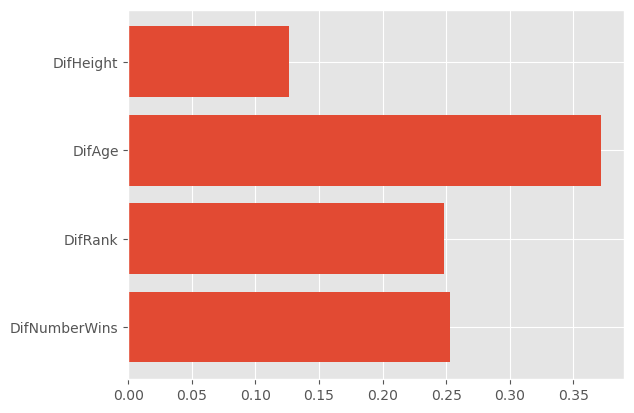

In [303]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação para a Decision Tree**

In [304]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           4       0.27      0.50      0.35         6
           5       0.00      0.00      0.00         8

    accuracy                           0.21        14
   macro avg       0.14      0.25      0.18        14
weighted avg       0.12      0.21      0.15        14



- **Uso do Gradient Boosting com 20 iterações**

In [305]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 750, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 2, 'max_depth': 2, 'learning_rate': 0.01}
Best Model mean accuracy: 0.719047619047619


- **Métricas de avaliação de perfornamnce para Gradient Boosting**

In [306]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [307]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.29
Precision (confidence when predicting a 1): 0.29
Detail:
              precision    recall  f1-score   support

           4       0.30      0.50      0.37         6
           5       0.25      0.12      0.17         8

    accuracy                           0.29        14
   macro avg       0.28      0.31      0.27        14
weighted avg       0.27      0.29      0.26        14



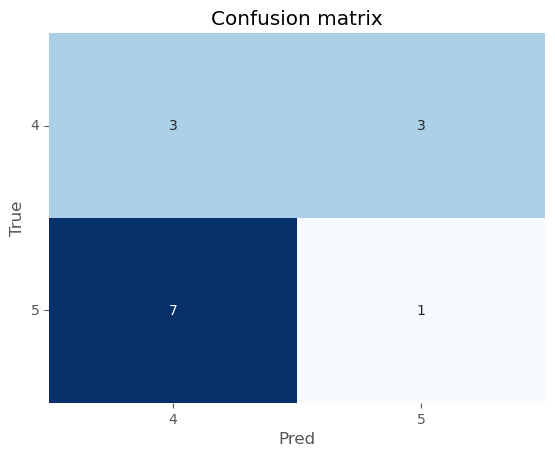

In [308]:
### confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_xticklabels(labels=classes, rotation=0)
ax.set_yticklabels(labels=classes, rotation=0)
plt.show()

In [309]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
4,0.300000,0.500000,0.375000,6.000000
5,0.250000,0.125000,0.166667,8.000000
accuracy,0.285714,0.285714,0.285714,0.285714
macro avg,0.275000,0.312500,0.270833,14.000000
weighted avg,0.271429,0.285714,0.255952,14.000000


- **AUC para Gradient Boosting**

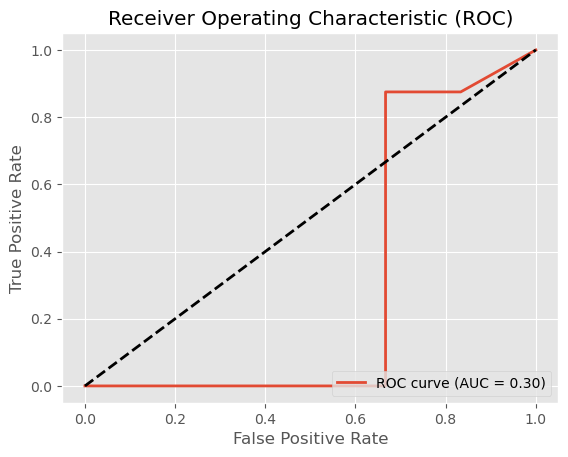

In [310]:
# curva ROC e AUC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# Train a gradient boosting classifier
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Obtain predicted probabilities for the positive class
probs = model.predict_proba(X_test)[:, 1]

# Convert y_test to 0 and 1 using LabelEncoder
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Compute FPR, TPR, and thresholds
fpr, tpr, thresholds = metrics.roc_curve(y_test_encoded, probs)

# Calculate the area under the ROC curve (AUC)
roc_auc = metrics.auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

---

####  Modelo 2 -  com `DifNumberWins`, `DifRank`, `DifAge` e `DifHeight` com 2 e 3 sets

A partir deste ponto não considerámos a previsão de sets de 1, 4 e 5 por razões referidas no relatório.

In [7]:
# Decisão de não prever sets de 1

In [311]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [312]:
df_brasil = df_brasil.dropna()

In [8]:
# Decisão de não prever sets de 4 e de 5

In [313]:
df_brasil3 = df_brasil[df_brasil['NumberSets'] <= 3]

In [314]:
len(df_brasil)

8383

In [315]:
### split data in train and test set
dtf_train, dtf_test = model_selection.train_test_split(df_brasil3, test_size=0.3)

## print info
print("train:", dtf_train.shape)
print("test:", dtf_test.shape)

train: (5835, 42)
test: (2502, 42)


- **Seleção do conjunto de variáveis para este bloco**

In [316]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']

X_train = dtf_train[X_names2].values

y_train = dtf_train["NumberSets"].values
X_test = dtf_test[X_names2].values
y_test = dtf_test["NumberSets"].values

- **Validação Cruzada com Random forest com 5 e 10 folds**

In [317]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.59982862 0.59811482 0.60154242 0.61353899 0.6083976 ]
0.6042844901456726


- **AUC para Random Forest Classifier com 5 folds**

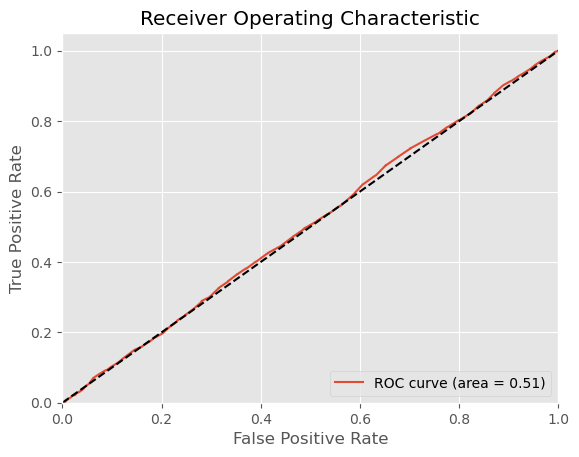

In [318]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **O resultado do Random Forest Classifier**

In [319]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.62328767 0.63013699 0.59075342 0.61130137 0.59589041 0.59005146
 0.60891938 0.61578045 0.61063465 0.61063465]
0.6087390446204093


- **AUC para Random Forest Classifier com 10 folds**

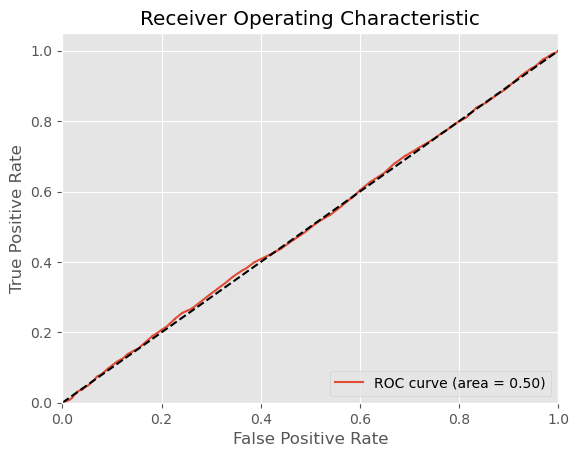

In [320]:
# curva ROC e AUC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [321]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance para este conjunto de variáveis**

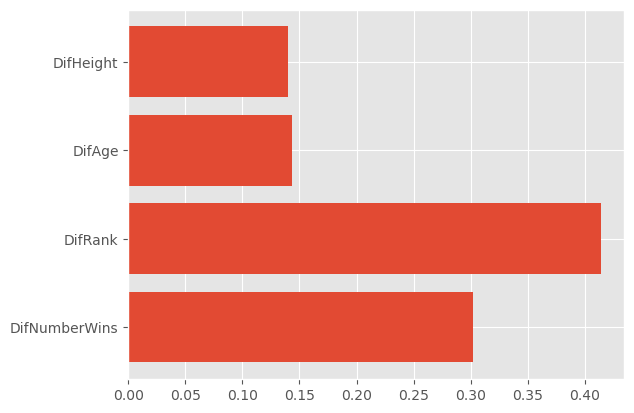

In [322]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight']
plt.barh(feature_names, dt.feature_importances_); # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [323]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.64      0.65      1639
           3       0.35      0.37      0.36       863

    accuracy                           0.55      2502
   macro avg       0.50      0.50      0.50      2502
weighted avg       0.55      0.55      0.55      2502



- **Curva de ROC e AUC para a Decision Tree**

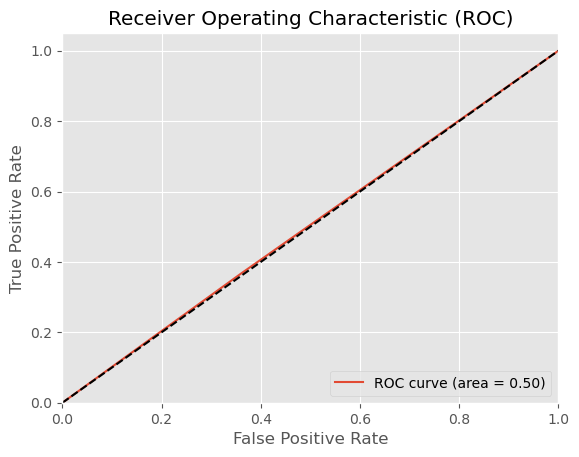

In [324]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Gradient Boosting com 20 iterações**

In [326]:
## call model - 20 iter
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      
             # weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    # sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     # the minimum number of samples to form a leaf
'max_features':[2,3,4],     # square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       
# the fraction of samples to be used for fitting the individual base learners. 
# Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 1250, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6616966580976864


In [327]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

- **Avaliação de performance do Gradient Boosting**

In [329]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1639
           3       0.60      0.00      0.01       863

    accuracy                           0.66      2502
   macro avg       0.63      0.50      0.40      2502
weighted avg       0.64      0.66      0.52      2502



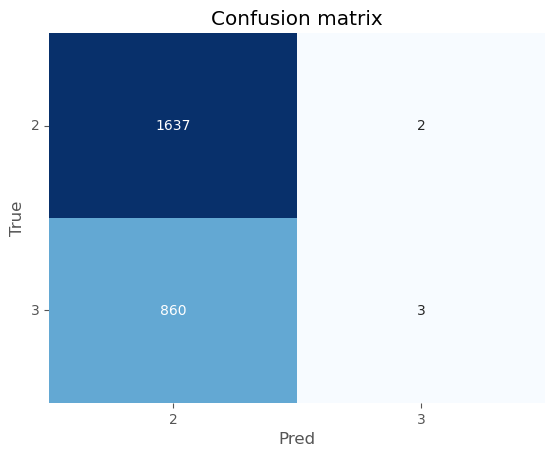

In [330]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [331]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.655587,0.998780,0.791586,1639.000000
3,0.600000,0.003476,0.006912,863.000000
accuracy,0.655476,0.655476,0.655476,0.655476
macro avg,0.627793,0.501128,0.399249,2502.000000
weighted avg,0.636414,0.655476,0.520933,2502.000000


- **AUC do Gradient Boosting**

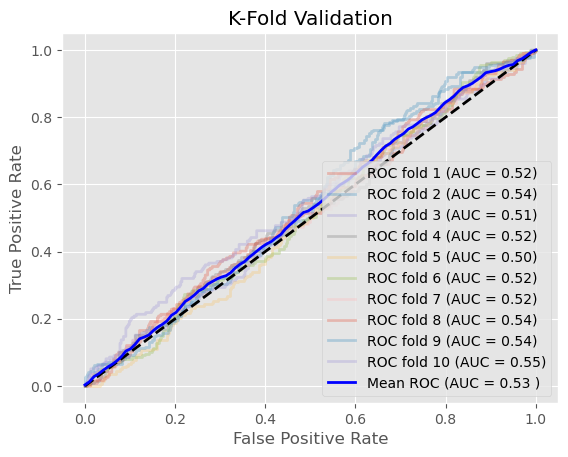

In [332]:
# curva ROC e AUC - 20 iter
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Gradient Boosting com 40 iterações**

In [333]:
## call model - 40 iter
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=40, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 6, 'learning_rate': 0.001}
Best Model mean accuracy: 0.6615252784918595


In [334]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

- **Métricas de performance com Gradient Boosting (para as 40 iterações)**

In [335]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1639
           3       0.00      0.00      0.00       863

    accuracy                           0.66      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.43      0.66      0.52      2502



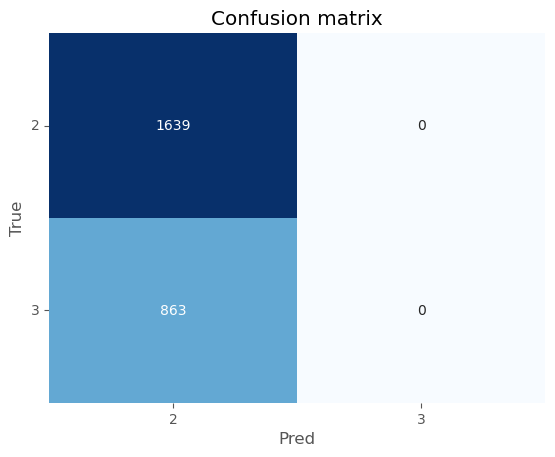

In [336]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [337]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.655076,1.000000,0.791596,1639.000000
3,0.000000,0.000000,0.000000,863.000000
accuracy,0.655076,0.655076,0.655076,0.655076
macro avg,0.327538,0.500000,0.395798,2502.000000
weighted avg,0.429124,0.655076,0.518556,2502.000000


- **Algoritmo AdaBoost e métricas de performance**

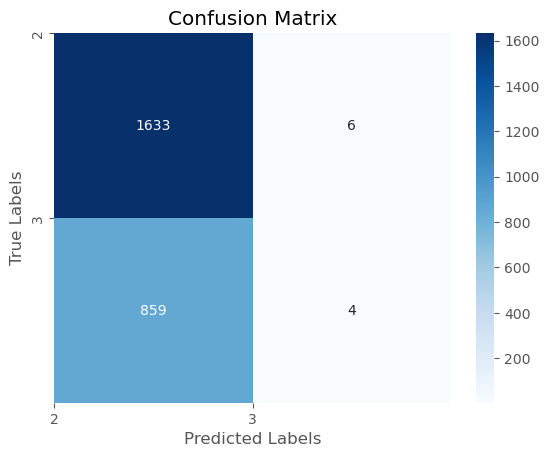

              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1639
           3       0.40      0.00      0.01       863

    accuracy                           0.65      2502
   macro avg       0.53      0.50      0.40      2502
weighted avg       0.57      0.65      0.52      2502



In [338]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

- **AUC para Ada Boost**

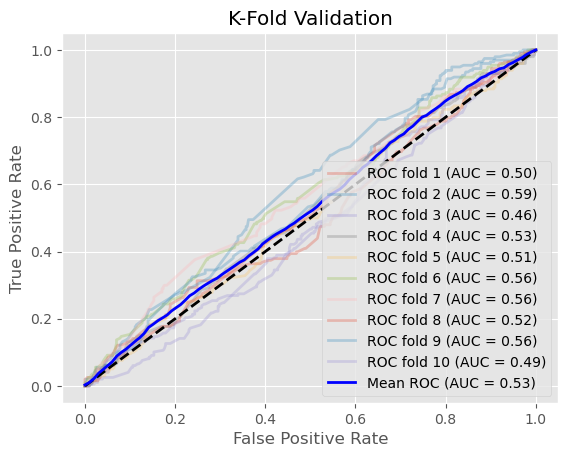

In [339]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e respetivas métricas de performance**

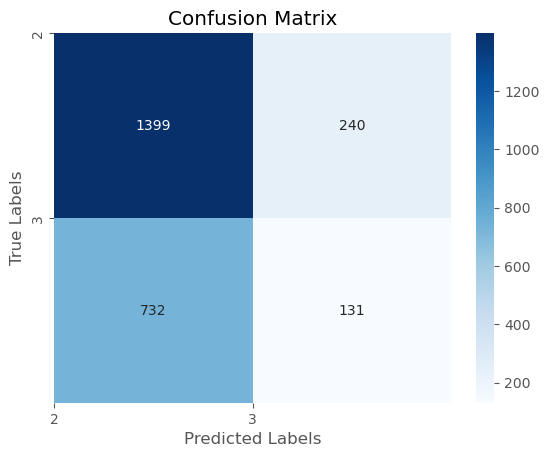

              precision    recall  f1-score   support

           2       0.66      0.85      0.74      1639
           3       0.35      0.15      0.21       863

    accuracy                           0.61      2502
   macro avg       0.50      0.50      0.48      2502
weighted avg       0.55      0.61      0.56      2502



In [340]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

- **AUC para XGBoost**

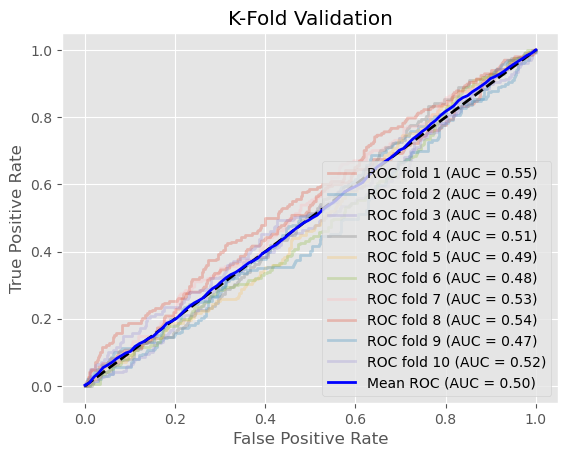

In [341]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 3 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight` e `Prize` com sets de 2 e 3

In [342]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [343]:
df_brasil = df_brasil.dropna()

In [344]:
df_brasil1 = df_brasil[df_brasil['NumberSets'] <= 3]

In [345]:
len(df_brasil)

8383

In [346]:
### split data in train and test set
dtf_train, dtf_test = model_selection.train_test_split(df_brasil1, test_size=0.3)

## print info
print("train:", dtf_train.shape)
print("test:", dtf_test.shape)

train: (5835, 42)
test: (2502, 42)


- **Seleção das variáveis para este conjunto**

In [347]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', "Prize"]

X_train = dtf_train[X_names2].values

y_train = dtf_train["NumberSets"].values
X_test = dtf_test[X_names2].values
y_test = dtf_test["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 e 10 folds e respetivos AUC**

In [348]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.62896315 0.61610968 0.61696658 0.61696658 0.62296487]
0.6203941730934018


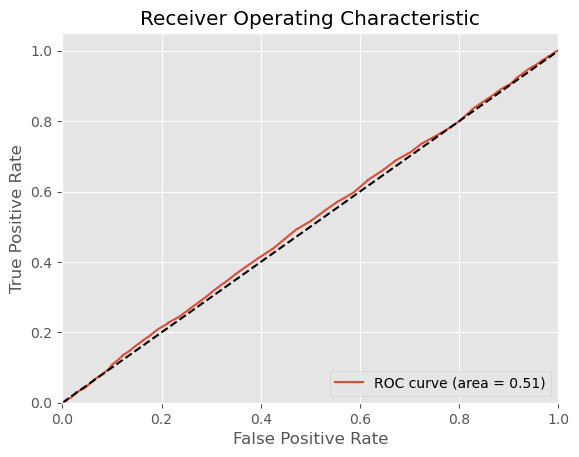

In [349]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [350]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61815068 0.64212329 0.61472603 0.6010274  0.61986301 0.60720412
 0.62607204 0.61234991 0.63121784 0.6380789 ]
0.6210813223994924


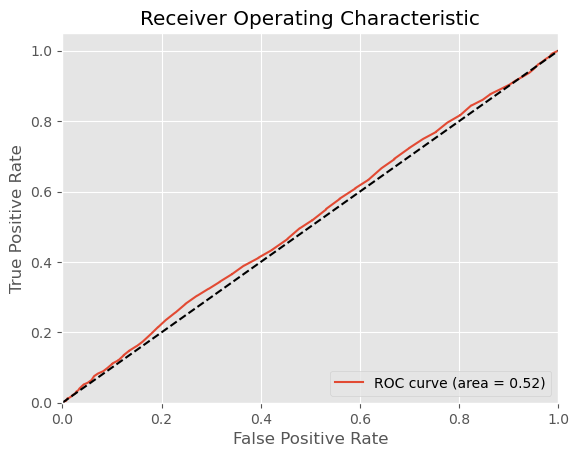

In [351]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algortimo Decision Tree**

In [352]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature importance para este conjunto**

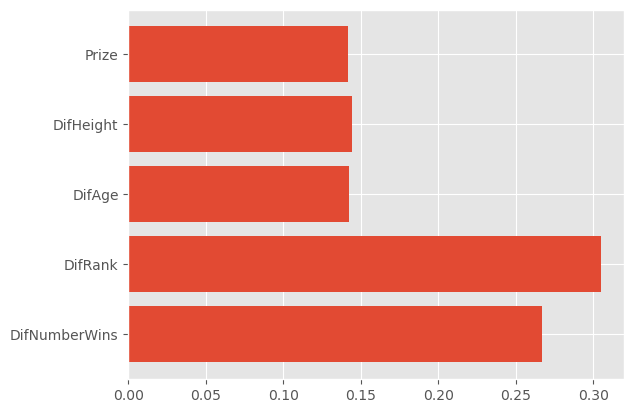

In [353]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize']
plt.barh(feature_names, dt.feature_importances_); # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [354]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.67      0.66      1651
           3       0.35      0.34      0.34       851

    accuracy                           0.56      2502
   macro avg       0.50      0.50      0.50      2502
weighted avg       0.56      0.56      0.56      2502



- **AUC para a Decision Tree**

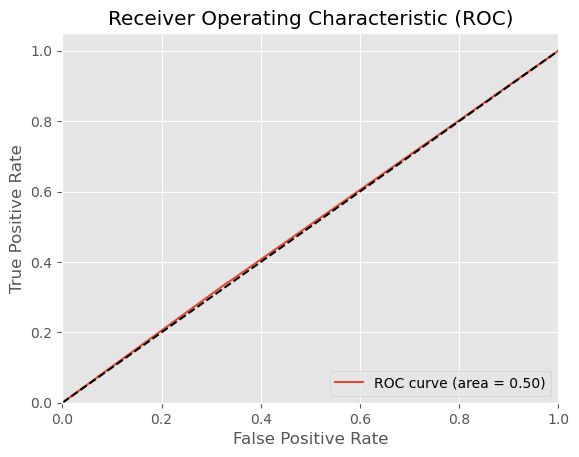

In [355]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações**

In [356]:
## call model - 20 iter
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 1250, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6599828620394173


- **Métricas de avaliação de performance para o Gradient Boosting**

In [357]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [358]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      0.99      0.79      1651
           3       0.35      0.01      0.01       851

    accuracy                           0.66      2502
   macro avg       0.51      0.50      0.40      2502
weighted avg       0.56      0.66      0.53      2502



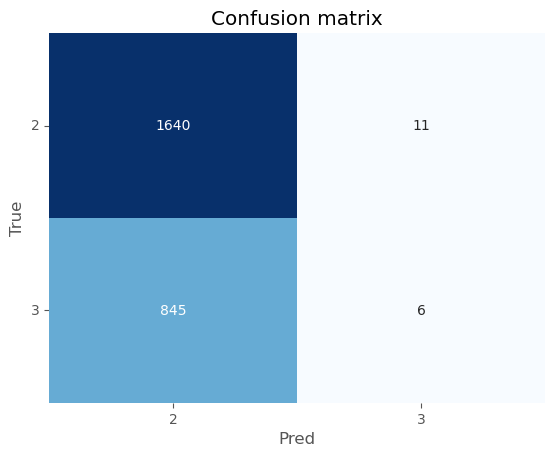

In [359]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [360]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.659960,0.993337,0.793037,1651.000000
3,0.352941,0.007051,0.013825,851.000000
accuracy,0.657874,0.657874,0.657874,0.657874
macro avg,0.506450,0.500194,0.403431,2502.000000
weighted avg,0.555534,0.657874,0.528005,2502.000000


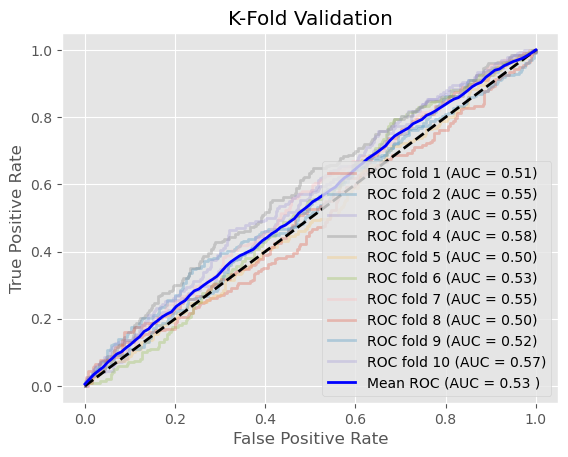

In [361]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algortimo Gradient Boosting com 40 iterações**

In [362]:
## call model - 40 iter
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=40, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 500, 'min_samples_split': 100, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 4, 'learning_rate': 0.005}
Best Model mean accuracy: 0.660497000856898


- **Avaliação de performance do Gradient Boosting (com 40 iterações)**

In [363]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [364]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1651
           3       0.33      0.00      0.00       851

    accuracy                           0.66      2502
   macro avg       0.50      0.50      0.40      2502
weighted avg       0.55      0.66      0.53      2502



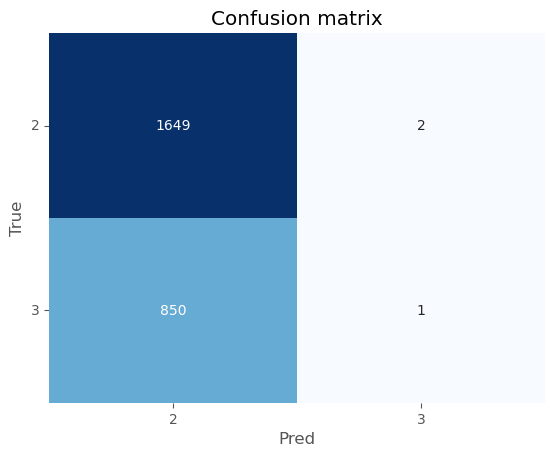

In [365]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [366]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.659864,0.998789,0.794699,1651.000000
3,0.333333,0.001175,0.002342,851.000000
accuracy,0.659472,0.659472,0.659472,0.659472
macro avg,0.496599,0.499982,0.398520,2502.000000
weighted avg,0.548802,0.659472,0.525196,2502.000000


- **Algoritmo AdaBoost**

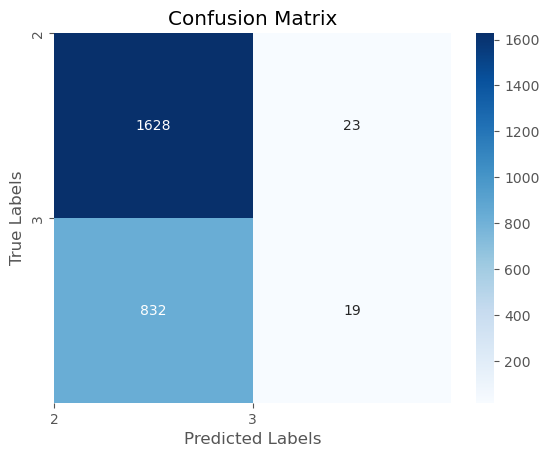

              precision    recall  f1-score   support

           2       0.66      0.99      0.79      1651
           3       0.45      0.02      0.04       851

    accuracy                           0.66      2502
   macro avg       0.56      0.50      0.42      2502
weighted avg       0.59      0.66      0.54      2502



In [367]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

- **AUC para o Ada Boost**

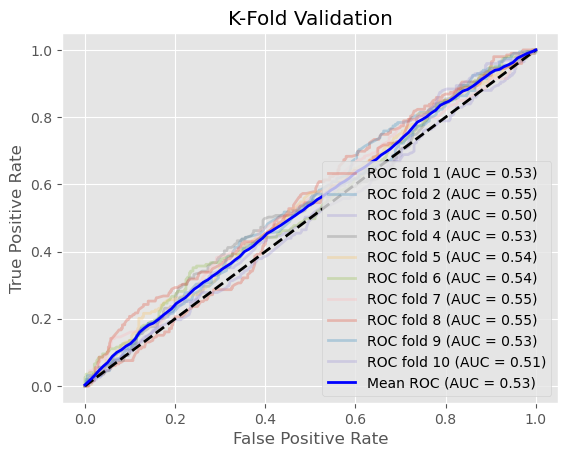

In [368]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e respetivas métricas de avaliação de performance**

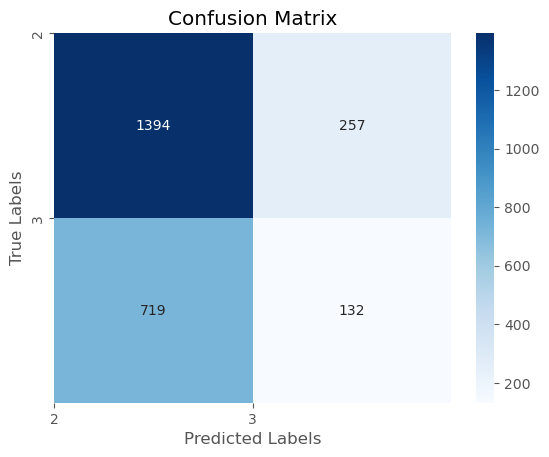

              precision    recall  f1-score   support

           2       0.66      0.84      0.74      1651
           3       0.34      0.16      0.21       851

    accuracy                           0.61      2502
   macro avg       0.50      0.50      0.48      2502
weighted avg       0.55      0.61      0.56      2502



In [369]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

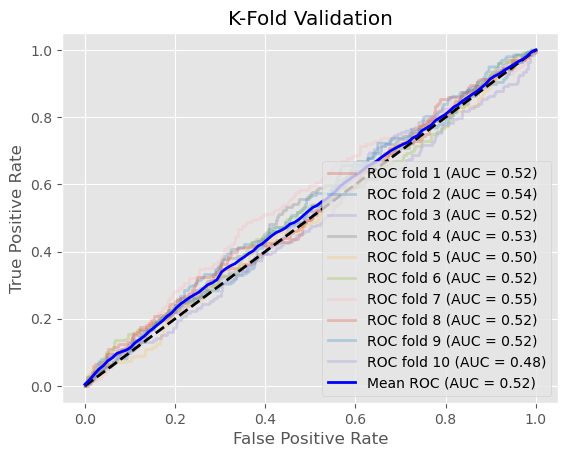

In [370]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 4 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `L_OR_R_Left-Handed`, `L_OR_R_Right-Handed`, 

#### `L_OR_R_Opponent_Left-Handed`, `L_OR_R_Opponent_Right-Handed` com sets de 2 e 3

In [371]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [372]:
df_brasil = df_brasil.dropna()

In [373]:
df_brasil2 = df_brasil[df_brasil['NumberSets'] <= 3]

In [374]:
len(df_brasil)

8383

In [375]:
### split data in train and test set
dtf_train2, dtf_test2 = model_selection.train_test_split(df_brasil2, test_size=0.3)

## print info
print("train:", dtf_train2.shape)
print("test:", dtf_test2.shape)

train: (5835, 42)
test: (2502, 42)


- **Criação de variáveis dummy para a variável `L_OR_R`**

In [376]:
# dummy L_OR_R teste
dummy1 = pd.get_dummies(dtf_test2["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_test2= pd.concat([dtf_test2, dummy1], axis=1)

In [377]:
## drop the original categorical column
dtf_test2 = dtf_test2.drop("L_OR_R", axis=1)

In [378]:
# dummy L_OR_Opponent
dummy1_b = pd.get_dummies(dtf_test2["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_test2= pd.concat([dtf_test2, dummy1_b], axis=1)

## drop the original categorical column
dtf_test2 = dtf_test2.drop("L_OR_R_Opponent", axis=1)

In [379]:
# dummy L_OR_R treino
dummy1 = pd.get_dummies(dtf_train2["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_train2 = pd.concat([dtf_train2, dummy1], axis=1)

## drop the original categorical column
dtf_train2 = dtf_train2.drop("L_OR_R", axis=1)

In [380]:
# dummy L_OR_Opponent treino
dummy1_b = pd.get_dummies(dtf_train2["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_train2 = pd.concat([dtf_train2, dummy1_b], axis=1)

## drop the original categorical column
dtf_train2 = dtf_train2.drop("L_OR_R_Opponent", axis=1)

In [9]:
# Conversão das variáveis dummy para o tipo categórico"

In [381]:
columns_to_convert = ["L_OR_R_Left-Handed","L_OR_R_Right-Handed","L_OR_R_Opponent_Right-Handed","L_OR_R_Opponent_Left-Handed"]


for column in columns_to_convert:
    dtf_train2[column] = dtf_train2[column].astype('category')

- **Seleção do conjunto de variáveis para este bloco**

In [382]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed']

X_train = dtf_train2[X_names2].values

y_train = dtf_train2["NumberSets"].values
X_test = dtf_test2[X_names2].values
y_test = dtf_test2["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds**

In [383]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.6101114  0.59297344 0.60154242 0.62039417 0.60497001]
0.6059982862039417


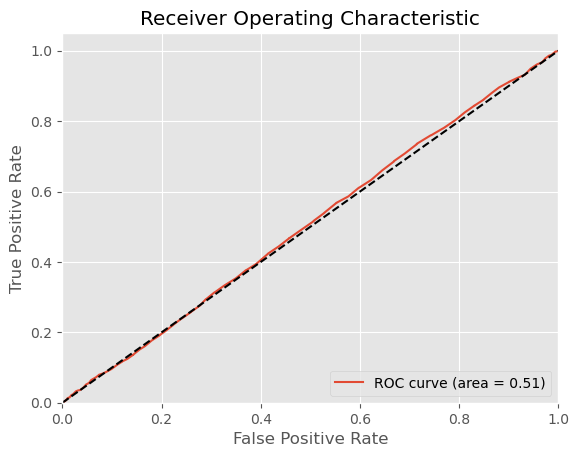

In [384]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 fold**

In [385]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61472603 0.61643836 0.59931507 0.59075342 0.625      0.60891938
 0.59691252 0.61406518 0.59862779 0.59691252]
0.6061670269508211


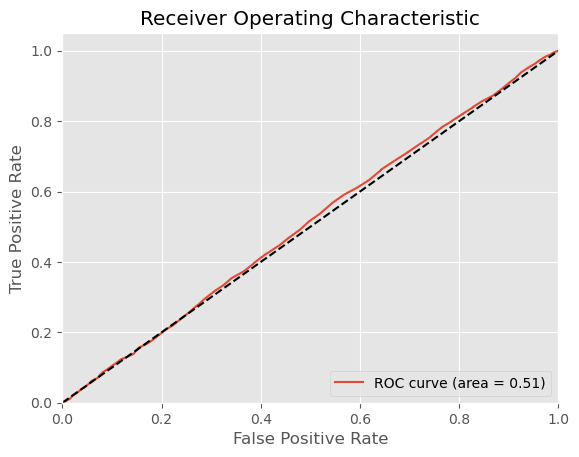

In [386]:
# curva ROC e AUC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree** 

In [387]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

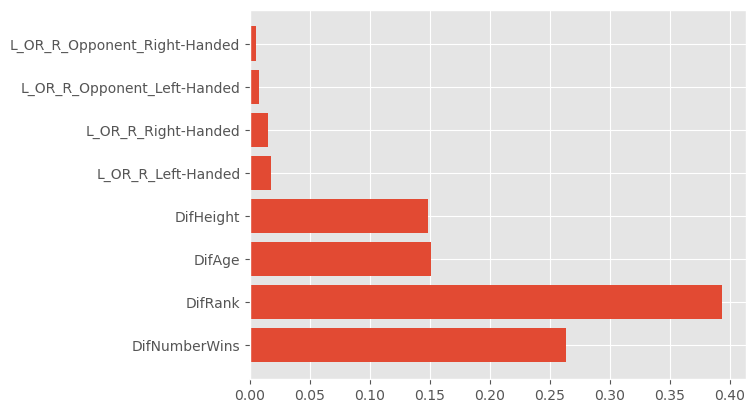

In [388]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed']
plt.barh(feature_names, dt.feature_importances_); # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [389]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.65      0.64      0.65      1638
           3       0.34      0.34      0.34       864

    accuracy                           0.54      2502
   macro avg       0.49      0.49      0.49      2502
weighted avg       0.54      0.54      0.54      2502



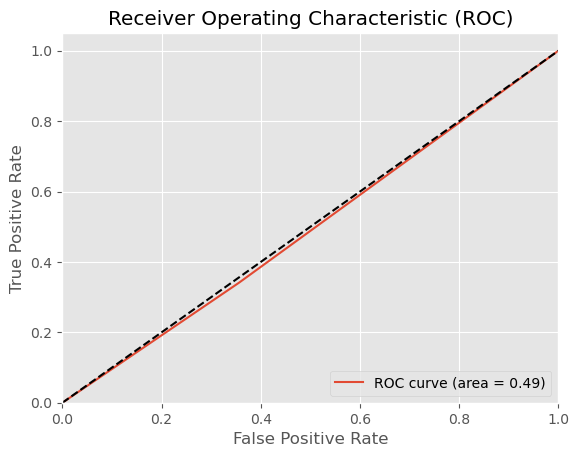

In [390]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações e respetivas métricas de avaliação de performance**

In [391]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 6, 'learning_rate': 0.001}
Best Model mean accuracy: 0.6616966580976864


In [392]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [393]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.65
Precision (confidence when predicting a 1): 0.65
Detail:
              precision    recall  f1-score   support

           2       0.65      1.00      0.79      1638
           3       0.00      0.00      0.00       864

    accuracy                           0.65      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.43      0.65      0.52      2502



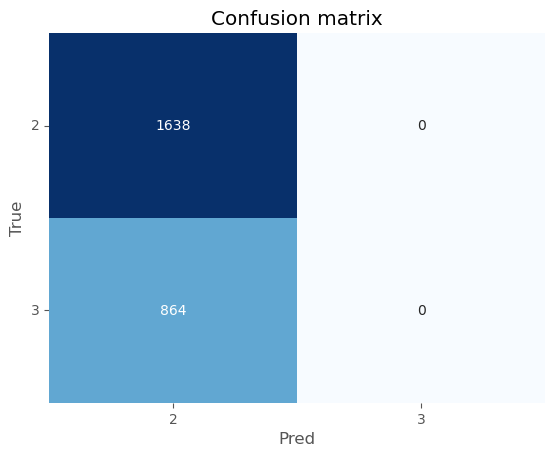

In [394]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [395]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.654676,1.000000,0.791304,1638.000000
3,0.000000,0.000000,0.000000,864.000000
accuracy,0.654676,0.654676,0.654676,0.654676
macro avg,0.327338,0.500000,0.395652,2502.000000
weighted avg,0.428601,0.654676,0.518048,2502.000000


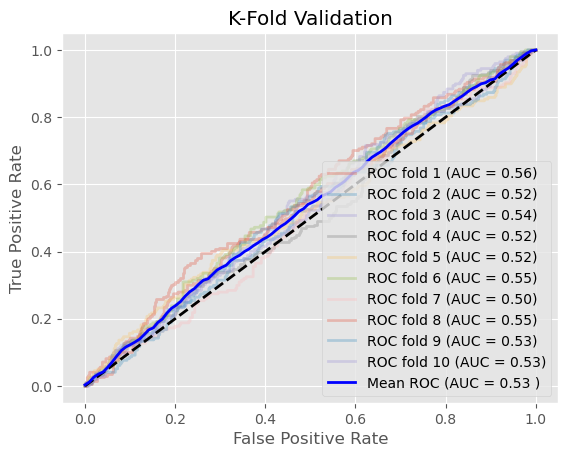

In [396]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e respetivas métricas de performance**

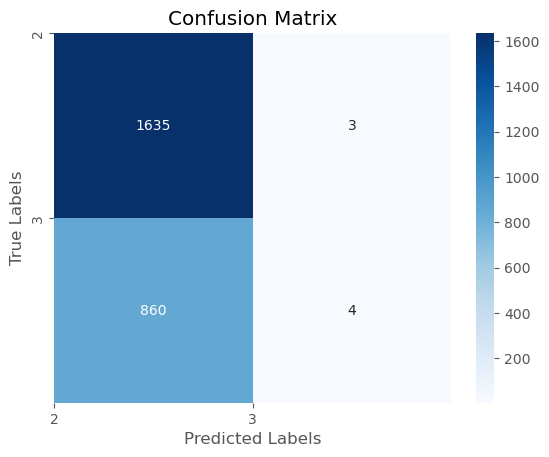

              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1638
           3       0.57      0.00      0.01       864

    accuracy                           0.66      2502
   macro avg       0.61      0.50      0.40      2502
weighted avg       0.63      0.66      0.52      2502



In [397]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

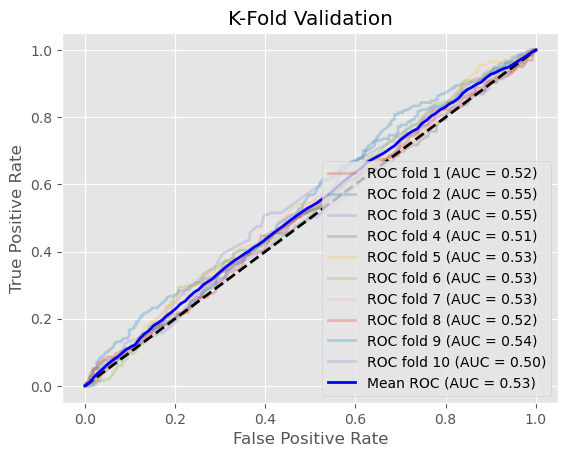

In [398]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e respetivas métricas de performance**

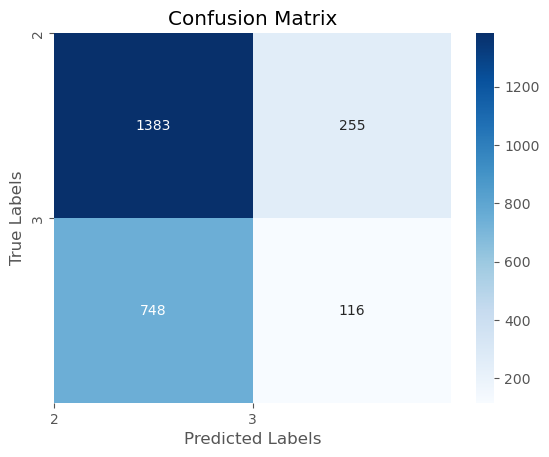

              precision    recall  f1-score   support

           2       0.65      0.84      0.73      1638
           3       0.31      0.13      0.19       864

    accuracy                           0.60      2502
   macro avg       0.48      0.49      0.46      2502
weighted avg       0.53      0.60      0.55      2502



In [399]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

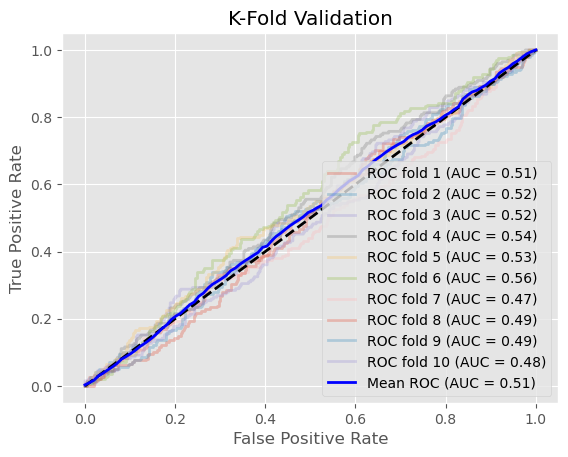

In [400]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

#### Modelo 5 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Prize`, `L_OR_R_Left-Handed`, `L_OR_R_Right-`

#### `Handed`, `L_OR_R_Opponent_Left-Handed`, `L_OR_R_Opponent_Right-Handed` com sets de 2 e 3

In [401]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [402]:
df_brasil = df_brasil.dropna()

In [403]:
df_brasil12 = df_brasil[df_brasil['NumberSets'] <= 3]

In [404]:
len(df_brasil)

8383

In [405]:
### split data in train and test set
dtf_train12, dtf_test12 = model_selection.train_test_split(df_brasil12, test_size=0.3)

## print info
print("train:", dtf_train12.shape)
print("test:", dtf_test12.shape)

train: (5835, 42)
test: (2502, 42)


In [406]:
# dummy L_OR_R teste
dummy1 = pd.get_dummies(dtf_test12["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_test12= pd.concat([dtf_test12, dummy1], axis=1)
## drop the original categorical column
dtf_test12 = dtf_test12.drop("L_OR_R", axis=1)

In [407]:
# dummy L_OR_R_Opponent teste
dummy1_b = pd.get_dummies(dtf_test12["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_test12= pd.concat([dtf_test12, dummy1_b], axis=1)

## drop the original categorical column
dtf_test12 = dtf_test12.drop("L_OR_R_Opponent", axis=1)

In [408]:
# dummy L_OR_R treino
dummy1 = pd.get_dummies(dtf_train12["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_train12 = pd.concat([dtf_train12, dummy1], axis=1)

## drop the original categorical column
dtf_train12 = dtf_train12.drop("L_OR_R", axis=1)

In [409]:
# dummy L_OR_R_Opponent teste
dummy1_b = pd.get_dummies(dtf_train12["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_train12 = pd.concat([dtf_train12, dummy1_b], axis=1)

## drop the original categorical column
dtf_train12 = dtf_train12.drop("L_OR_R_Opponent", axis=1)

In [410]:
columns_to_convert = ["L_OR_R_Left-Handed","L_OR_R_Right-Handed","L_OR_R_Opponent_Right-Handed","L_OR_R_Opponent_Left-Handed"]


for column in columns_to_convert:
    dtf_train12[column] = dtf_train12[column].astype('category')

In [411]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed']

X_train = dtf_train12[X_names2].values

y_train = dtf_train12["NumberSets"].values
X_test = dtf_test12[X_names2].values
y_test = dtf_test12["NumberSets"].values

Random Forest com 5 e 10 folds

In [412]:
### random forest - folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.63410454 0.61353899 0.62210797 0.61868038 0.59125964]
0.6159383033419024


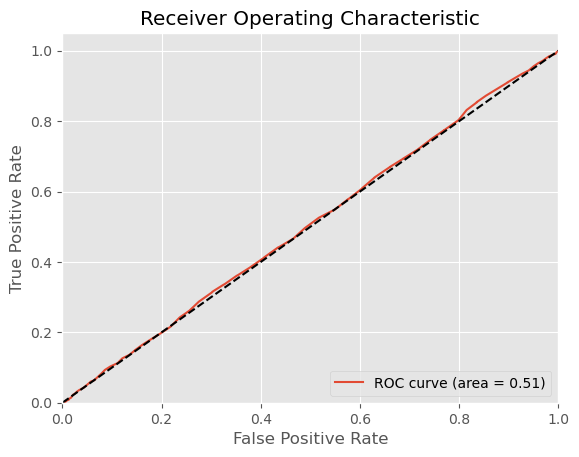

In [413]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [414]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61643836 0.64554795 0.61130137 0.61986301 0.61986301 0.61578045
 0.63121784 0.61921098 0.61234991 0.58662093]
0.617819380154609


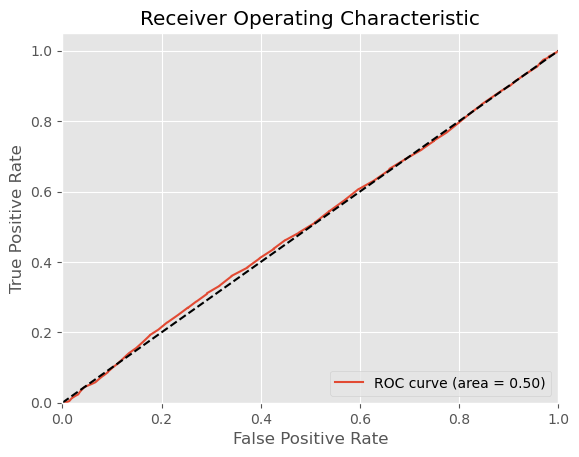

In [415]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [416]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

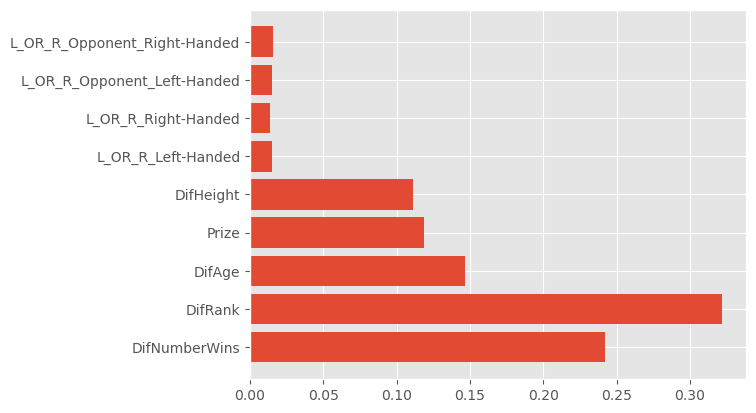

In [417]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize', 'DifHeight', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed']
plt.barh(feature_names, dt.feature_importances_); # representação da imp das var 

- **Métricas de avaliação de performance da Decision Tree**

In [418]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.67      0.65      0.66      1660
           3       0.36      0.38      0.37       842

    accuracy                           0.56      2502
   macro avg       0.51      0.52      0.51      2502
weighted avg       0.57      0.56      0.56      2502



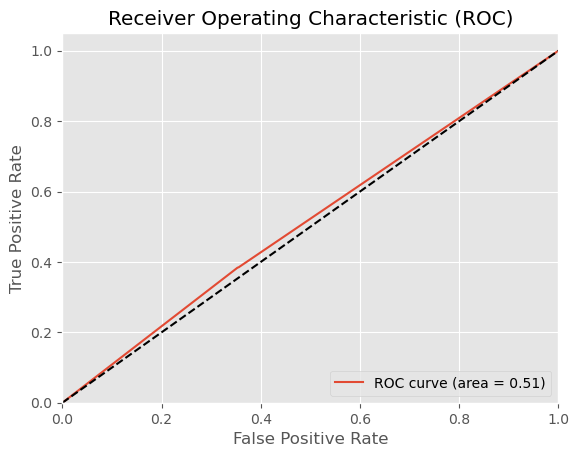

In [419]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações**

In [420]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 750, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 2, 'max_depth': 2, 'learning_rate': 0.01}
Best Model mean accuracy: 0.6589545844044559


- **Métricas de avaliação de performance do Gradient Boosting **

In [421]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [422]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.80      1660
           3       0.36      0.00      0.01       842

    accuracy                           0.66      2502
   macro avg       0.51      0.50      0.40      2502
weighted avg       0.56      0.66      0.53      2502



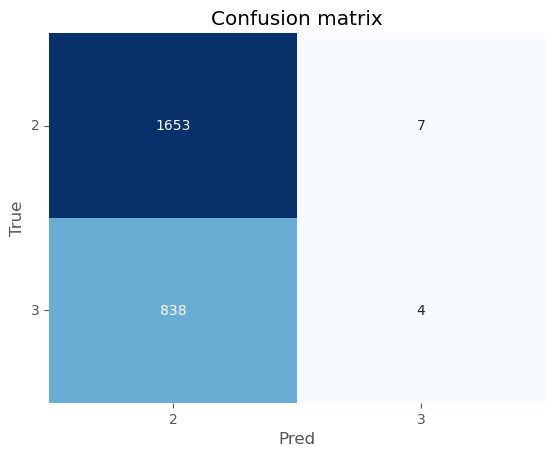

In [423]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [424]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.663589,0.995783,0.796435,1660.00000
3,0.363636,0.004751,0.009379,842.00000
accuracy,0.662270,0.662270,0.662270,0.66227
macro avg,0.513613,0.500267,0.402907,2502.00000
weighted avg,0.562646,0.662270,0.531566,2502.00000


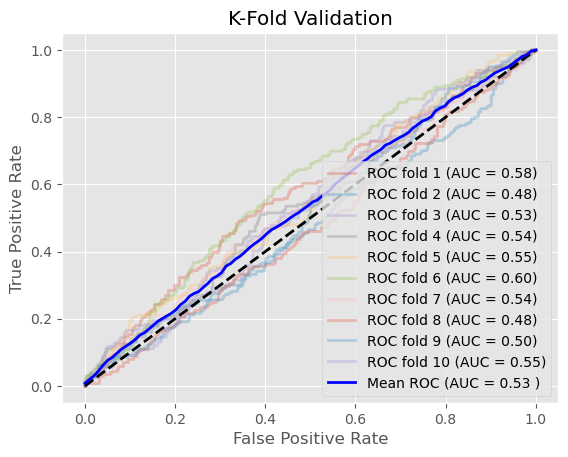

In [425]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e métricas da respetiva performance**

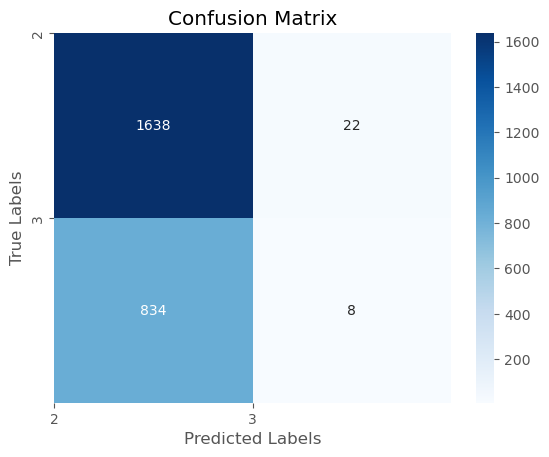

              precision    recall  f1-score   support

           2       0.66      0.99      0.79      1660
           3       0.27      0.01      0.02       842

    accuracy                           0.66      2502
   macro avg       0.46      0.50      0.41      2502
weighted avg       0.53      0.66      0.53      2502



In [426]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

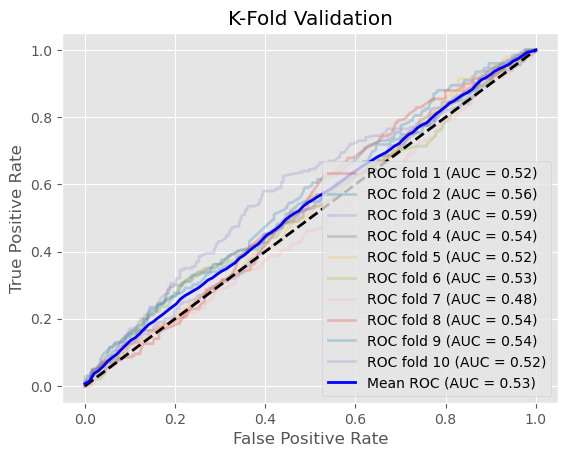

In [427]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e respetivas métricas de avaliação de performance**

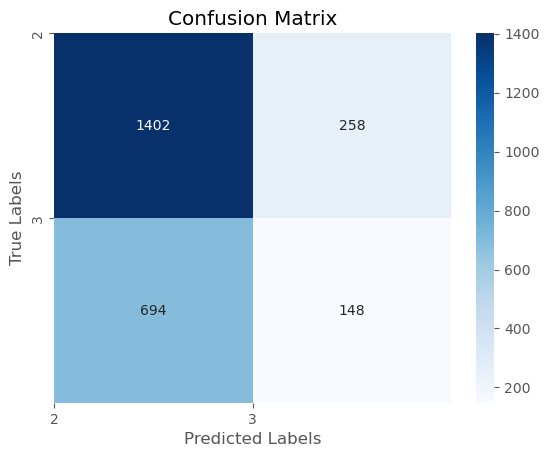

              precision    recall  f1-score   support

           2       0.67      0.84      0.75      1660
           3       0.36      0.18      0.24       842

    accuracy                           0.62      2502
   macro avg       0.52      0.51      0.49      2502
weighted avg       0.57      0.62      0.58      2502



In [428]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

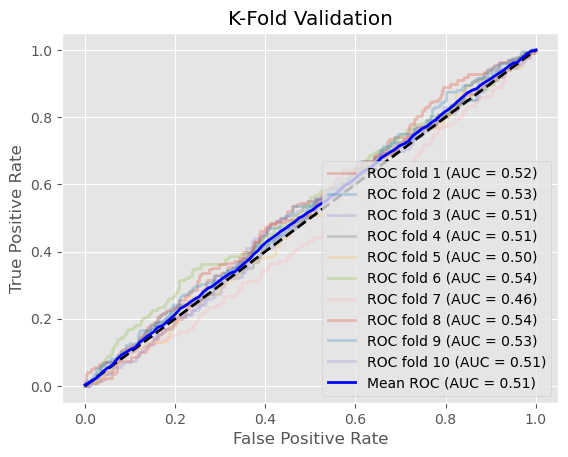

In [429]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 6 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Ground_Clay`, `Ground_Hard` para sets de 2 e 3

In [430]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [431]:
df_brasil = df_brasil.dropna()

In [432]:
df_brasil6 = df_brasil[df_brasil['NumberSets'] <= 3]

In [433]:
len(df_brasil)

8383

In [434]:
### split data in train and test set
dtf_train6, dtf_test6 = model_selection.train_test_split(df_brasil6, test_size=0.3)

## print info
print("train:", dtf_train6.shape)
print("test:", dtf_test6.shape)

train: (5835, 42)
test: (2502, 42)


- **Criação das variáveis dummy para a variável `Ground`**

In [435]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test6["Ground"], prefix="Ground",drop_first=True)
dtf_test6= pd.concat([dtf_test6, dummy2], axis=1)

## drop the original categorical column
dtf_test6 = dtf_test6.drop("Ground", axis=1)

In [436]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train6["Ground"], prefix="Ground",drop_first=True)
dtf_train6 = pd.concat([dtf_train6, dummy2], axis=1)

## drop the original categorical column
dtf_train6 = dtf_train6.drop("Ground", axis=1)

In [ ]:
# Conversão das variáveis dummy para o tipo categórico

In [437]:
columns_to_convert = ["Ground_Clay", "Ground_Hard"]


for column in columns_to_convert:
    dtf_train6[column] = dtf_train6[column].astype('category')

- **Seleção das variáveis para este bloco**

In [438]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Ground_Clay', 'Ground_Hard']

X_train = dtf_train6[X_names2].values

y_train = dtf_train6["NumberSets"].values
X_test = dtf_test6[X_names2].values
y_test = dtf_test6["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 e respetivas métricas de avaliação de performance**

In [439]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.61525278 0.61096829 0.59725793 0.61182519 0.60411311]
0.6078834618680377


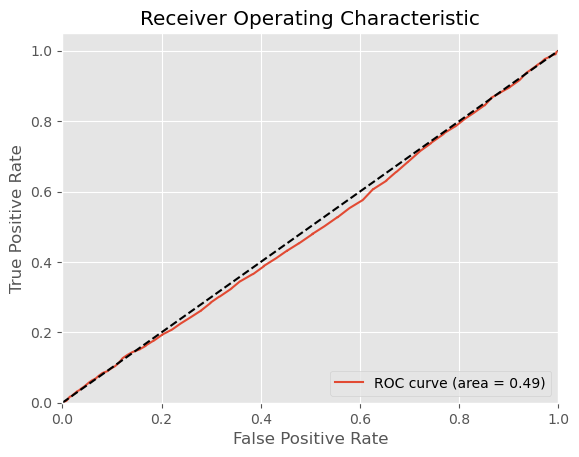

In [440]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt

import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 fold e as suas métricas de avaliação de performance**

In [441]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61130137 0.59417808 0.59417808 0.60787671 0.61130137 0.5780446
 0.60377358 0.60891938 0.56946827 0.60891938]
0.5987960830846589


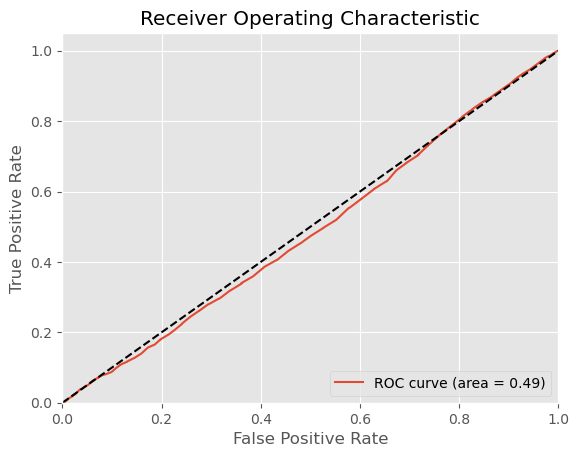

In [442]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [443]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 6 artists>

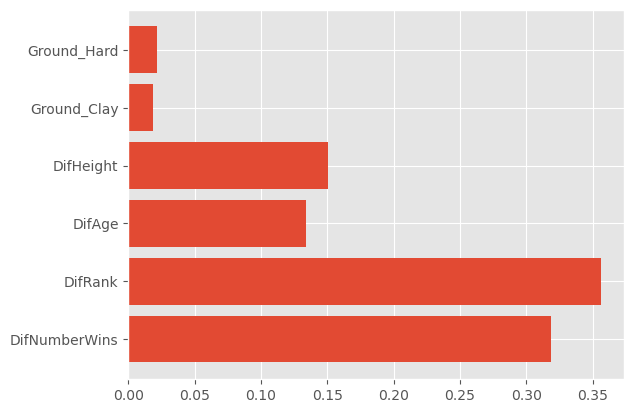

In [444]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Ground_Clay', 'Ground_Hard']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [445]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.67      0.63      0.65      1654
           3       0.36      0.40      0.38       848

    accuracy                           0.55      2502
   macro avg       0.51      0.52      0.51      2502
weighted avg       0.57      0.55      0.56      2502



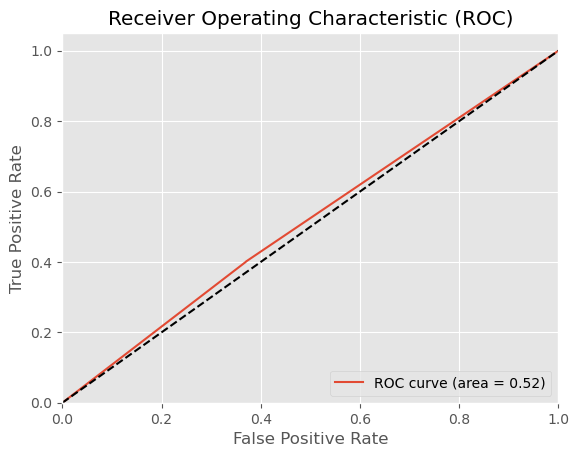

In [446]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações**

In [447]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 1250, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6584404455869752


- **Métricas de avaliação de performance do Gradient Boosting**

In [448]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [449]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.80      1654
           3       0.33      0.00      0.00       848

    accuracy                           0.66      2502
   macro avg       0.50      0.50      0.40      2502
weighted avg       0.55      0.66      0.53      2502



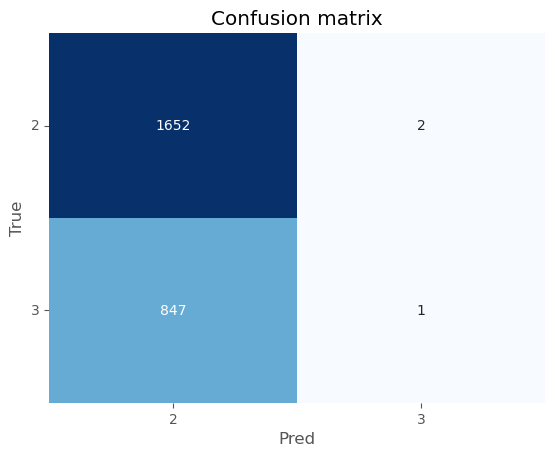

In [450]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [451]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.661064,0.998791,0.795569,1654.000000
3,0.333333,0.001179,0.002350,848.000000
accuracy,0.660671,0.660671,0.660671,0.660671
macro avg,0.497199,0.499985,0.398960,2502.000000
weighted avg,0.549987,0.660671,0.526725,2502.000000


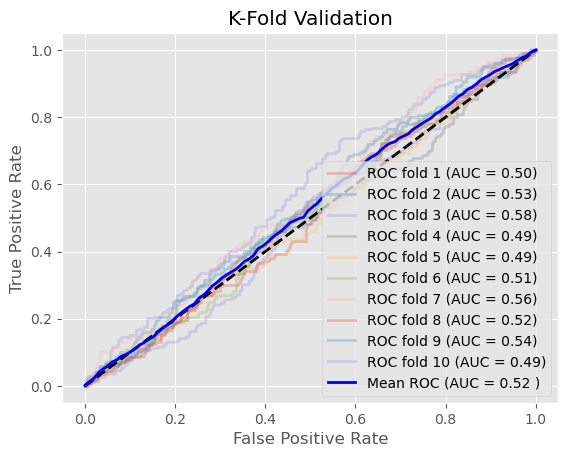

In [452]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e as suas métricas de avaliação de performance**

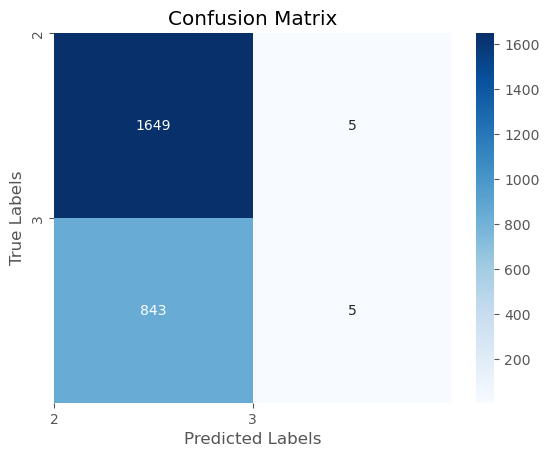

              precision    recall  f1-score   support

           2       0.66      1.00      0.80      1654
           3       0.50      0.01      0.01       848

    accuracy                           0.66      2502
   macro avg       0.58      0.50      0.40      2502
weighted avg       0.61      0.66      0.53      2502



In [453]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

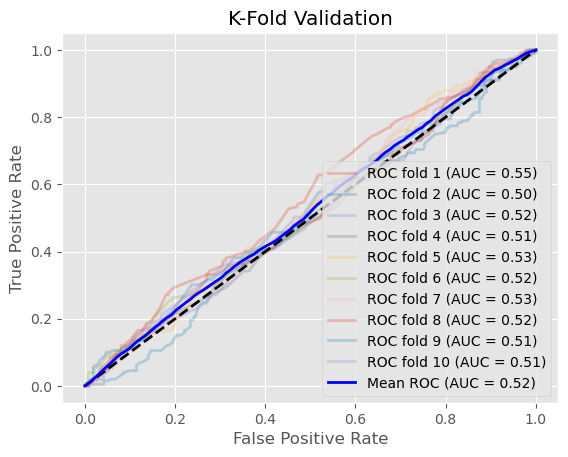

In [454]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e as suas métricas de avaliação de performance**

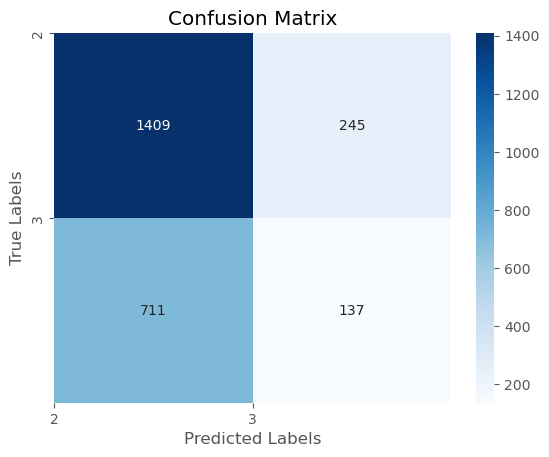

              precision    recall  f1-score   support

           2       0.66      0.85      0.75      1654
           3       0.36      0.16      0.22       848

    accuracy                           0.62      2502
   macro avg       0.51      0.51      0.48      2502
weighted avg       0.56      0.62      0.57      2502



In [455]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

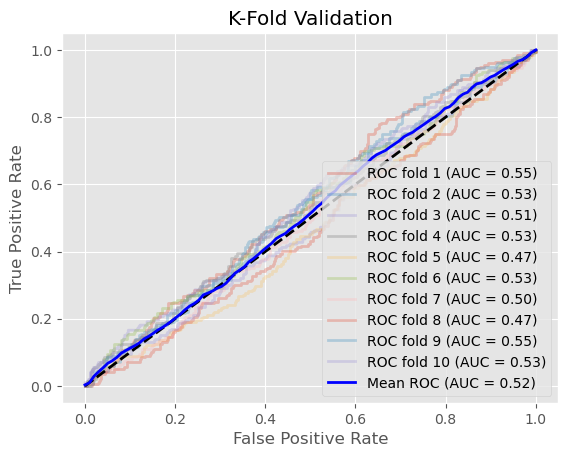

In [456]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 7 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Prize`, `Ground_Clay`, `Ground_Hard` com sets de 2 e 3

In [457]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [458]:
df_brasil = df_brasil.dropna()

In [459]:
df_brasil16 = df_brasil[df_brasil['NumberSets'] <= 3]

In [460]:
len(df_brasil)

8383

In [461]:
### split data in train and test set
dtf_train16, dtf_test16 = model_selection.train_test_split(df_brasil16, test_size=0.3)

## print info
print("train:", dtf_train16.shape)
print("test:", dtf_test16.shape)

train: (5835, 42)
test: (2502, 42)


In [462]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test16["Ground"], prefix="Ground",drop_first=True)
dtf_test16= pd.concat([dtf_test16, dummy2], axis=1)

## drop the original categorical column
dtf_test16 = dtf_test16.drop("Ground", axis=1)

In [463]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train16["Ground"], prefix="Ground",drop_first=True)
dtf_train16 = pd.concat([dtf_train16, dummy2], axis=1)

## drop the original categorical column
dtf_train16 = dtf_train16.drop("Ground", axis=1)

In [464]:
columns_to_convert = ["Ground_Clay", "Ground_Hard"]


for column in columns_to_convert:
    dtf_train16[column] = dtf_train16[column].astype('category')

- **Seleção de variáveis para este bloco**

In [465]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'Ground_Clay', 'Ground_Hard']

X_train = dtf_train16[X_names2].values

y_train = dtf_train16["NumberSets"].values
X_test = dtf_test16[X_names2].values
y_test = dtf_test16["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e métricas de avaliação de performance**

In [466]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.62467866 0.62210797 0.61353899 0.63581834 0.61953728]
0.6231362467866324


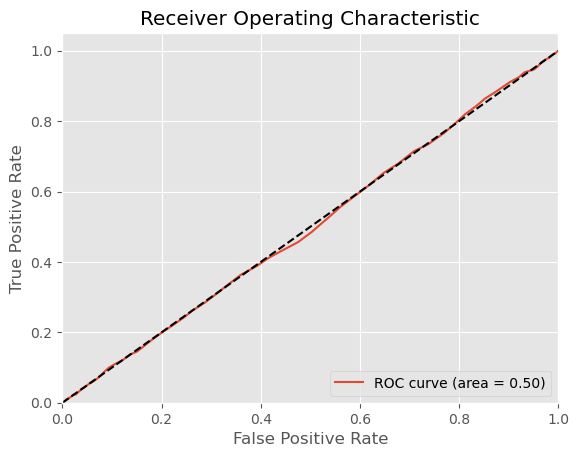

In [467]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e métricas de avaliação de performance**

In [468]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61130137 0.6369863  0.61815068 0.61643836 0.625      0.61578045
 0.62435678 0.62092624 0.60720412 0.6329331 ]
0.6209077398435114


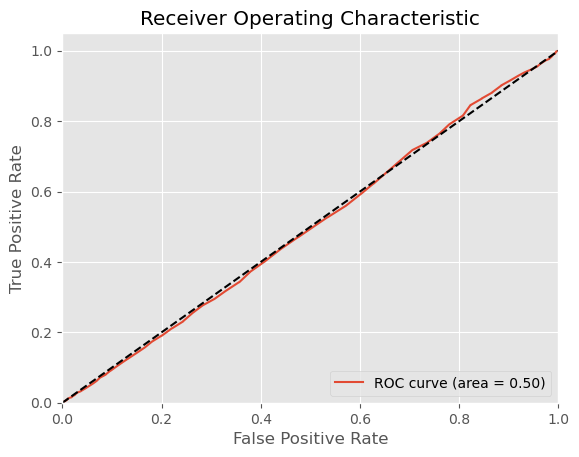

In [469]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [470]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 7 artists>

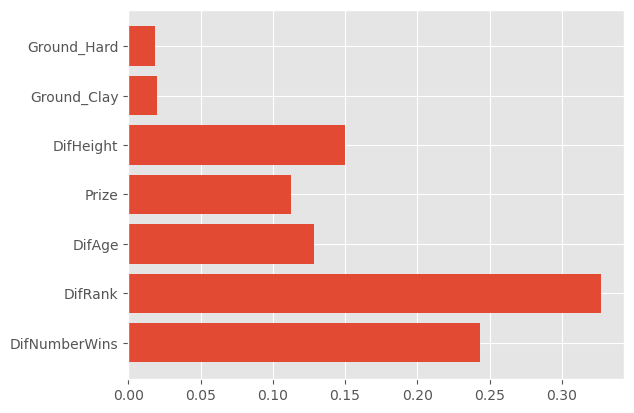

In [471]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize', 'DifHeight', 'Ground_Clay', 'Ground_Hard']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [472]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.66      0.66      1631
           3       0.36      0.36      0.36       871

    accuracy                           0.55      2502
   macro avg       0.51      0.51      0.51      2502
weighted avg       0.55      0.55      0.55      2502



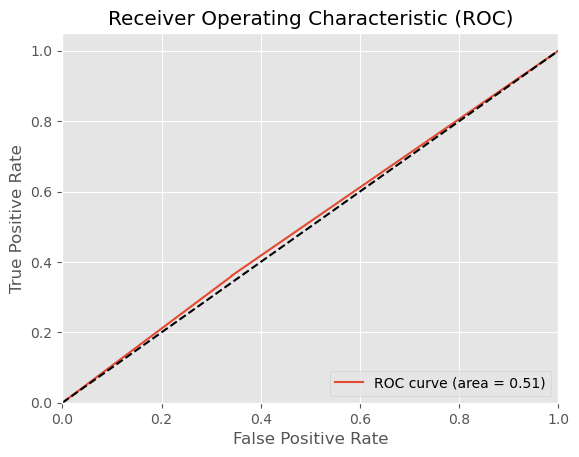

In [473]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações**

In [474]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 1, 'n_estimators': 100, 'min_samples_split': 100, 'min_samples_leaf': 7, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.1}
Best Model mean accuracy: 0.6627249357326479


- **Métricas de avaliação de performance do Gradient Boosting**

In [475]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [476]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.65
Precision (confidence when predicting a 1): 0.65
Detail:
              precision    recall  f1-score   support

           2       0.65      0.99      0.79      1631
           3       0.26      0.01      0.01       871

    accuracy                           0.65      2502
   macro avg       0.46      0.50      0.40      2502
weighted avg       0.52      0.65      0.52      2502



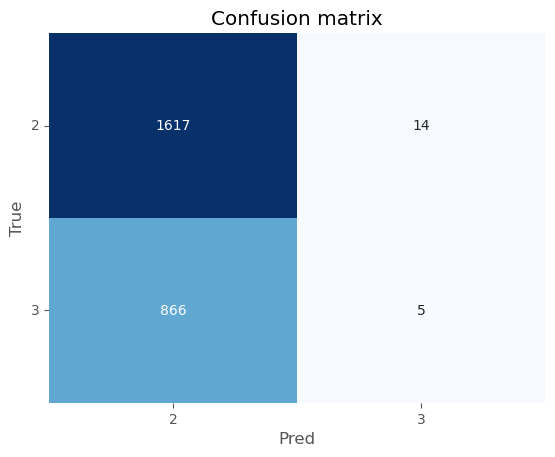

In [477]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [478]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.651228,0.991416,0.786096,1631.000000
3,0.263158,0.005741,0.011236,871.000000
accuracy,0.648281,0.648281,0.648281,0.648281
macro avg,0.457193,0.498578,0.398666,2502.000000
weighted avg,0.516133,0.648281,0.516351,2502.000000


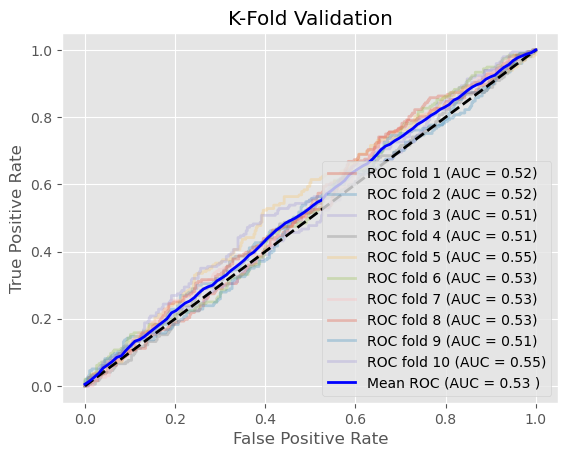

In [479]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e respetivas métricas de avaliação de performance**

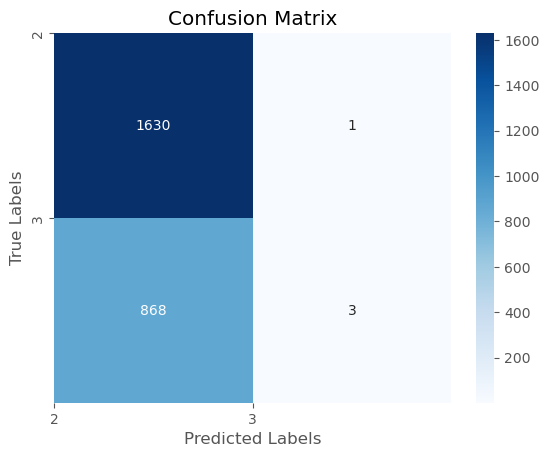

              precision    recall  f1-score   support

           2       0.65      1.00      0.79      1631
           3       0.75      0.00      0.01       871

    accuracy                           0.65      2502
   macro avg       0.70      0.50      0.40      2502
weighted avg       0.69      0.65      0.52      2502



In [480]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

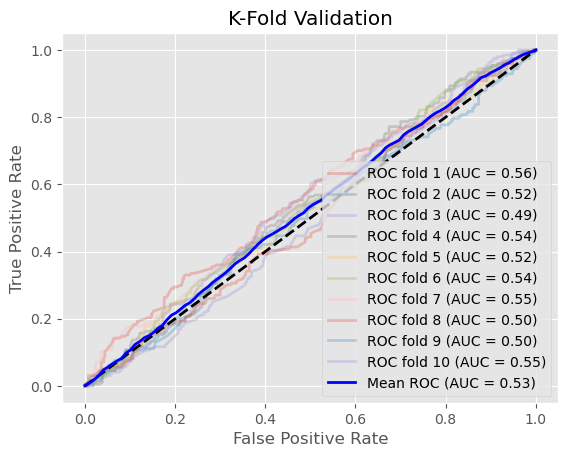

In [481]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e as suas métricas de avaliação de performance**

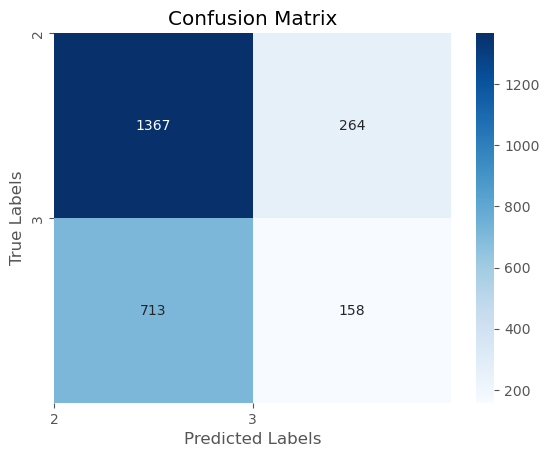

              precision    recall  f1-score   support

           2       0.66      0.84      0.74      1631
           3       0.37      0.18      0.24       871

    accuracy                           0.61      2502
   macro avg       0.52      0.51      0.49      2502
weighted avg       0.56      0.61      0.57      2502



In [482]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

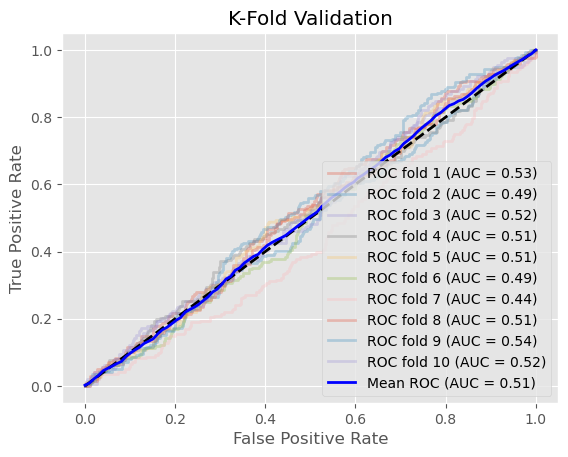

In [483]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 8 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `L_OR_R_Left-Handed`, `L_OR_R_Right-Handed`, 
 

####  `L_OR_R_Opponent_Left-Handed`, `L_OR_R_Opponent_Right-Handed`, `Ground_Clay`, `Ground_Hard` com 2 e 3 sets

In [510]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [511]:
df_brasil = df_brasil.dropna()

In [512]:
df_brasil7 = df_brasil[df_brasil['NumberSets'] <= 3]

In [513]:
len(df_brasil)

8383

In [514]:
### split data in train and test set
dtf_train7, dtf_test7 = model_selection.train_test_split(df_brasil7, test_size=0.3)

## print info
print("train:", dtf_train7.shape)
print("test:", dtf_test7.shape)

train: (5835, 42)
test: (2502, 42)


In [515]:
# dummy L_OR_R teste
dummy1 = pd.get_dummies(dtf_test7["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_test7= pd.concat([dtf_test7, dummy1], axis=1)
## drop the original categorical column
dtf_test7 = dtf_test7.drop("L_OR_R", axis=1)

In [516]:
# dummy L_OR_R_Opponent teste
dummy1_b = pd.get_dummies(dtf_test7["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_test7= pd.concat([dtf_test7, dummy1_b], axis=1)

## drop the original categorical column
dtf_test7 = dtf_test7.drop("L_OR_R_Opponent", axis=1)

In [517]:
# dummy L_OR_R treino
dummy1 = pd.get_dummies(dtf_train7["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_train7 = pd.concat([dtf_train7, dummy1], axis=1)

## drop the original categorical column
dtf_train7 = dtf_train7.drop("L_OR_R", axis=1)

In [518]:
# dummy L_OR_R_Opponent teste
dummy1_b = pd.get_dummies(dtf_train7["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_train7 = pd.concat([dtf_train7, dummy1_b], axis=1)

## drop the original categorical column
dtf_train7 = dtf_train7.drop("L_OR_R_Opponent", axis=1)

In [519]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test7["Ground"], prefix="Ground",drop_first=True)
dtf_test7= pd.concat([dtf_test7, dummy2], axis=1)

## drop the original categorical column
dtf_test7 = dtf_test7.drop("Ground", axis=1)

In [520]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train7["Ground"], prefix="Ground",drop_first=True)
dtf_train7 = pd.concat([dtf_train7, dummy2], axis=1)

## drop the original categorical column
dtf_train7 = dtf_train7.drop("Ground", axis=1)

In [521]:
columns_to_convert = ["L_OR_R_Left-Handed","L_OR_R_Right-Handed","L_OR_R_Opponent_Right-Handed",
                      "L_OR_R_Opponent_Left-Handed","Ground_Clay", "Ground_Hard"]


for column in columns_to_convert:
    dtf_train7[column] = dtf_train7[column].astype('category')

- **Seleção do conjunto de variáveis para este bloco**

In [522]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed', 'Ground_Clay', 'Ground_Hard']

X_train = dtf_train7[X_names2].values

y_train = dtf_train7["NumberSets"].values
X_test = dtf_test7[X_names2].values
y_test = dtf_test7["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e métricas de avaliação de performance**

In [523]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.61268209 0.61525278 0.62039417 0.59811482 0.6083976 ]
0.610968294772922


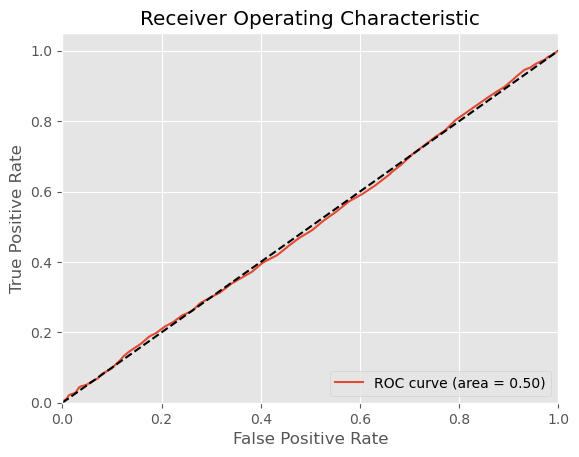

In [524]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 5 folds e métricas de avaliação de performance**

In [525]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.60787671 0.60787671 0.61130137 0.63013699 0.625      0.59519726
 0.62435678 0.61063465 0.62950257 0.62607204]
0.6167955074132381


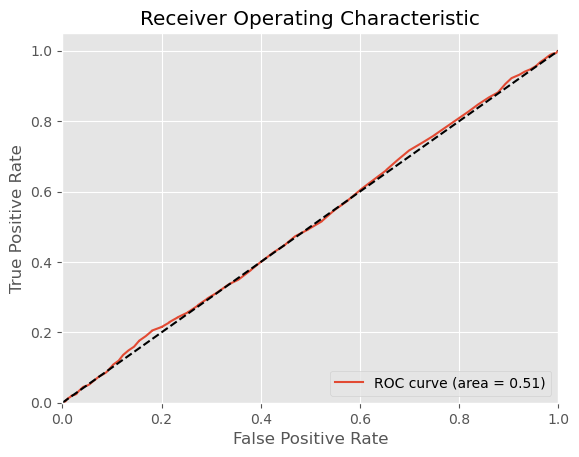

In [526]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [527]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 10 artists>

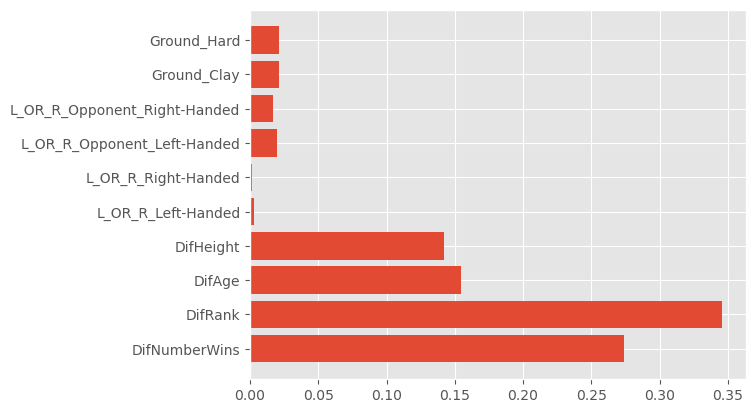

In [528]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed', 'Ground_Clay', 'Ground_Hard']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [529]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.67      0.65      0.66      1656
           3       0.35      0.37      0.36       846

    accuracy                           0.55      2502
   macro avg       0.51      0.51      0.51      2502
weighted avg       0.56      0.55      0.55      2502



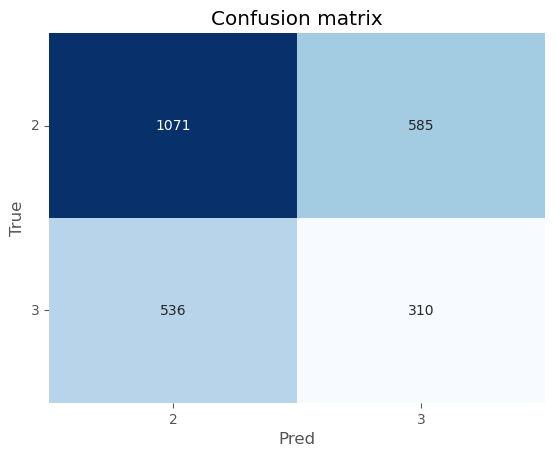

In [530]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, y_pred, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

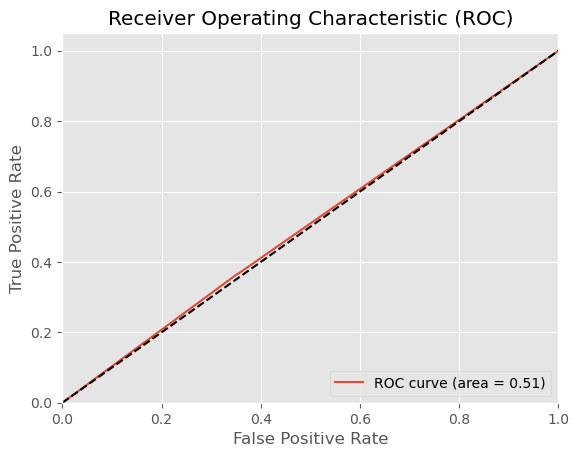

In [531]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações**

In [532]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy",random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 1, 'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 3, 'max_depth': 5, 'learning_rate': 0.005}
Best Model mean accuracy: 0.658783204798629


- **Métricas de avaliação de performance para o Gradient Boosting**

In [533]:
## we use the model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [534]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.80      1656
           3       0.29      0.00      0.00       846

    accuracy                           0.66      2502
   macro avg       0.47      0.50      0.40      2502
weighted avg       0.53      0.66      0.53      2502



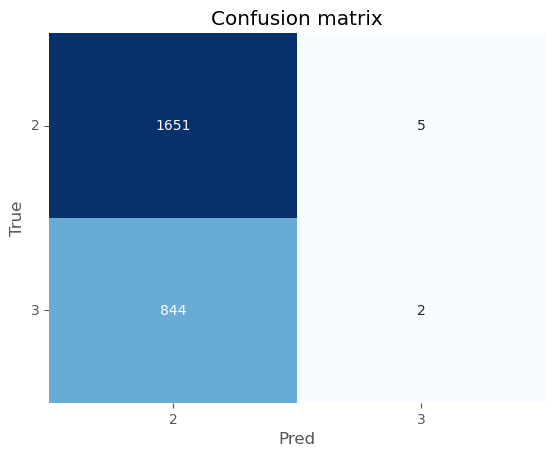

In [535]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [536]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.661723,0.996981,0.795471,1656.000000
3,0.285714,0.002364,0.004689,846.000000
accuracy,0.660671,0.660671,0.660671,0.660671
macro avg,0.473719,0.499672,0.400080,2502.000000
weighted avg,0.534584,0.660671,0.528084,2502.000000


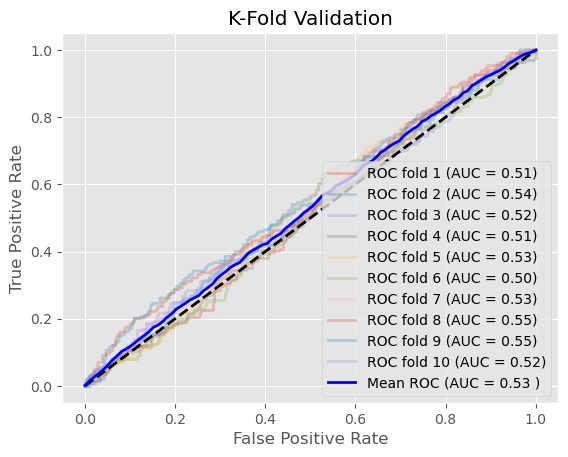

In [537]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e as suas métricas de avaliação de performance**

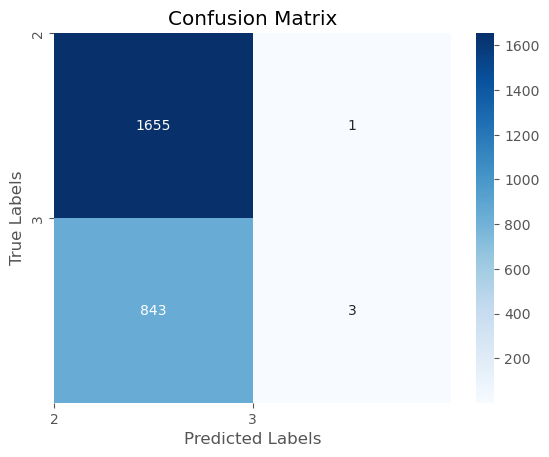

              precision    recall  f1-score   support

           2       0.66      1.00      0.80      1656
           3       0.75      0.00      0.01       846

    accuracy                           0.66      2502
   macro avg       0.71      0.50      0.40      2502
weighted avg       0.69      0.66      0.53      2502



In [538]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

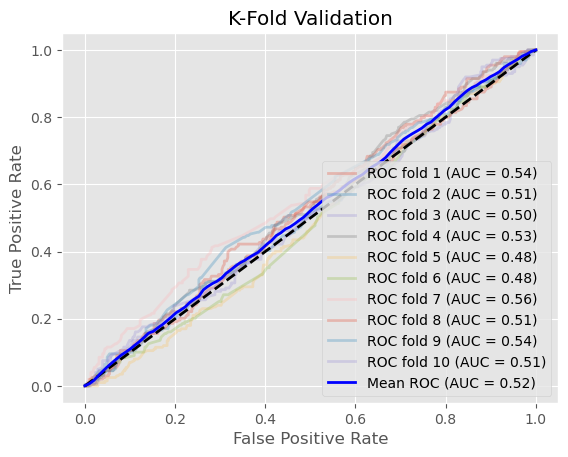

In [539]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e respetivas medidas de avaliação de performance**

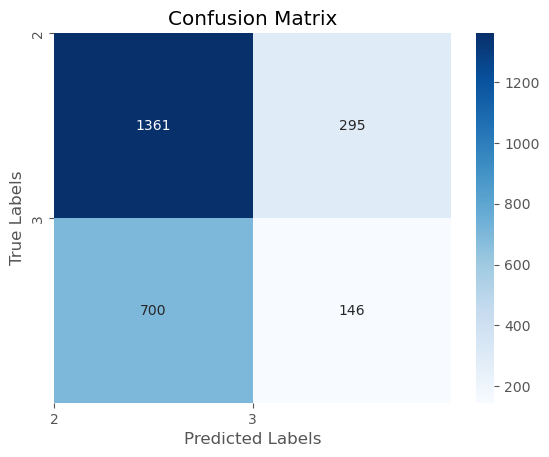

              precision    recall  f1-score   support

           2       0.66      0.82      0.73      1656
           3       0.33      0.17      0.23       846

    accuracy                           0.60      2502
   macro avg       0.50      0.50      0.48      2502
weighted avg       0.55      0.60      0.56      2502



In [540]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

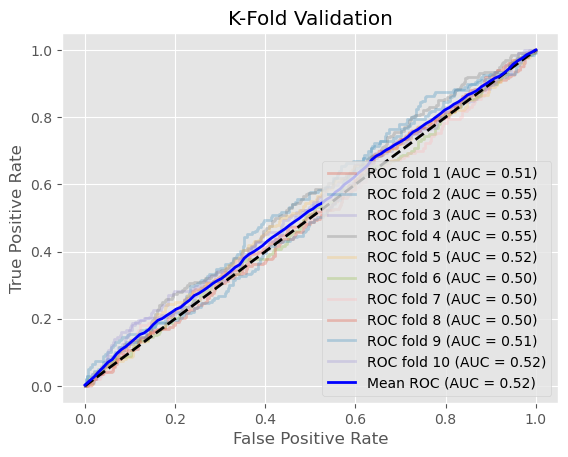

In [541]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 9 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Prize`, `L_OR_R_Left-Handed`, `L_OR_R_Right-Handed`,

#### `L_OR_R_Opponent_Left-Handed`, `L_OR_R_Opponent_Right-Handed`, `Ground_Clay`, `Ground_Hard` com sets de 2 e 3

In [542]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [543]:
df_brasil = df_brasil.dropna()

In [544]:
df_brasil17 = df_brasil[df_brasil['NumberSets'] <= 3]

In [545]:
len(df_brasil)

8383

In [546]:
### split data in train and test set
dtf_train17, dtf_test17 = model_selection.train_test_split(df_brasil17, test_size=0.3)

## print info
print("train:", dtf_train17.shape)
print("test:", dtf_test17.shape)

train: (5835, 42)
test: (2502, 42)


In [547]:
# dummy L_OR_R teste
dummy1 = pd.get_dummies(dtf_test17["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_test17= pd.concat([dtf_test17, dummy1], axis=1)

## drop the original categorical column
dtf_test17 = dtf_test17.drop("L_OR_R", axis=1)

In [548]:
# dummy L_OR_R_Opponent teste
dummy1_b = pd.get_dummies(dtf_test17["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_test17= pd.concat([dtf_test17, dummy1_b], axis=1)

## drop the original categorical column
dtf_test17 = dtf_test17.drop("L_OR_R_Opponent", axis=1)

In [549]:
# dummy L_OR_R treino
dummy1 = pd.get_dummies(dtf_train17["L_OR_R"], prefix="L_OR_R",drop_first=True)
dtf_train17 = pd.concat([dtf_train17, dummy1], axis=1)

## drop the original categorical column
dtf_train17 = dtf_train17.drop("L_OR_R", axis=1)

In [550]:
# dummy L_OR_R_Opponent treino
dummy1_b = pd.get_dummies(dtf_train17["L_OR_R_Opponent"], prefix="L_OR_R_Opponent",drop_first=True)
dtf_train17 = pd.concat([dtf_train17, dummy1_b], axis=1)

## drop the original categorical column
dtf_train17 = dtf_train17.drop("L_OR_R_Opponent", axis=1)

In [551]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test17["Ground"], prefix="Ground",drop_first=True)
dtf_test17= pd.concat([dtf_test17, dummy2], axis=1)

## drop the original categorical column
dtf_test17 = dtf_test17.drop("Ground", axis=1)

In [552]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train17["Ground"], prefix="Ground",drop_first=True)
dtf_train17 = pd.concat([dtf_train17, dummy2], axis=1)

## drop the original categorical column
dtf_train17 = dtf_train17.drop("Ground", axis=1)

In [553]:
columns_to_convert = ["L_OR_R_Left-Handed","L_OR_R_Right-Handed","L_OR_R_Opponent_Right-Handed","L_OR_R_Opponent_Left-Handed","Ground_Clay", "Ground_Hard"]


for column in columns_to_convert:
    dtf_train17[column] = dtf_train17[column].astype('category')

- **Seleção das variáveis que irão ser utilizadas neste bloco**

In [554]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed', 'Ground_Clay', 'Ground_Hard']

X_train = dtf_train17[X_names2].values

y_train = dtf_train17["NumberSets"].values
X_test = dtf_test17[X_names2].values
y_test = dtf_test17["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e respetivas métricas de avaliação**

In [555]:
### random forest - 5folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.61353899 0.63153385 0.61439589 0.62810626 0.61782348]
0.6210796915167095


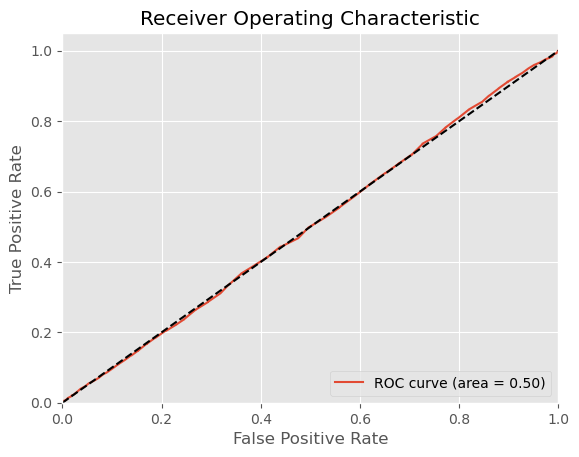

In [556]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e respetivas métricas de avaliação**

In [557]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.625      0.61986301 0.64041096 0.64041096 0.60787671 0.61234991
 0.62778731 0.62264151 0.61749571 0.62950257]
0.6243338659273009


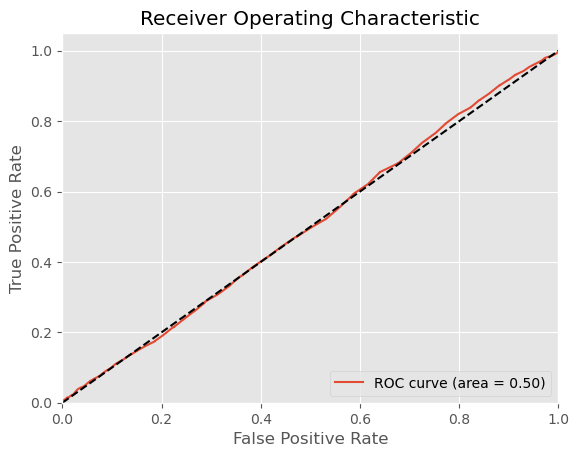

In [558]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [559]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 11 artists>

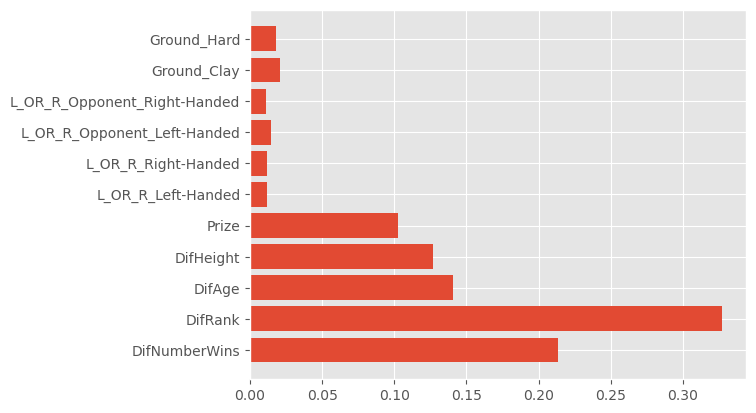

In [560]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'L_OR_R_Left-Handed', 'L_OR_R_Right-Handed', 
           'L_OR_R_Opponent_Left-Handed', 'L_OR_R_Opponent_Right-Handed', 'Ground_Clay', 'Ground_Hard']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance da Decision Tree**

In [561]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.66      0.66      1624
           3       0.37      0.37      0.37       878

    accuracy                           0.56      2502
   macro avg       0.51      0.51      0.51      2502
weighted avg       0.56      0.56      0.56      2502



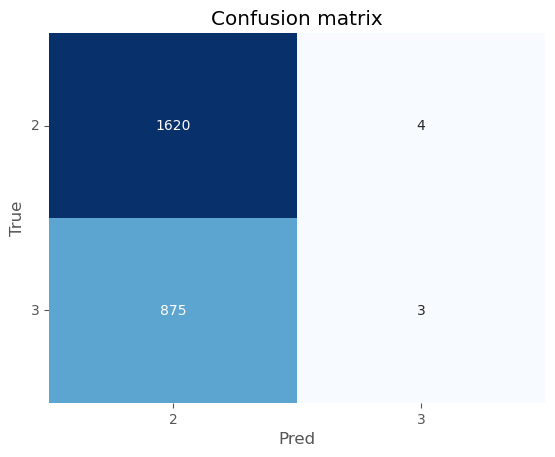

In [562]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

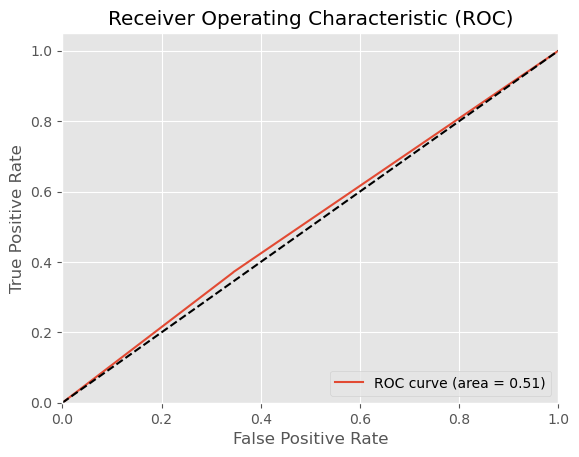

In [563]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações e métricas de avaliação de performance**

In [564]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.75, 'n_estimators': 1500, 'min_samples_split': 100, 'min_samples_leaf': 9, 'max_features': 3, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6647814910025708


In [565]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [566]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.65
Precision (confidence when predicting a 1): 0.65
Detail:
              precision    recall  f1-score   support

           2       0.65      1.00      0.79      1624
           3       0.56      0.01      0.02       878

    accuracy                           0.65      2502
   macro avg       0.60      0.50      0.40      2502
weighted avg       0.62      0.65      0.52      2502



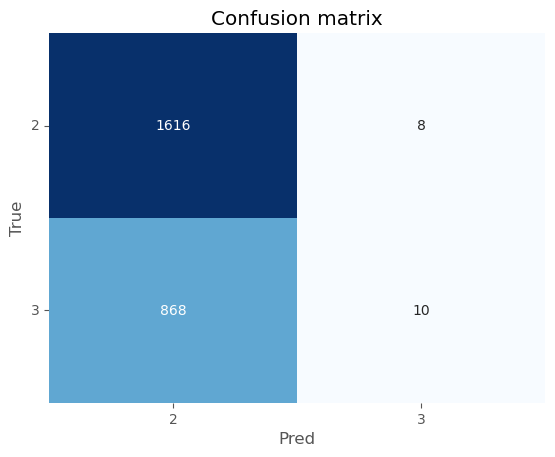

In [567]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [568]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.650564,0.995074,0.786758,1624.00000
3,0.555556,0.011390,0.022321,878.00000
accuracy,0.649880,0.649880,0.649880,0.64988
macro avg,0.603060,0.503232,0.404539,2502.00000
weighted avg,0.617223,0.649880,0.518502,2502.00000


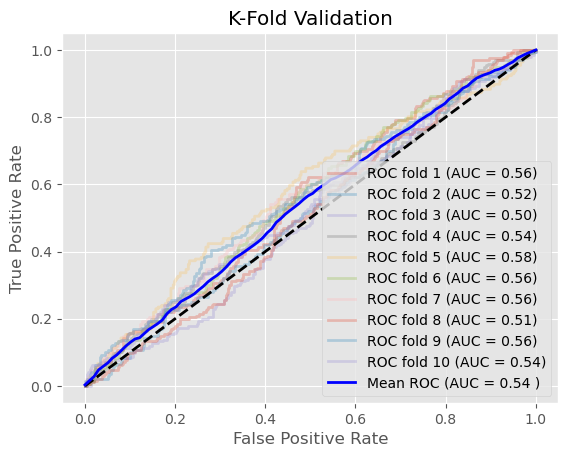

In [569]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e respetivas métricas de avaliação de performance**

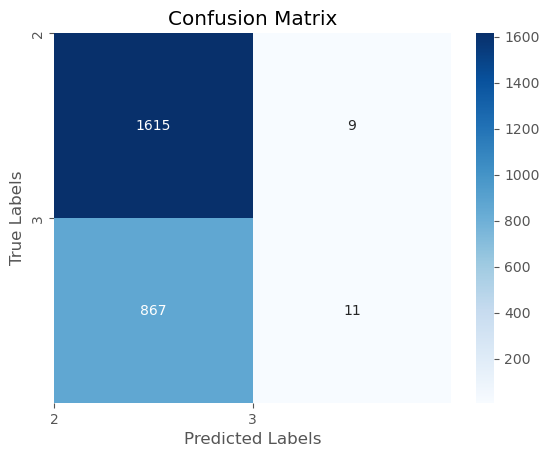

              precision    recall  f1-score   support

           2       0.65      0.99      0.79      1624
           3       0.55      0.01      0.02       878

    accuracy                           0.65      2502
   macro avg       0.60      0.50      0.41      2502
weighted avg       0.62      0.65      0.52      2502



In [570]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

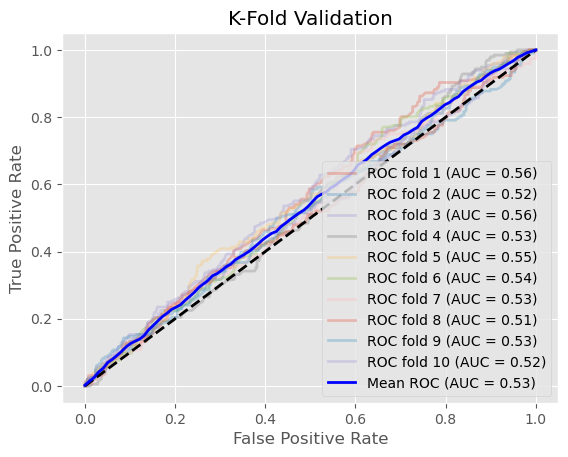

In [571]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e avaliação de performance**

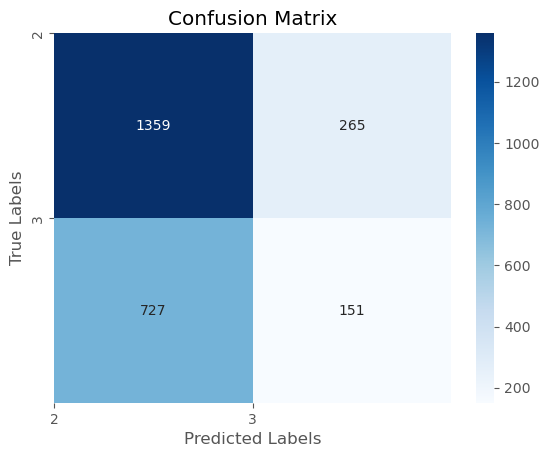

              precision    recall  f1-score   support

           2       0.65      0.84      0.73      1624
           3       0.36      0.17      0.23       878

    accuracy                           0.60      2502
   macro avg       0.51      0.50      0.48      2502
weighted avg       0.55      0.60      0.56      2502



In [572]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

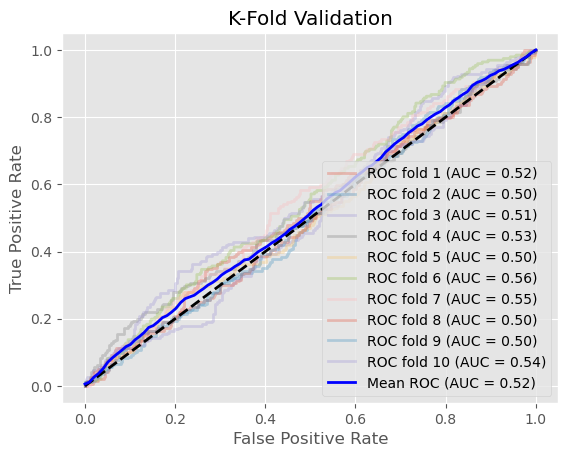

In [573]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 10 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Prize`, `DifHands` para 2 e 3 sets

In [574]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [575]:
df_brasil = df_brasil.dropna()

In [576]:
df_brasil9 = df_brasil[df_brasil['NumberSets'] <= 3]

In [577]:
len(df_brasil)

8383

In [578]:
### split data in train and test set
dtf_train9, dtf_test9 = model_selection.train_test_split(df_brasil9, test_size=0.3)

## print info
print("train:", dtf_train9.shape)
print("test:", dtf_test9.shape)

train: (5835, 42)
test: (2502, 42)


In [579]:
# dummy DifHands teste
dtf_test9['DifHands'] = (dtf_test9['L_OR_R'] != dtf_test9['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_test9['DifHands'], drop_first=True)


dtf_test9 = pd.concat([dtf_test9, dummy1], axis=1)


dtf_test9 = dtf_test9.drop("L_OR_R", axis=1)
dtf_test9 = dtf_test9.drop("L_OR_R_Opponent", axis=1)

In [580]:
# dummy DifHands treino
dtf_train9['DifHands'] = (dtf_train9['L_OR_R'] != dtf_train9['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_train9['DifHands'], drop_first=True)


dtf_train9 = pd.concat([dtf_train9, dummy1], axis=1)


dtf_train9 = dtf_train9.drop("L_OR_R", axis=1)
dtf_train9 = dtf_train9.drop("L_OR_R_Opponent", axis=1)

In [581]:
columns_to_convert = ["DifHands"]


for column in columns_to_convert:
    dtf_train9[column] = dtf_train9[column].astype('category')

- **Seleção do conjunto de variáveis para este bloco**

In [582]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize',  'DifHands']

X_train = dtf_train9[X_names2].values

y_train = dtf_train9["NumberSets"].values
X_test = dtf_test9[X_names2].values
y_test = dtf_test9["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e métricas de avaliação de performance**

In [583]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.60154242 0.60068552 0.61953728 0.6083976  0.6075407 ]
0.6075407026563839


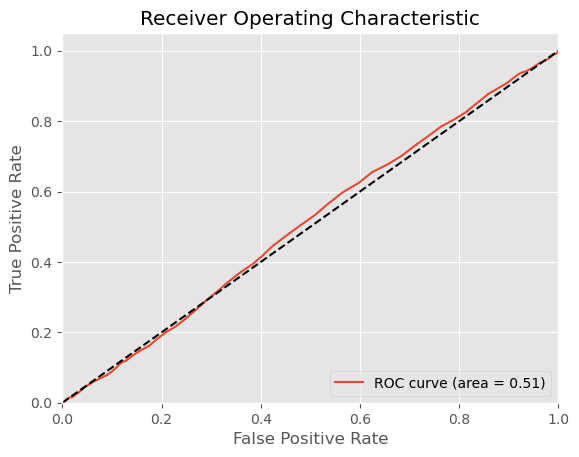

In [584]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e métricas de avaliação de performance**

In [585]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.59760274 0.63013699 0.63013699 0.60616438 0.62157534 0.61578045
 0.59691252 0.59691252 0.59862779 0.59862779]
0.6092477501821001


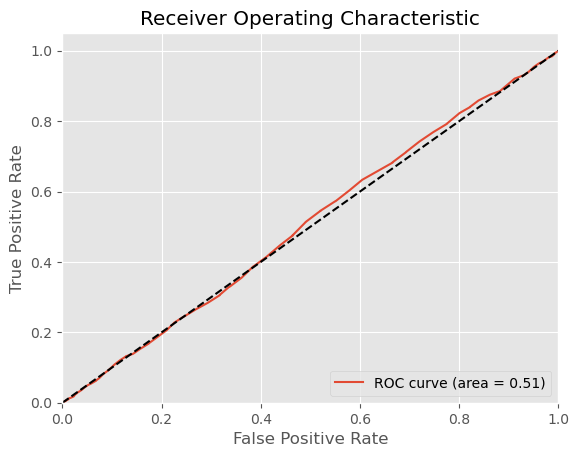

In [586]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [587]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 6 artists>

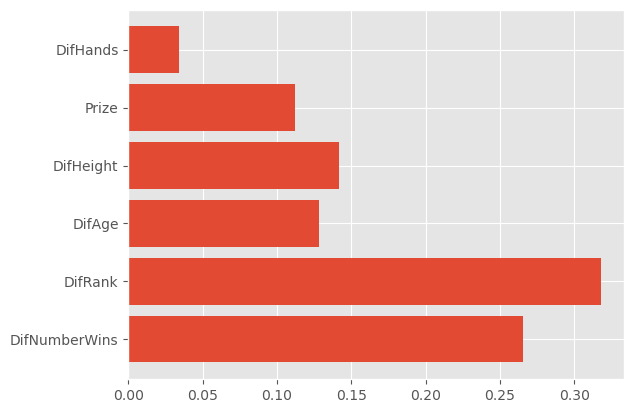

In [588]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'DifHands']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance da Decision Tree**

In [589]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.65      0.62      0.64      1680
           3       0.30      0.33      0.31       822

    accuracy                           0.53      2502
   macro avg       0.48      0.48      0.48      2502
weighted avg       0.54      0.53      0.53      2502



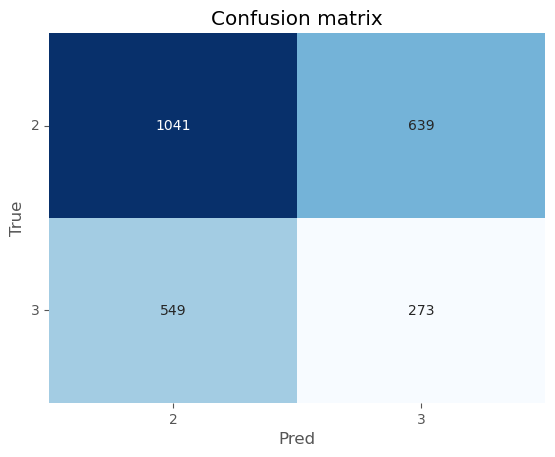

In [590]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, y_pred, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

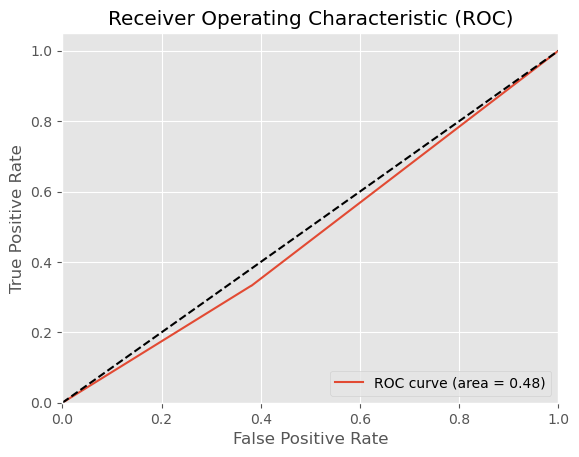

In [591]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações e métricas de avaliação de performance**

In [592]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 6, 'learning_rate': 0.001}
Best Model mean accuracy: 0.6544987146529563


In [593]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [594]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.67
Precision (confidence when predicting a 1): 0.67
Detail:
              precision    recall  f1-score   support

           2       0.67      1.00      0.80      1680
           3       0.00      0.00      0.00       822

    accuracy                           0.67      2502
   macro avg       0.34      0.50      0.40      2502
weighted avg       0.45      0.67      0.54      2502



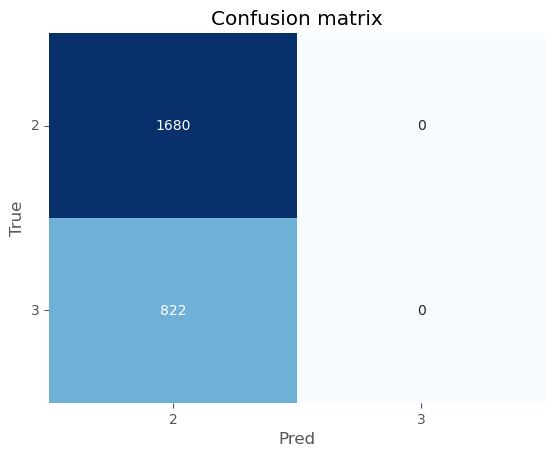

In [595]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [596]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.671463,1.000000,0.803443,1680.000000
3,0.000000,0.000000,0.000000,822.000000
accuracy,0.671463,0.671463,0.671463,0.671463
macro avg,0.335731,0.500000,0.401722,2502.000000
weighted avg,0.450862,0.671463,0.539482,2502.000000


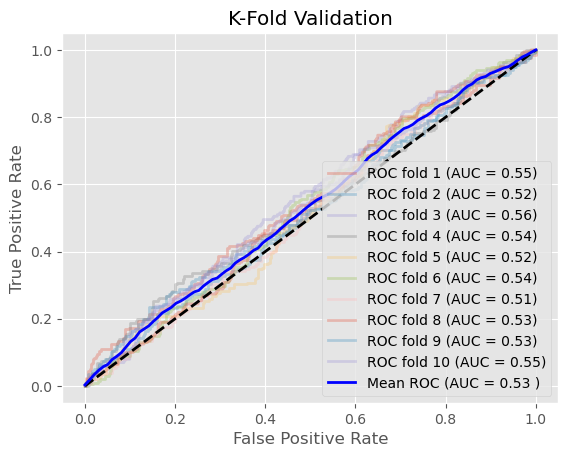

In [597]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e métricas de avaliação de performance**

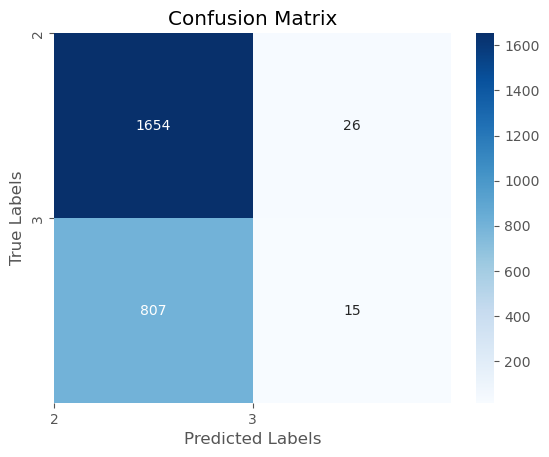

              precision    recall  f1-score   support

           2       0.67      0.98      0.80      1680
           3       0.37      0.02      0.03       822

    accuracy                           0.67      2502
   macro avg       0.52      0.50      0.42      2502
weighted avg       0.57      0.67      0.55      2502



In [598]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

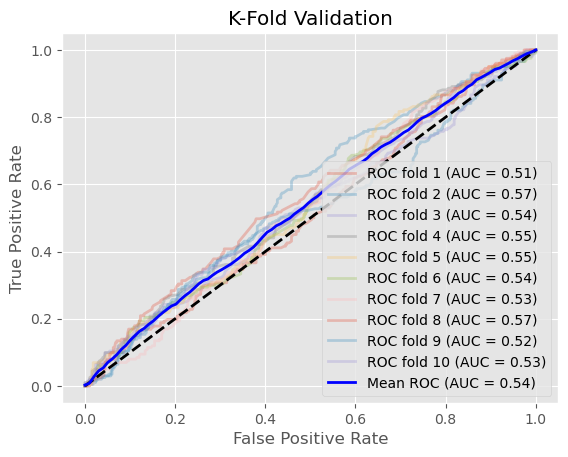

In [599]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e métricas da avaliação da sua performance**

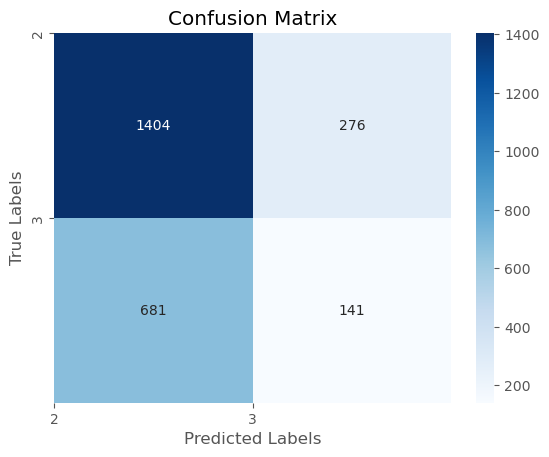

              precision    recall  f1-score   support

           2       0.67      0.84      0.75      1680
           3       0.34      0.17      0.23       822

    accuracy                           0.62      2502
   macro avg       0.51      0.50      0.49      2502
weighted avg       0.56      0.62      0.58      2502



In [600]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

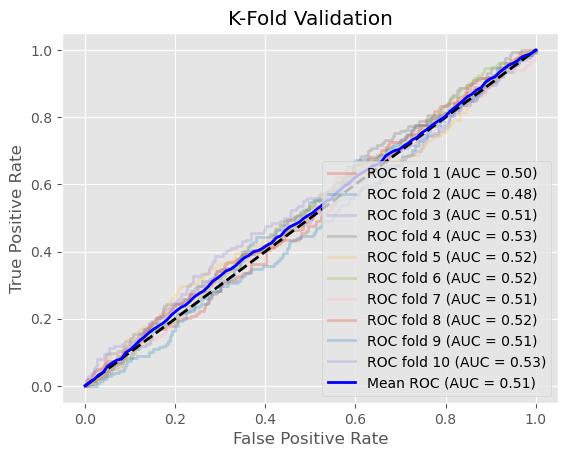

In [601]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 11 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `DifHeight`, `Prize`, `DifHands`, `Ground_Clay, Ground_Hard para 2 e 3 sets

In [602]:
df_brasil = df_brasil[df_brasil['NumberSets']!=1]

In [603]:
df_brasil = df_brasil.dropna()

In [604]:
df_brasil19 = df_brasil[df_brasil['NumberSets'] <= 3]

In [605]:
len(df_brasil)

8383

In [606]:
### split data in train and test set
dtf_train19, dtf_test19 = model_selection.train_test_split(df_brasil19, test_size=0.3)

## print info
print("train:", dtf_train19.shape)
print("test:", dtf_test19.shape)

train: (5835, 42)
test: (2502, 42)


In [607]:
# dummy DifHands teste
dtf_test19['DifHands'] = (dtf_test19['L_OR_R'] != dtf_test19['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_test19['DifHands'], drop_first=True)


dtf_test19 = pd.concat([dtf_test19, dummy1], axis=1)


dtf_test19 = dtf_test19.drop("L_OR_R", axis=1)
dtf_test19 = dtf_test19.drop("L_OR_R_Opponent", axis=1)

In [608]:
# dummy DifHands treino
dtf_train19['DifHands'] = (dtf_train19['L_OR_R'] != dtf_train19['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_train19['DifHands'], drop_first=True)


dtf_train19 = pd.concat([dtf_train19, dummy1], axis=1)


dtf_train19 = dtf_train19.drop("L_OR_R", axis=1)
dtf_train19 = dtf_train19.drop("L_OR_R_Opponent", axis=1)

In [609]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train19["Ground"], prefix="Ground",drop_first=True)
dtf_train19 = pd.concat([dtf_train19, dummy2], axis=1)

## drop the original categorical column
dtf_train19 = dtf_train19.drop("Ground", axis=1)

In [610]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test19["Ground"], prefix="Ground",drop_first=True)
dtf_test19= pd.concat([dtf_test19, dummy2], axis=1)

## drop the original categorical column
dtf_test19 = dtf_test19.drop("Ground", axis=1)

In [611]:
columns_to_convert = ["DifHands", 'Ground_Clay', 'Ground_Hard']


for column in columns_to_convert:
    dtf_train19[column] = dtf_train19[column].astype('category')

- **Seleção de variáveis para este bloco**

In [612]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize',  'DifHands', 'Ground_Clay', 'Ground_Hard']

X_train = dtf_train19[X_names2].values

y_train = dtf_train19["NumberSets"].values
X_test = dtf_test19[X_names2].values
y_test = dtf_test19["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e respetivas métricas de avaliação**

In [613]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.61525278 0.61953728 0.61353899 0.60411311 0.62125107]
0.614738646101114


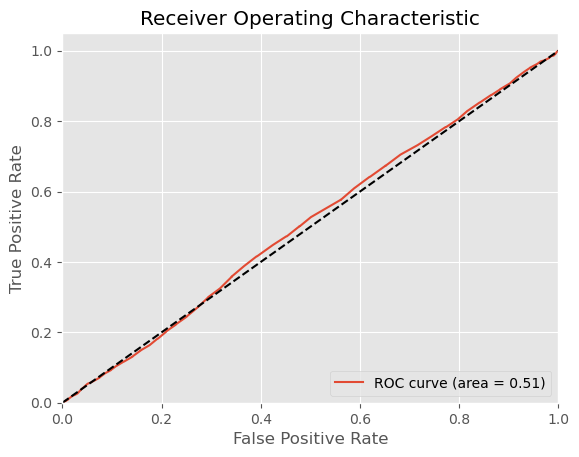

In [614]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e respetivas métricas de avaliação**

In [615]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.59931507 0.6010274  0.60445205 0.59931507 0.59931507 0.61234991
 0.60891938 0.59348199 0.62950257 0.60891938]
0.6056597899386733


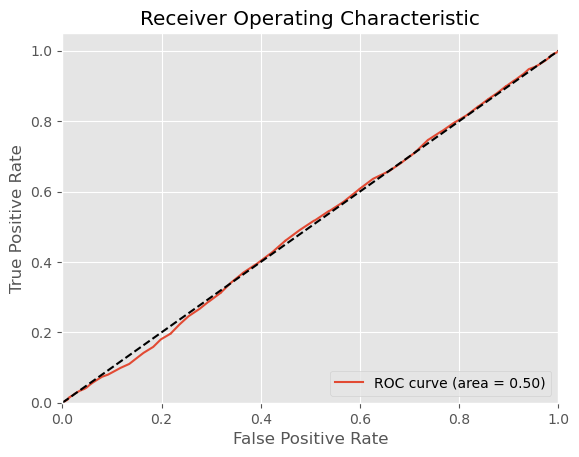

In [616]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [617]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 8 artists>

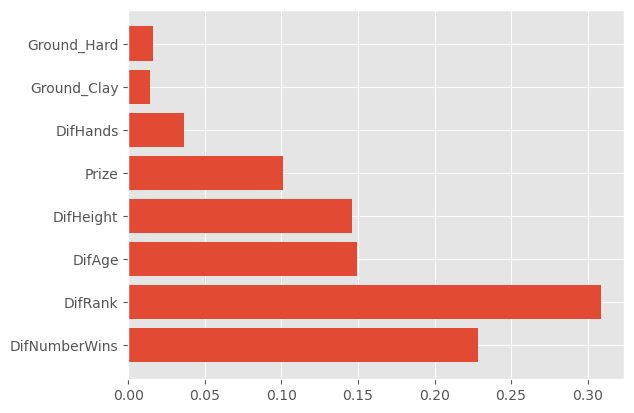

In [618]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifHeight', 'Prize', 'DifHands', 'Ground_Clay', 'Ground_Hard']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [619]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.63      0.64      1670
           3       0.32      0.36      0.34       832

    accuracy                           0.54      2502
   macro avg       0.49      0.49      0.49      2502
weighted avg       0.55      0.54      0.54      2502



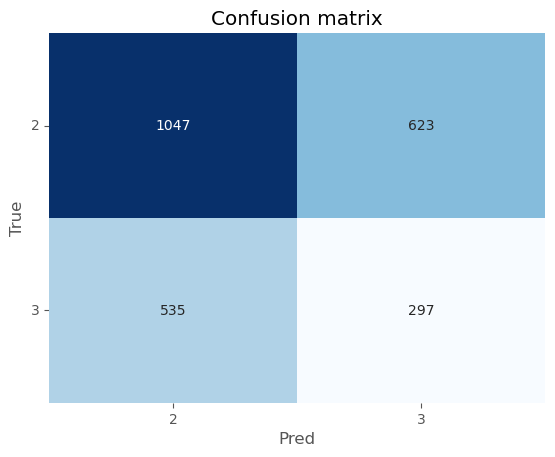

In [620]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, y_pred, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

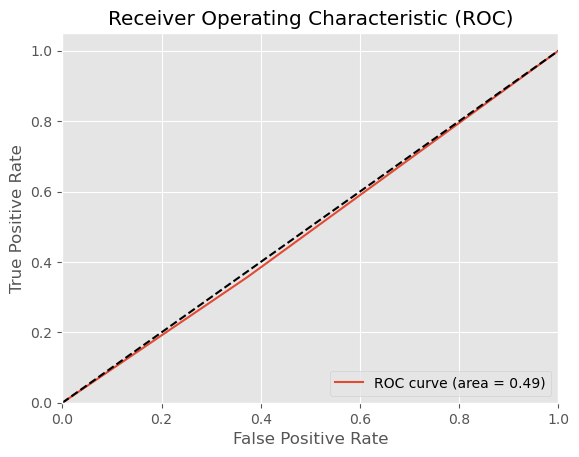

In [621]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações e métricas de avaliação de performance**

In [622]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3,4],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.85, 'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 2, 'max_depth': 6, 'learning_rate': 0.001}
Best Model mean accuracy: 0.6562125107112253


In [623]:
## we use te model selected by the random search "model"

## train the model
model.fit(X_train, y_train)

## test the model
predicted_prob = model.predict_proba(X_test)[:,1]
predicted = model.predict(X_test)

In [624]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.67
Precision (confidence when predicting a 1): 0.67
Detail:
              precision    recall  f1-score   support

           2       0.67      1.00      0.80      1670
           3       0.00      0.00      0.00       832

    accuracy                           0.67      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.45      0.67      0.53      2502



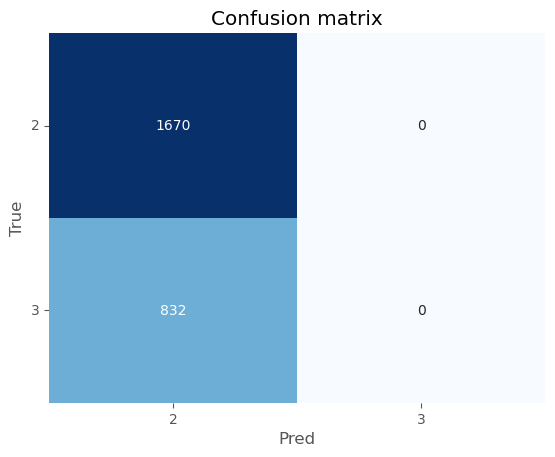

In [625]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [626]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.667466,1.000000,0.800575,1670.000000
3,0.000000,0.000000,0.000000,832.000000
accuracy,0.667466,0.667466,0.667466,0.667466
macro avg,0.333733,0.500000,0.400288,2502.000000
weighted avg,0.445511,0.667466,0.534357,2502.000000


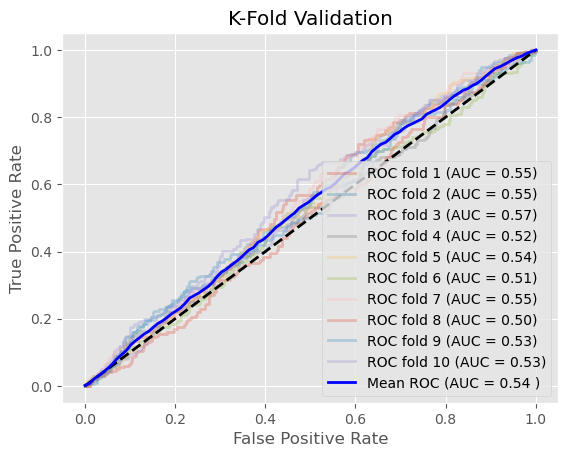

In [627]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')   
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e métricas de avaliação de performance**

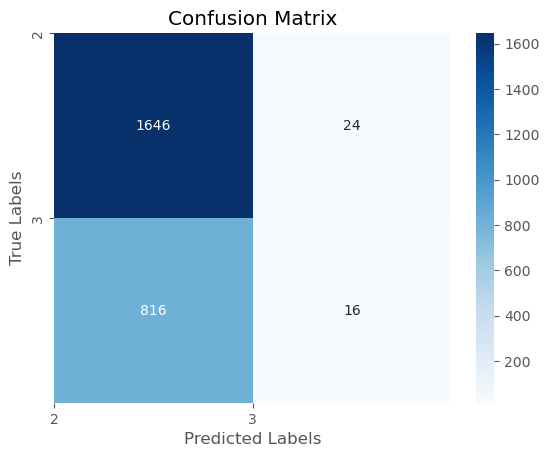

              precision    recall  f1-score   support

           2       0.67      0.99      0.80      1670
           3       0.40      0.02      0.04       832

    accuracy                           0.66      2502
   macro avg       0.53      0.50      0.42      2502
weighted avg       0.58      0.66      0.54      2502



In [628]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

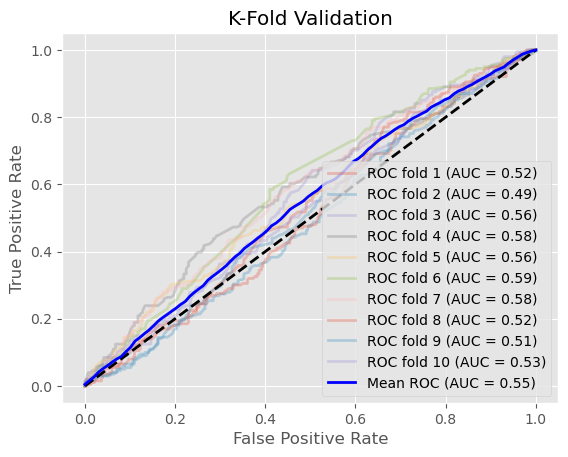

In [629]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e métricas de avaliação de performance**

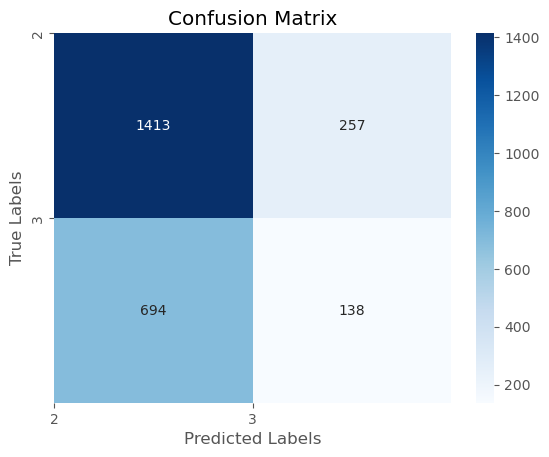

              precision    recall  f1-score   support

           2       0.67      0.85      0.75      1670
           3       0.35      0.17      0.22       832

    accuracy                           0.62      2502
   macro avg       0.51      0.51      0.49      2502
weighted avg       0.56      0.62      0.57      2502



In [630]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

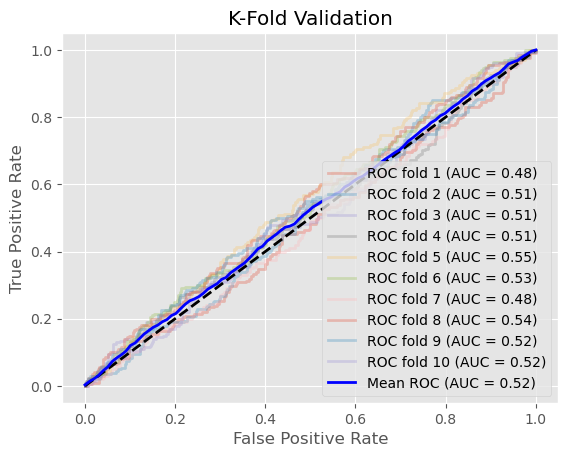

In [631]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 12 -  com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `Prize` para 2 e 3 sets - experimentar se os resultados melhoram sem a altura

In [ ]:
# drop das colunas que são referentes à altura

In [632]:
cols_to_drop = ['Height', 'HeightOpponent', 'DifHeight']

In [ ]:
# Guardar as variáveis sem a altura incluída num outro dataframe

In [633]:
df_model_without_height = df_brasil.drop(cols_to_drop, axis=1, inplace=True)

In [634]:
df_model_without_height = df_brasil.dropna()

In [635]:
df_model_without_height.head()

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,ano
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-22,2016-08-14 00:00:00,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5,2021
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2022-02-21,2016-08-14 00:00:00,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16,2022
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2,2021
3,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Semi-Finals,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,75 46 67,3,136.0,3.0,2016,19,5,14,2021
4,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-01,2016-08-14 00:00:00,Hard,0.0,Round of 64,Federico Delbonis,44.0,"Azul, Argentina",Azul,Argentina,1990-10-05,25.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,62 61,2,39.0,5.0,2016,19,3,16,2021


In [636]:
df_brasil4 = df_model_without_height[df_model_without_height['NumberSets']!=1]

In [637]:
df_brasil4 = df_model_without_height[df_model_without_height['NumberSets'] <= 3]

In [638]:
### split data in train and test set
dtf_train4, dtf_test4 = model_selection.train_test_split(df_brasil4, test_size=0.3)

## print info
print("train:", dtf_train4.shape)
print("test:", dtf_test4.shape)

train: (5835, 39)
test: (2502, 39)


- **Seleção das colunas a utilizar**

In [639]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize']

X_train = dtf_train4[X_names2].values

y_train = dtf_train4["NumberSets"].values
X_test = dtf_test4[X_names2].values
y_test = dtf_test4["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds**

In [640]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.60411311 0.58954584 0.59725793 0.60497001 0.60154242]
0.5994858611825193


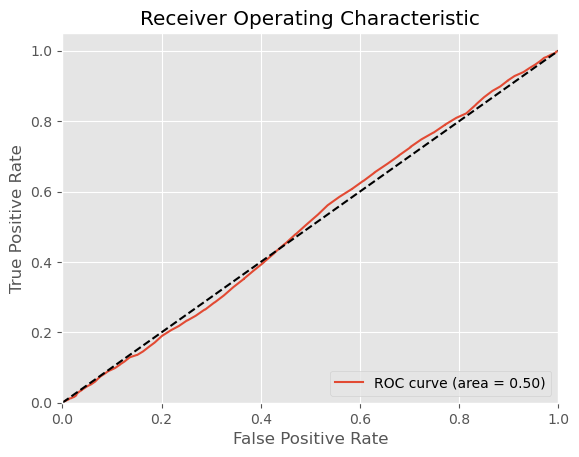

In [641]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds**

In [642]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.59589041 0.625      0.59760274 0.60787671 0.60445205 0.58319039
 0.60205832 0.60205832 0.59862779 0.62607204]
0.6042828778871684


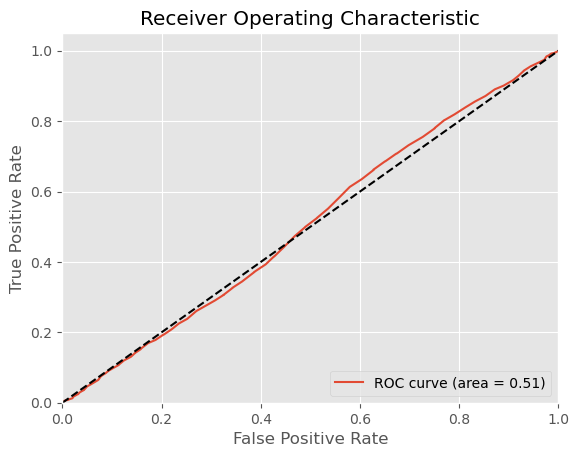

In [643]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [644]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 4 artists>

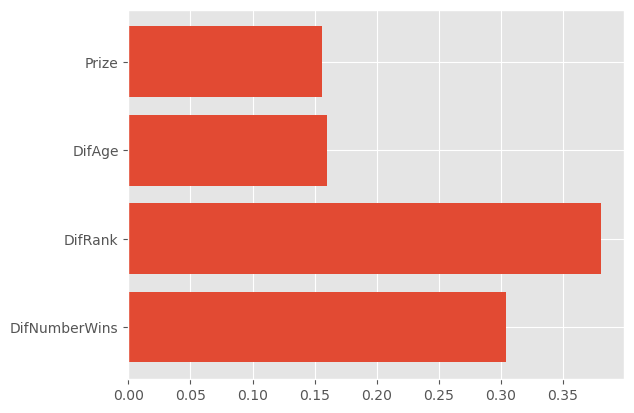

In [645]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Avaliação de performance da Decision Tree**

In [646]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.66      0.66      1641
           3       0.35      0.35      0.35       861

    accuracy                           0.55      2502
   macro avg       0.50      0.50      0.50      2502
weighted avg       0.55      0.55      0.55      2502



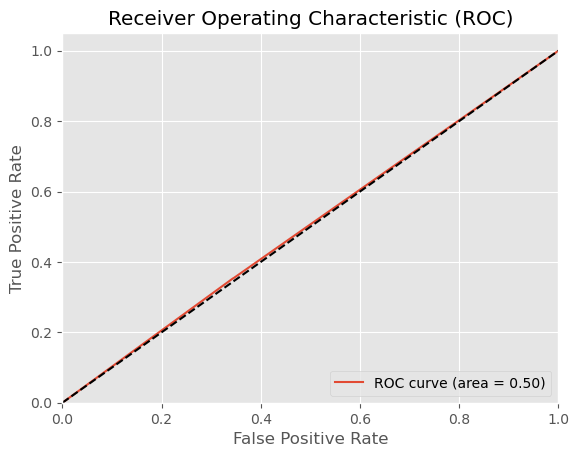

In [647]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting com 20 iterações e métricas de avaliação de performance**

In [648]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 100, 'min_samples_split': 60, 'min_samples_leaf': 7, 'max_features': 3, 'max_depth': 5, 'learning_rate': 0.01}
Best Model mean accuracy: 0.6610111396743787


In [649]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1641
           3       0.00      0.00      0.00       861

    accuracy                           0.66      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.43      0.66      0.52      2502



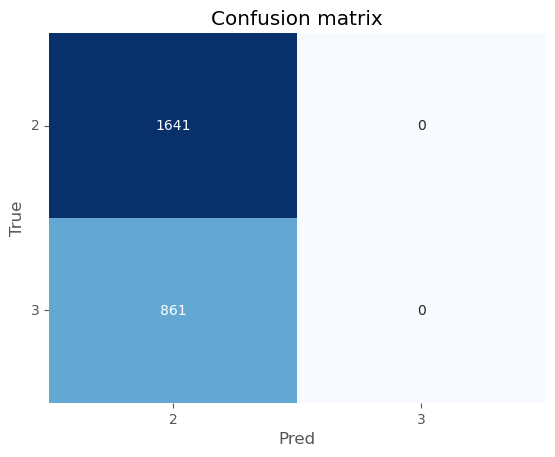

In [652]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [653]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.655875,1.000000,0.792180,1641.000000
3,0.000000,0.000000,0.000000,861.000000
accuracy,0.655875,0.655875,0.655875,0.655875
macro avg,0.327938,0.500000,0.396090,2502.000000
weighted avg,0.430172,0.655875,0.519571,2502.000000


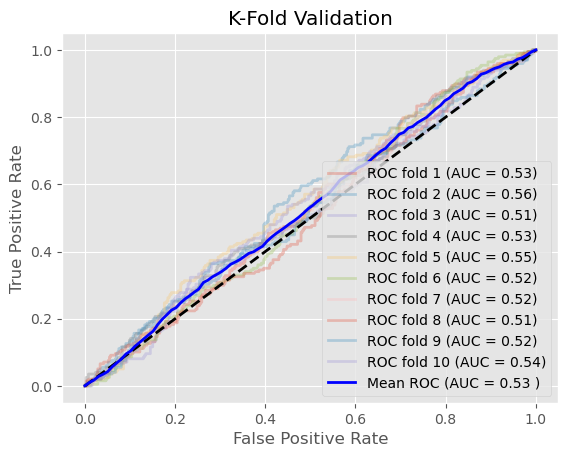

In [654]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e métricas de avaliação de performance**

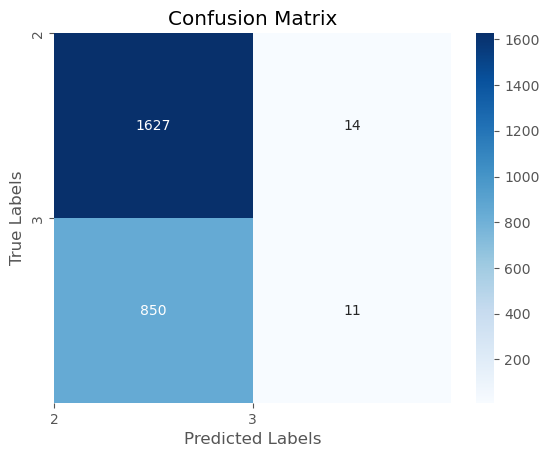

              precision    recall  f1-score   support

           2       0.66      0.99      0.79      1641
           3       0.44      0.01      0.02       861

    accuracy                           0.65      2502
   macro avg       0.55      0.50      0.41      2502
weighted avg       0.58      0.65      0.53      2502



In [655]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

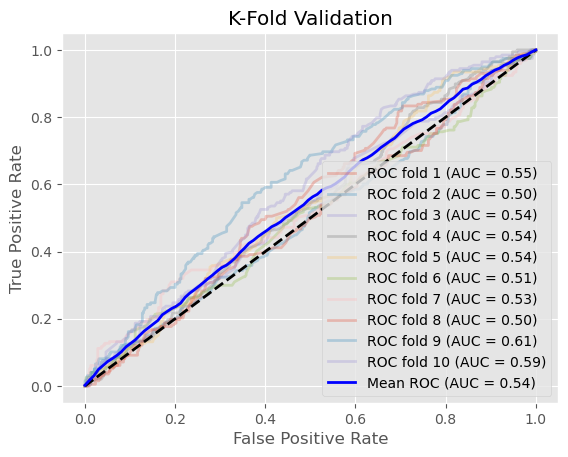

In [656]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e avaliação de performance**

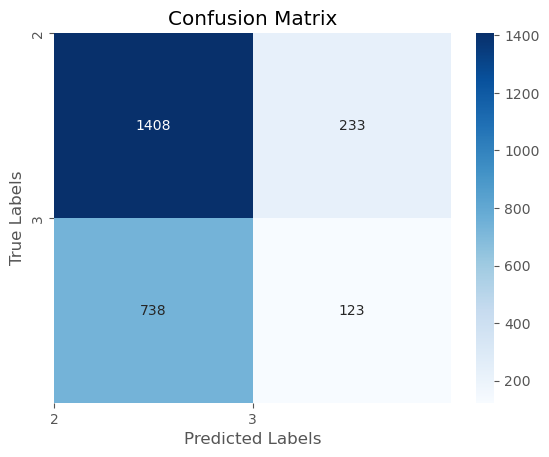

              precision    recall  f1-score   support

           2       0.66      0.86      0.74      1641
           3       0.35      0.14      0.20       861

    accuracy                           0.61      2502
   macro avg       0.50      0.50      0.47      2502
weighted avg       0.55      0.61      0.56      2502



In [657]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

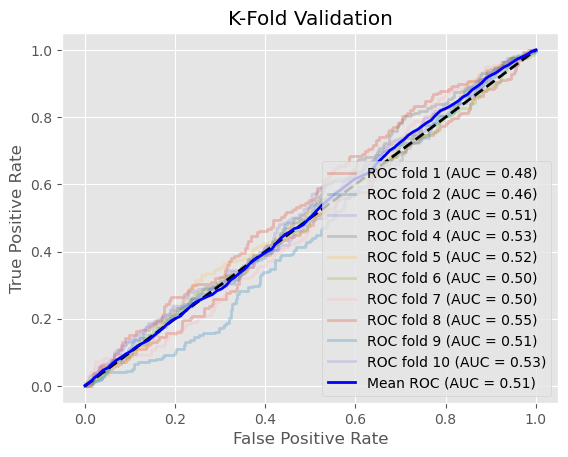

In [658]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()  
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

#### - Criação da variável `DifNumGamesByYear` e das variáveis `NumGamesPlayerByYear` e `NumGamesOpponentByYear` que lhe deram origem

In [693]:
# Converter a coluna 'DateEnd' para o tipo datetime
df['DateEnd'] = pd.to_datetime(df['DateEnd'])

In [694]:
# Extrair o ano da coluna 'DateEnd'
df['Year'] = df['DateEnd'].dt.year


In [695]:
# Criar uma nova coluna 'NumGames' com o número de jogos por jogador e ano
df_brasil['NumGamesPlayerByYear'] = df.groupby(['PlayerName', 'Year'])['PlayerName'].transform('count')

In [696]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,ano,NumGamesPlayerByYear,NumGamesOpponentByYear,DifNumGamesByYear
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-22,2016-08-14 00:00:00,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5,2021,68,57,11
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2022-02-21,2016-08-14 00:00:00,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16,2022,3,18,15
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2,2021,68,82,14


In [697]:
# Criar uma nova coluna 'NumGames' com o número de jogos por jogador e ano
df_brasil['NumGamesOpponentByYear'] = df.groupby(['Oponent', 'Year'])['PlayerName'].transform('count')

In [698]:
df_brasil['DifNumGamesByYear'] = abs(df_brasil['NumGamesPlayerByYear']-df_brasil['NumGamesOpponentByYear'])

In [699]:
df_brasil.head(3)

,PlayerName,RankPlayer,Born,BornCity,BornCountry,Birthday,AgePlayer,Hand,L_OR_R,LinkPlayer,Tournament,Location,City,Country,Date,DateStart,DateEnd,Ground,Prize,GameRound,Oponent,RankOpponent,BornOpponent,BornCityOpponent,BornCountryOpponent,BirthdayOpponent,AgeOpponent,HandOpponent,L_OR_R_Opponent,WL,Score,NumberSets,DifRank,DifAge,Year,NumberWinsPlayer,NumberWinsOpponent,DifNumberWins,ano,NumGamesPlayerByYear,NumGamesOpponentByYear,DifNumGamesByYear
0,Novak Djokovic,1.0,"Belgrade, Serbia",Belgrade,Serbia,1987-05-22,29.0,"Right-Handed, Two-Handed Backhand",Right-Handed,https://www.atptour.com/en/players/novak-djoko...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-22,2016-08-14 00:00:00,Hard,0.0,Round of 64,Juan Martin del Potro,141.0,"Tandil, Argentina",Tandil,Argentina,1988-09-23,27.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,67 67,2,140.0,2.0,2016,0,5,5,2021,68,57,11
1,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2022-02-21,2016-08-14 00:00:00,Hard,0.0,Olympic Bronze,Kei Nishikori,862.0,"Shimane, Japan",Shimane,Shimane,1989-12-29,26.0,"Right-Handed, Two-Handed Backhand",Right-Handed,L,26 76 36,3,857.0,4.0,2016,19,3,16,2022,3,18,15
2,Rafael Nadal,5.0,"Manacor, Mallorca, Spain",Manacor,Spain,1986-06-03,30.0,"Left-Handed, Two-Handed Backhand",Left-Handed,https://www.atptour.com/en/players/rafael-nada...,Rio Olympics,"Rio de Janeiro, Brazil",Rio de Janeiro,Brazil,2016.08.08 - 2016.08.14,2021-11-15,2016-08-14 00:00:00,Hard,0.0,Quarter-Finals,Thomaz Bellucci,54.0,"Tiete, Brazil",Tiete,Brazil,1987-12-30,28.0,"Left-Handed, Two-Handed Backhand",Left-Handed,W,26 64 62,3,49.0,2.0,2016,19,21,2,2021,68,82,14


---

#### Modelo 13 - sem altura e com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `Prize`, `DifNumGamesByYear`

In [702]:
df_model_without_height = df_brasil.dropna()

In [703]:
df_brasil14 = df_model_without_height[df_model_without_height['NumberSets']!=1]

In [704]:
df_brasil14 = df_model_without_height[df_model_without_height['NumberSets'] <= 3]

In [705]:
### split data in train and test set
dtf_train14, dtf_test14 = model_selection.train_test_split(df_brasil14, test_size=0.3)

## print info
print("train:", dtf_train14.shape)
print("test:", dtf_test14.shape)

train: (5835, 42)
test: (2502, 42)


- **Seleção das variáveis para este bloco**

In [706]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize', 'DifNumGamesByYear']

X_train = dtf_train14[X_names2].values

y_train = dtf_train14["NumberSets"].values
X_test = dtf_test14[X_names2].values
y_test = dtf_test14["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e métricas de avaliação**

In [707]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.63496144 0.63667524 0.62467866 0.61525278 0.61353899]
0.6250214224507284


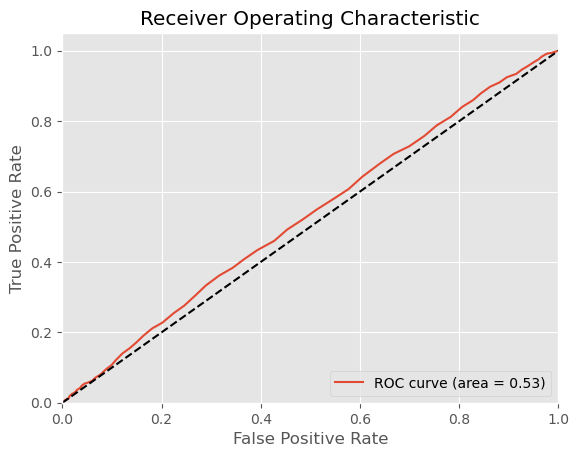

In [708]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e métricas de avaliação**

In [709]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.62157534 0.61815068 0.63356164 0.63013699 0.64383562 0.63464837
 0.61578045 0.61921098 0.62607204 0.62435678]
0.6267328884607252


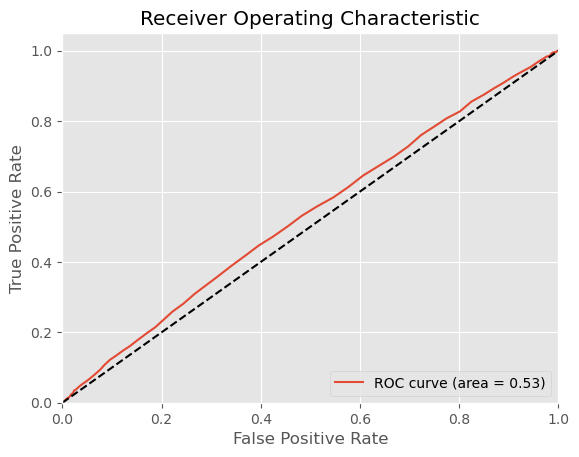

In [710]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree** 

In [711]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 5 artists>

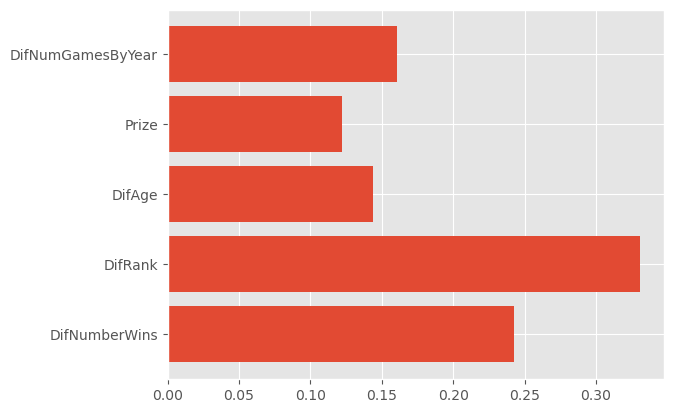

In [712]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize', 'DifNumGamesByYear']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance do Decision Tree**

In [713]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.67      0.64      0.66      1669
           3       0.34      0.36      0.35       833

    accuracy                           0.55      2502
   macro avg       0.50      0.50      0.50      2502
weighted avg       0.56      0.55      0.55      2502



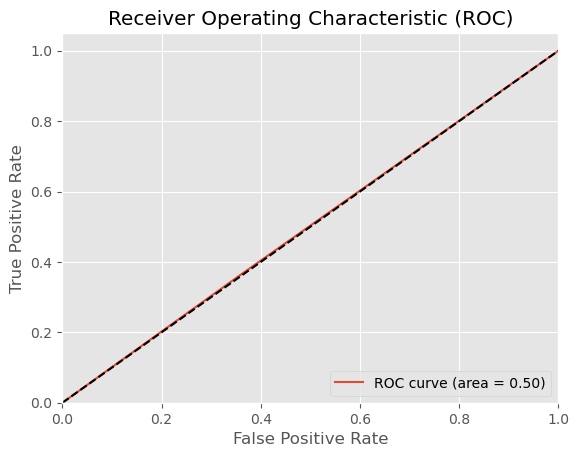

In [714]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting e métricas da sua perfomance**

In [715]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.8, 'n_estimators': 1500, 'min_samples_split': 20, 'min_samples_leaf': 1, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6555269922879178


In [716]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.67
Precision (confidence when predicting a 1): 0.67
Detail:
              precision    recall  f1-score   support

           2       0.67      1.00      0.80      1669
           3       0.00      0.00      0.00       833

    accuracy                           0.67      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.44      0.67      0.53      2502



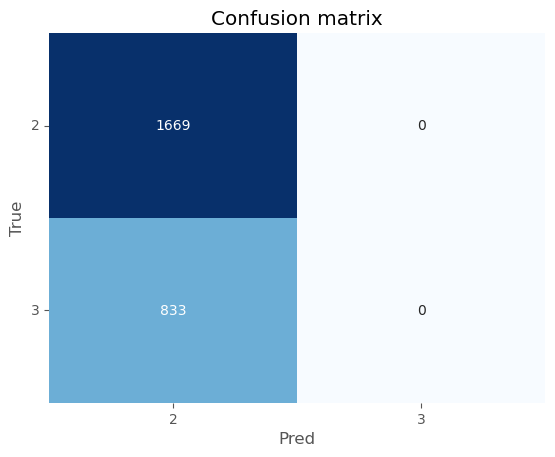

In [717]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [718]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.667341,0.988017,0.796618,1669.000000
3,0.354839,0.013205,0.025463,833.000000
accuracy,0.663469,0.663469,0.663469,0.663469
macro avg,0.511090,0.500611,0.411041,2502.000000
weighted avg,0.563299,0.663469,0.539875,2502.000000


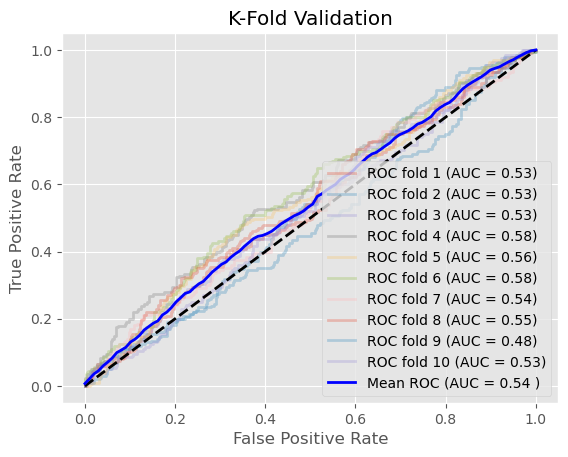

In [719]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e a sua performance medida**

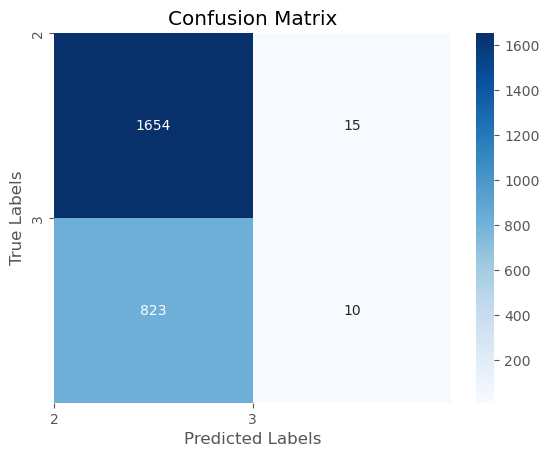

              precision    recall  f1-score   support

           2       0.67      0.99      0.80      1669
           3       0.40      0.01      0.02       833

    accuracy                           0.67      2502
   macro avg       0.53      0.50      0.41      2502
weighted avg       0.58      0.67      0.54      2502



In [720]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

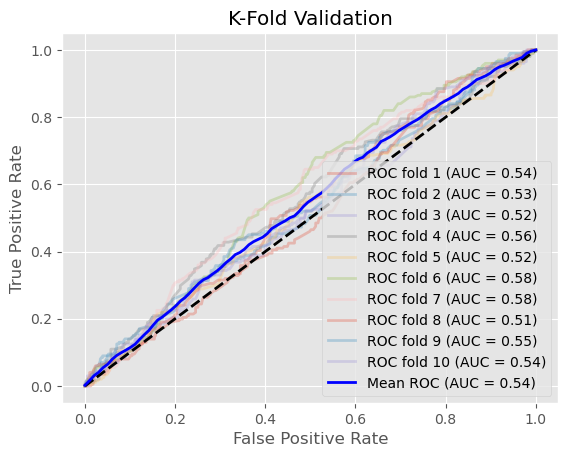

In [721]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e métricas de avaliação de performance**

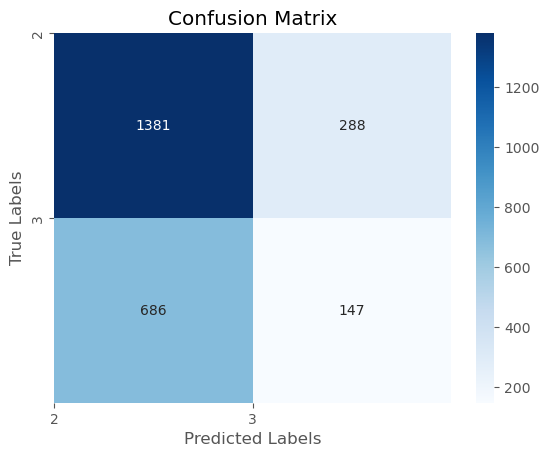

              precision    recall  f1-score   support

           2       0.67      0.83      0.74      1669
           3       0.34      0.18      0.23       833

    accuracy                           0.61      2502
   macro avg       0.50      0.50      0.49      2502
weighted avg       0.56      0.61      0.57      2502



In [722]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

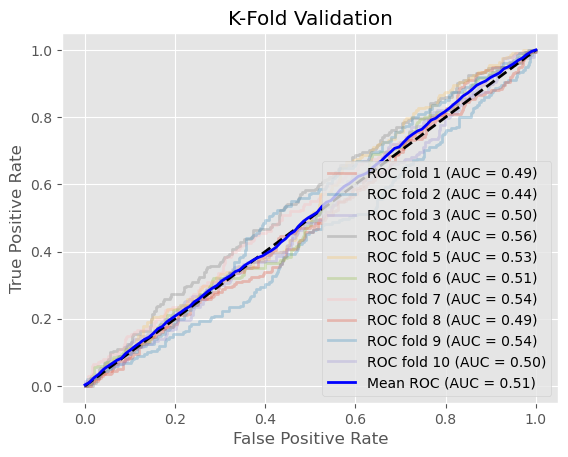

In [723]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()  
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

---

#### Modelo 14 - sem altura e com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `Prize`, `DifNumGamesByYear`

In [724]:
df_model_without_height = df_brasil.dropna()

In [725]:
df_brasil15 = df_model_without_height[df_model_without_height['NumberSets']!=1]

In [726]:
df_brasil15 = df_model_without_height[df_model_without_height['NumberSets'] <= 3]

In [727]:
### split data in train and test set
dtf_train15, dtf_test15 = model_selection.train_test_split(df_brasil15, test_size=0.3)

## print info
print("train:", dtf_train15.shape)
print("test:", dtf_test15.shape)

train: (5835, 42)
test: (2502, 42)


- **Seleção de variáveis para este bloco**

In [728]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'DifNumGamesByYear']

X_train = dtf_train15[X_names2].values

y_train = dtf_train15["NumberSets"].values
X_test = dtf_test15[X_names2].values
y_test = dtf_test15["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 folds e métricas de performance**

In [729]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.63153385 0.61353899 0.62210797 0.60325621 0.62467866]
0.6190231362467867


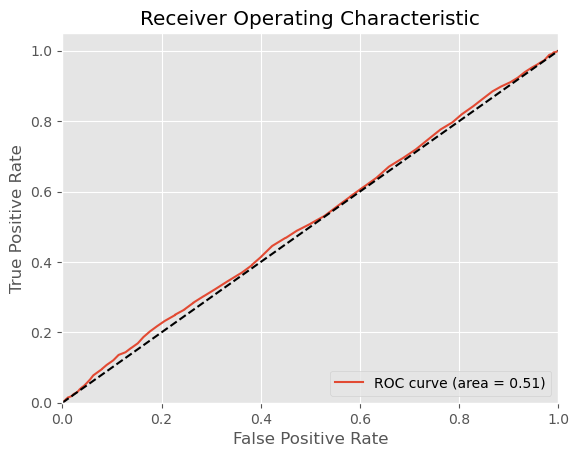

In [730]:
# curva ROC e AUC - 5 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 folds e métricas de performance**

In [731]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.63869863 0.64554795 0.61643836 0.625      0.64726027 0.62950257
 0.61234991 0.59519726 0.63464837 0.61234991]
0.6256993232923705


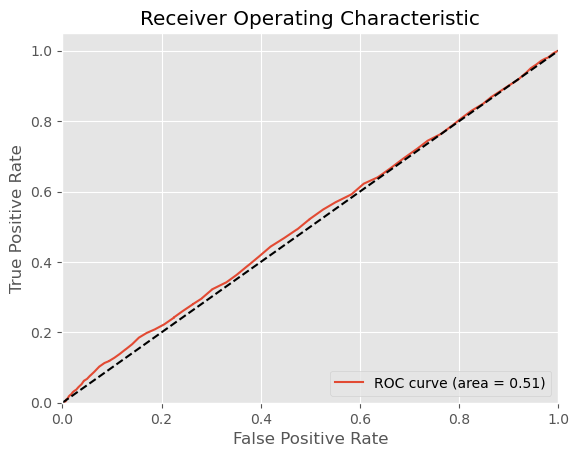

In [732]:
# curva ROC e AUC - 10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [733]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

<BarContainer object of 4 artists>

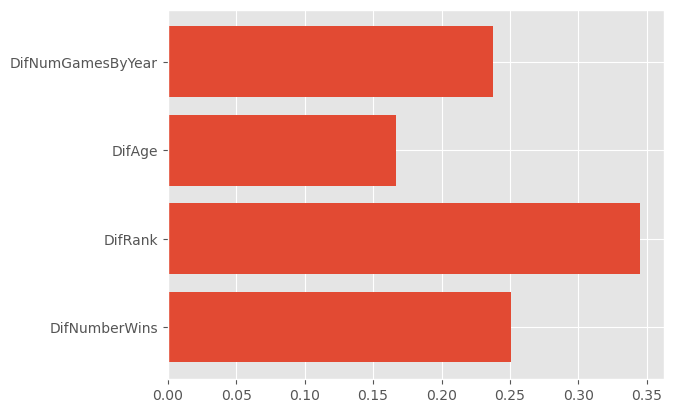

In [734]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'DifNumGamesByYear']
plt.barh(feature_names, dt.feature_importances_) # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [735]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.66      0.65      0.66      1631
           3       0.37      0.38      0.38       871

    accuracy                           0.56      2502
   macro avg       0.52      0.52      0.52      2502
weighted avg       0.56      0.56      0.56      2502



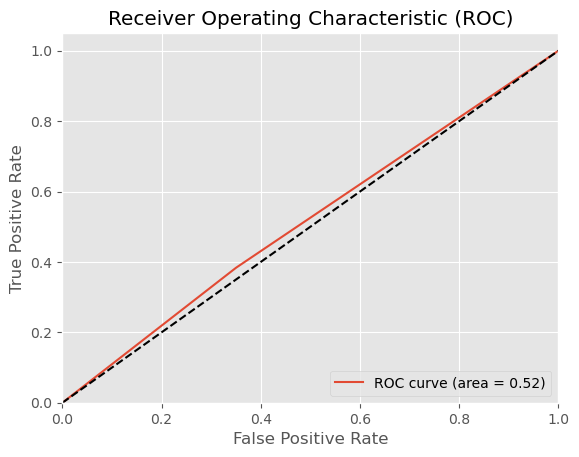

In [736]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Gradient Boosting e métricas de avaliação de performance**

In [737]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.9, 'n_estimators': 100, 'min_samples_split': 60, 'min_samples_leaf': 7, 'max_features': 3, 'max_depth': 5, 'learning_rate': 0.01}
Best Model mean accuracy: 0.6628963153384746


In [738]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.65
Precision (confidence when predicting a 1): 0.65
Detail:
              precision    recall  f1-score   support

           2       0.65      1.00      0.79      1631
           3       0.00      0.00      0.00       871

    accuracy                           0.65      2502
   macro avg       0.33      0.50      0.39      2502
weighted avg       0.42      0.65      0.51      2502



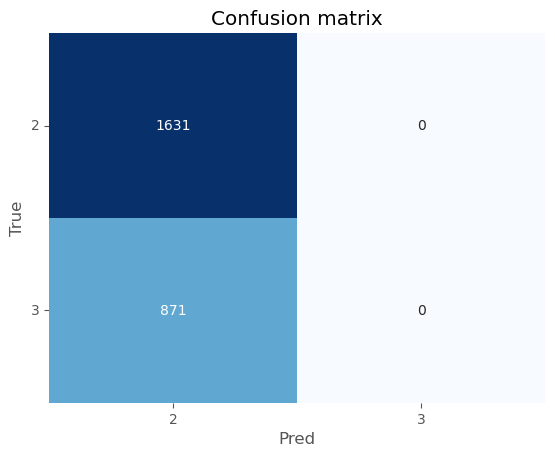

In [739]:
## confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [740]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.651878,1.000000,0.789257,1631.000000
3,0.000000,0.000000,0.000000,871.000000
accuracy,0.651878,0.651878,0.651878,0.651878
macro avg,0.325939,0.500000,0.394629,2502.000000
weighted avg,0.424946,0.651878,0.514500,2502.000000


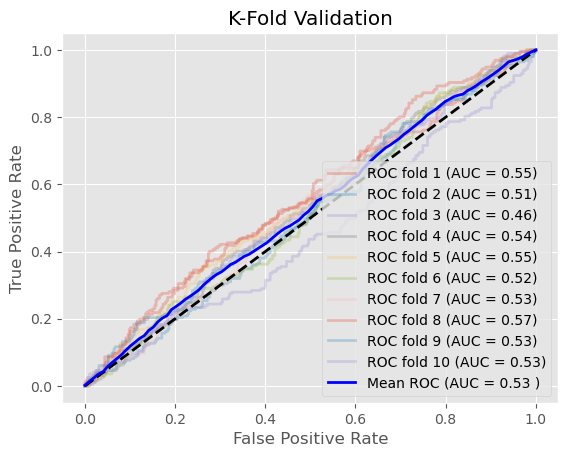

In [741]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo AdaBoost e métricas de avaliação de performance**

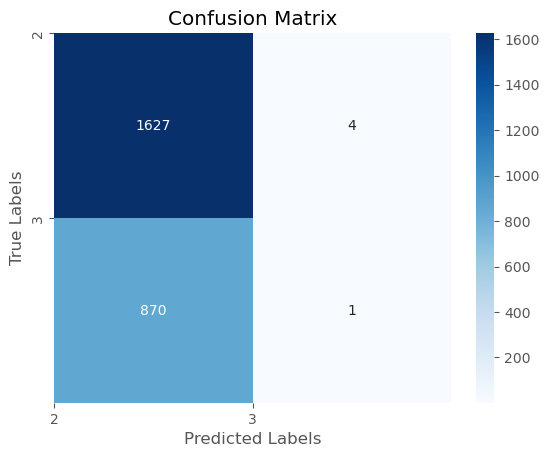

              precision    recall  f1-score   support

           2       0.65      1.00      0.79      1631
           3       0.20      0.00      0.00       871

    accuracy                           0.65      2502
   macro avg       0.43      0.50      0.40      2502
weighted avg       0.49      0.65      0.51      2502



In [742]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

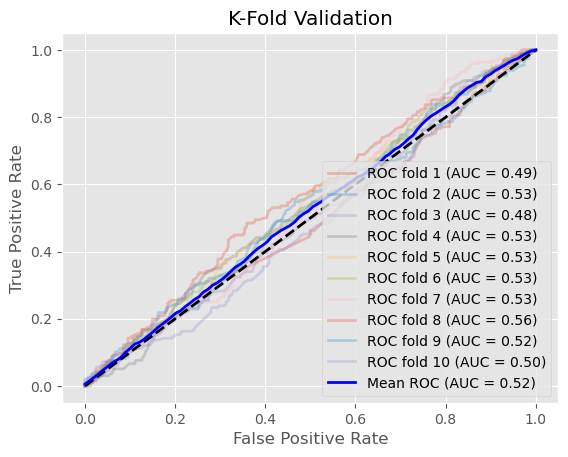

In [743]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e métricas de avaliação de performance**

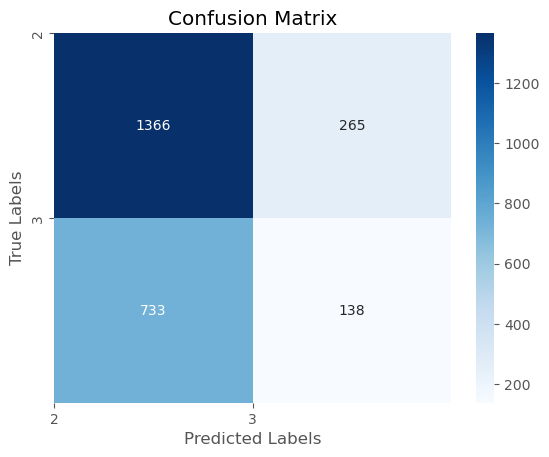

              precision    recall  f1-score   support

           2       0.65      0.84      0.73      1631
           3       0.34      0.16      0.22       871

    accuracy                           0.60      2502
   macro avg       0.50      0.50      0.47      2502
weighted avg       0.54      0.60      0.55      2502



In [744]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

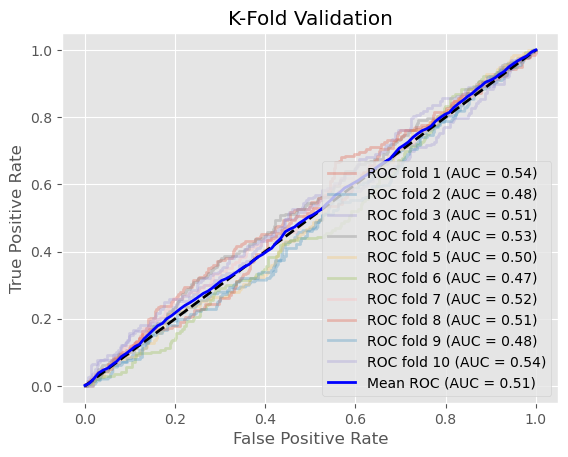

In [745]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()  
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

#### Modelo 15 - com as variáveis `DifNumberWins`, `DifRank`, `DifAge`, `Prize`, `DifHands`, `Ground_Clay`, `Ground_Hard`, `DifNumGamesByYear` para 2 ou 3 sets

In [750]:
df_model_without_height = df_brasil.dropna()

In [751]:
df_brasil16 = df_model_without_height[df_model_without_height['NumberSets']!=1]

In [752]:
df_brasil16 = df_model_without_height[df_model_without_height['NumberSets'] <= 3]

In [753]:
### split data in train and test set
dtf_train16, dtf_test16 = model_selection.train_test_split(df_brasil16, test_size=0.3)

## print info
print("train:", dtf_train16.shape)
print("test:", dtf_test16.shape)

train: (5835, 42)
test: (2502, 42)


In [754]:
# dummy DifHands teste
dtf_test16['DifHands'] = (dtf_test16['L_OR_R'] != dtf_test16['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_test16['DifHands'], drop_first=True)


dtf_test16 = pd.concat([dtf_test16, dummy1], axis=1)


dtf_test16 = dtf_test16.drop("L_OR_R", axis=1)
dtf_test16 = dtf_test16.drop("L_OR_R_Opponent", axis=1)

In [755]:
# dummy DifHands treino
dtf_train16['DifHands'] = (dtf_train16['L_OR_R'] != dtf_train16['L_OR_R_Opponent']).astype(int)


dummy1 = pd.get_dummies(dtf_train16['DifHands'], drop_first=True)


dtf_train16 = pd.concat([dtf_train16, dummy1], axis=1)


dtf_train16 = dtf_train16.drop("L_OR_R", axis=1)
dtf_train16 = dtf_train16.drop("L_OR_R_Opponent", axis=1)

In [756]:
# dummy Ground treino
dummy2 = pd.get_dummies(dtf_train16["Ground"], prefix="Ground",drop_first=True)
dtf_train16 = pd.concat([dtf_train16, dummy2], axis=1)

## drop the original categorical column
dtf_train16 = dtf_train16.drop("Ground", axis=1)

In [757]:
# dummy Ground teste
dummy2 = pd.get_dummies(dtf_test16["Ground"], prefix="Ground",drop_first=True)
dtf_test16 = pd.concat([dtf_test16, dummy2], axis=1)

## drop the original categorical column
dtf_test16 = dtf_test16.drop("Ground", axis=1)

In [758]:
columns_to_convert = ["DifHands", 'Ground_Clay', 'Ground_Hard']


for column in columns_to_convert:
    dtf_train16[column] = dtf_train16[column].astype('category')

- **Seleção de variáveis a ser usadas para este bloco**

In [759]:
X_names2 = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize',  'DifHands', 'Ground_Clay', 'Ground_Hard', 'DifNumGamesByYear']

X_train = dtf_train16[X_names2].values

y_train = dtf_train16["NumberSets"].values
X_test = dtf_test16[X_names2].values
y_test = dtf_test16["NumberSets"].values

- **Validação Cruzada com Random Forest com 5 fold e respetivas métricas de avaliação de performance**

In [760]:
### random forest - 5 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.62724936 0.62639246 0.62125107 0.62553556 0.63067695]
0.6262210796915167


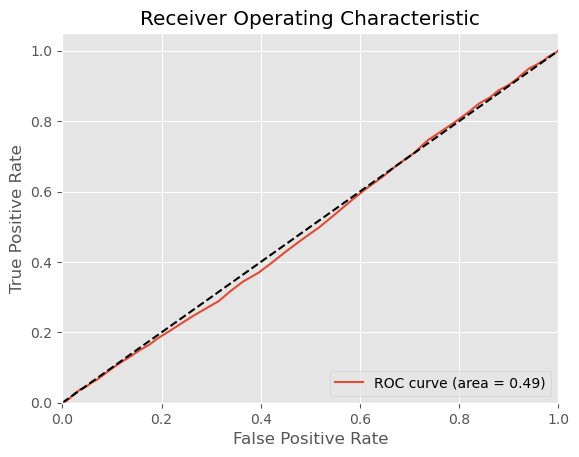

In [761]:
# curva ROC e AUC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=5, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Validação Cruzada com Random Forest com 10 fold e respetivas métricas de avaliação de performance**

In [762]:
### random forest - 10 folds

rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,X_train,y_train,cv=10)
print(cv)
print(cv.mean())

[0.61472603 0.63013699 0.61815068 0.625      0.61472603 0.61406518
 0.62607204 0.61921098 0.62092624 0.66209262]
0.6245106792922768


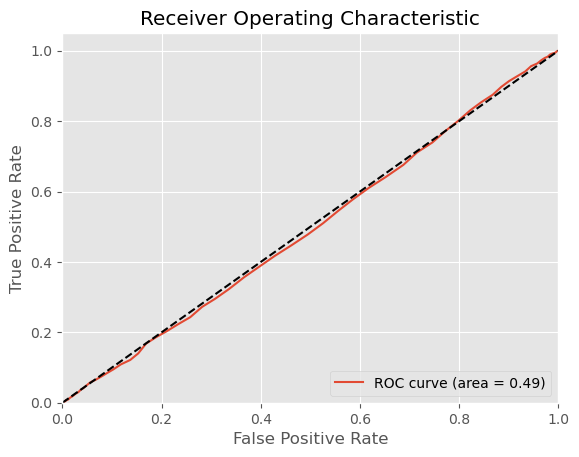

In [763]:
# curva ROC e AUC -10 folds
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict

rf = RandomForestClassifier(random_state=1)
y_scores = cross_val_predict(rf, X_train, y_train, cv=10, method='predict_proba')
fpr, tpr, thresholds = roc_curve(y_train, y_scores[:, 1], pos_label=3.0)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Decision Tree**

In [765]:
### fit decision tree
dt = tree.DecisionTreeClassifier(random_state = 1)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

- **Feature Importance**

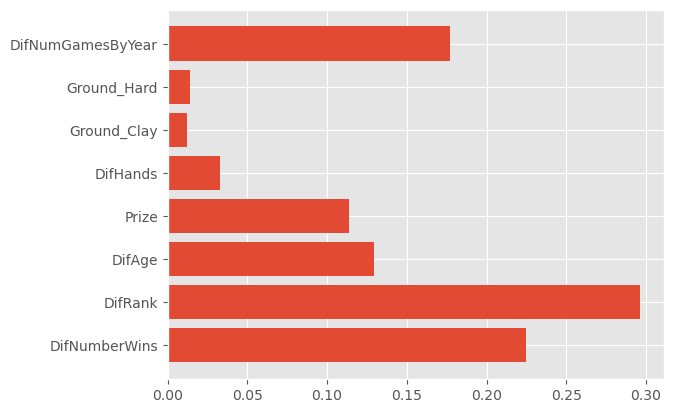

In [766]:
### feature importance
feature_names = ['DifNumberWins', 'DifRank', 'DifAge', 'Prize',  'DifHands', 'Ground_Clay', 'Ground_Hard', 'DifNumGamesByYear']
plt.barh(feature_names, dt.feature_importances_); # representação da imp das var 

- **Métricas de avaliação de performance para a Decision Tree**

In [767]:
from sklearn.metrics import classification_report

# prever valores para o conjunto de teste
y_pred = dt.predict(X_test)

# calcular as métricas
report = classification_report(y_test, y_pred)

# exibir o relatório de métricas
print(report)

              precision    recall  f1-score   support

           2       0.67      0.66      0.66      1647
           3       0.36      0.37      0.37       855

    accuracy                           0.56      2502
   macro avg       0.52      0.52      0.52      2502
weighted avg       0.56      0.56      0.56      2502



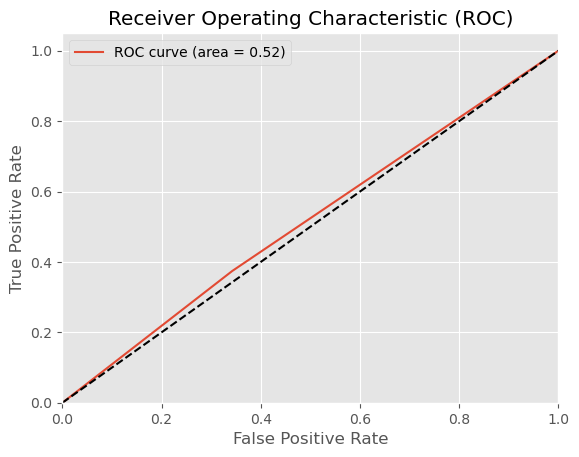

In [769]:
# curva ROC e AUC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import roc_curve, auc

# Convert true labels to binary
y_test_binary = np.where(y_test == 2, 0, 1)

# Fit the decision tree classifier
dt = tree.DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt.predict_proba(X_test)

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred[:, 1])

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend()

- **Algoritmo Gradient Boosting e as suas métricas de avaliação de performance**

In [770]:
## call model
model = ensemble.GradientBoostingClassifier()
## define hyperparameters combinations to try
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
'max_depth':[2,3,4,5,6,7],    #maximum depth of the tree
'min_samples_split':[2,4,6,8,10,20,40,60,100],    #sets the minimum number of samples to split
'min_samples_leaf':[1,3,5,7,9],     #the minimum number of samples to form a leaf
'max_features':[2,3],     #square root of features is usually a good starting point
'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}       #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.
## random search
random_search = model_selection.RandomizedSearchCV(model, 
       param_distributions=param_dic, n_iter=20, 
       scoring="accuracy", random_state=42).fit(X_train, y_train)
print("Best Model parameters:", random_search.best_params_)
print("Best Model mean accuracy:", random_search.best_score_)
model = random_search.best_estimator_

Best Model parameters: {'subsample': 0.8, 'n_estimators': 1500, 'min_samples_split': 20, 'min_samples_leaf': 1, 'max_features': 2, 'max_depth': 3, 'learning_rate': 0.005}
Best Model mean accuracy: 0.6616966580976864


In [771]:
## Precision e Recall
#recall = metrics.recall_score(y_test, predicted)
recall = metrics.recall_score(y_test, predicted, average='micro')
precision = metrics.precision_score(y_test, predicted, average='micro')
#precision = metrics.precision_score(y_test, predicted)
print("Recall (all 1s predicted right):", round(recall,2))
print("Precision (confidence when predicting a 1):", round(precision,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in np.unique(y_test)]))

Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.66
Detail:
              precision    recall  f1-score   support

           2       0.66      1.00      0.79      1647
           3       0.00      0.00      0.00       855

    accuracy                           0.66      2502
   macro avg       0.33      0.50      0.40      2502
weighted avg       0.43      0.66      0.52      2502



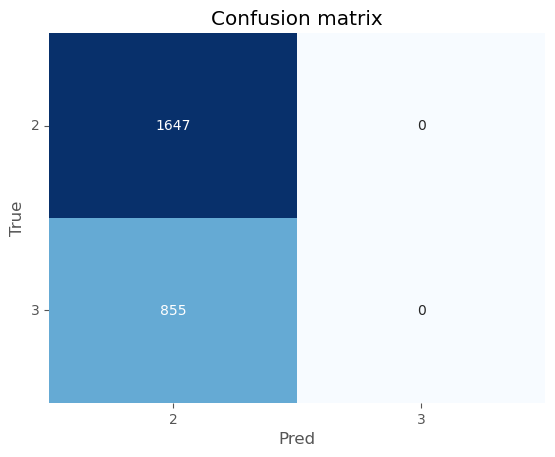

In [772]:
# confusion matrix
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
ax.set_xticklabels(labels=classes, rotation=0)
plt.show()

In [773]:
y_pred = random_search.predict(X_test)
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
2,0.659412,0.993321,0.792636,1647.000000
3,0.476190,0.011696,0.022831,855.000000
accuracy,0.657874,0.657874,0.657874,0.657874
macro avg,0.567801,0.502509,0.407733,2502.000000
weighted avg,0.596800,0.657874,0.529573,2502.000000


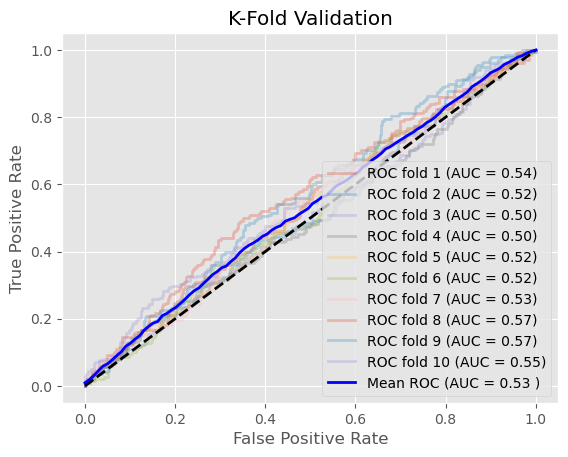

In [774]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True) 
tprs, aucs = [], []
mean_fpr = np.linspace(0,1,100)
fig = plt.figure()
i = 1
for train, test in cv.split(X_train, y_train): # permuta conj de teste e validação e estudo accuracy
    prediction = model.fit(X_train[train], y_train[train]).predict_proba(X_train[test])
    fpr, tpr, t = metrics.roc_curve(y_train[test], prediction[:, 1], pos_label=3.0)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i = i+1

plt.plot([0,1], [0,1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f )' % (mean_auc), lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc="lower right")
plt.show()

- **Algoritmo Adaboost e as suas métricas de avaliação de performance**

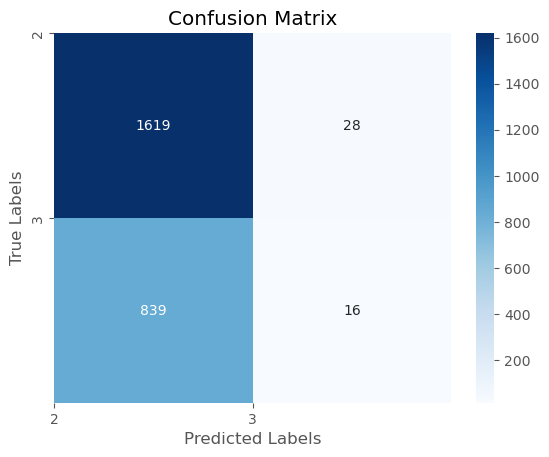

              precision    recall  f1-score   support

           2       0.66      0.98      0.79      1647
           3       0.36      0.02      0.04       855

    accuracy                           0.65      2502
   macro avg       0.51      0.50      0.41      2502
weighted avg       0.56      0.65      0.53      2502



In [775]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the AdaBoost classifier
model = AdaBoostClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

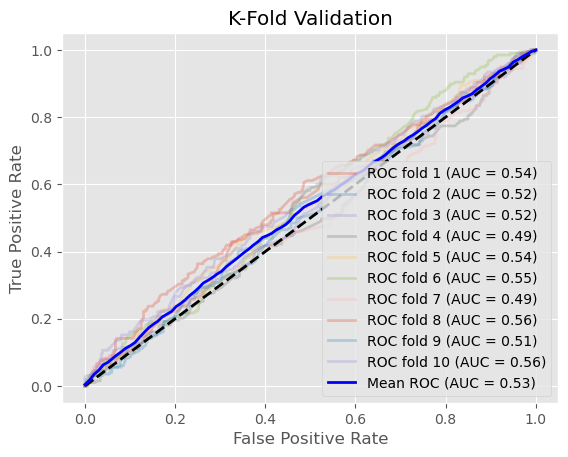

In [776]:
# curva ROC e AUC
from sklearn.ensemble import AdaBoostClassifier

cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the AdaBoost classifier
    model = AdaBoostClassifier(random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()

- **Algoritmo XGBoost e as suas métricas de avaliação de performance**

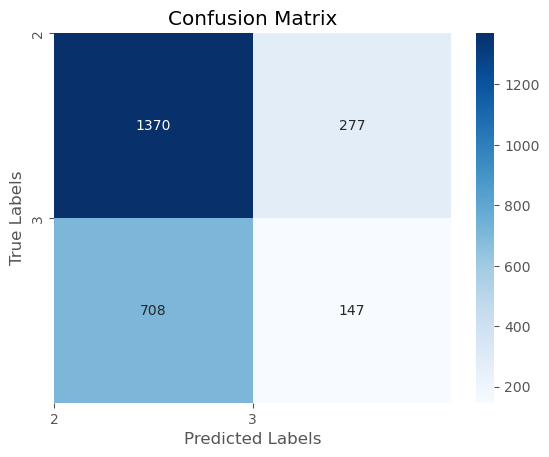

              precision    recall  f1-score   support

           2       0.66      0.83      0.74      1647
           3       0.35      0.17      0.23       855

    accuracy                           0.61      2502
   macro avg       0.50      0.50      0.48      2502
weighted avg       0.55      0.61      0.56      2502



In [777]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Convert labels from [2, 3] to [0, 1]
y_train_binary = np.where(y_train == 2, 0, 1)
y_test_binary = np.where(y_test == 2, 0, 1)

# Create the XGBoost classifier
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model
model.fit(X_train, y_train_binary)

# Make predictions on the test set
y_pred_binary = model.predict(X_test)

# Convert predicted labels from [0, 1] to [2, 3]
y_pred = np.where(y_pred_binary == 0, 2, 3)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Set the tick labels
tick_labels = ['2', '3']
plt.xticks(ticks=[0, 1], labels=tick_labels)
plt.yticks(ticks=[0, 1], labels=tick_labels)

# Add labels and title to the plot
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Calculate precision, recall, f1-score, and support
report = classification_report(y_test, y_pred, target_names=['2', '3'])

# Print the classification report
print(report)

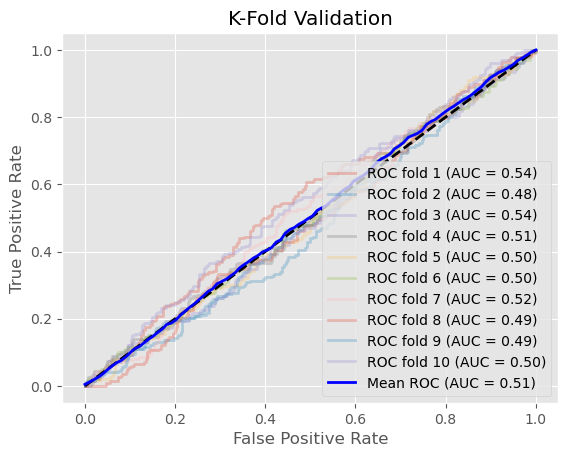

In [778]:
# curva ROC e AUC
cv = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
tprs, aucs = [], []
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure()  
i = 1

for train, test in cv.split(X_train, y_train):
    # Convert labels from [2, 3] to [0, 1]
    y_train_binary = np.where(y_train[train] == 2, 0, 1)
    y_test_binary = np.where(y_train[test] == 2, 0, 1)

    # Create the XGBoost classifier
    model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

    # Train the model
    model.fit(X_train[train], y_train_binary)

    # Make predictions on the test set
    y_pred_binary = model.predict_proba(X_train[test])[:, 1]

    fpr, tpr, t = metrics.roc_curve(y_test_binary, y_pred_binary)
    tprs.append(scipy.interp(mean_fpr, fpr, tpr))
    roc_auc = metrics.auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = metrics.auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue', label=r'Mean ROC (AUC = %0.2f)' % mean_auc, lw=2, alpha=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('K-Fold Validation')
plt.legend(loc='lower right')
plt.show()